In [1]:
#  Load the "autoreload" extension so that code can change
%load_ext autoreload
%reload_ext autoreload
from pathlib import Path

#  always reload modules so that as you change code in src, it gets loaded
%autoreload 2
%matplotlib inline

import sys
sys.path.append('../')
from src.imports import *
from src.gen_functions import *
from src.features.dataset import Dataset
from src.features.build_features import *
from src.models.train_model import *
from src.visualization.vis_data import *
from src.visualization.mapper import *

import seaborn as sns
output_notebook()
plt.rcParams.update({'font.size': 14})

# for doing t-test
from scipy.stats import ttest_ind, mannwhitneyu, spearmanr, pearsonr

Loading BokehJS ...

In [2]:
raw_folder = '../data/bma_raw/'
proc_folder = raw_folder + 'process/'
final_folder =  raw_folder + 'final/'
bkp_folder = update_folder = to_folder = '../data/bkp_hourly/'
air4_thai = '../data/air4thai_hourly/'

# Traffic And Pollution During the Shutdown 2020

In [25]:
# use Firefox to open the website
# does not work yet 
url = 'https://traffic.longdo.com/trafficdaily?sort=peak'
browser = webdriver.Firefox()
browser.get(url)
time.sleep(5)
innerhtml = browser.execute_script("return document.body.innerHTML")
soup = BeautifulSoup(innerhtml)
browser.close()

In [3]:
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

t_files  = t_files[1:-1]
t_files

../data/traffic\2017-2020_hourly_CI.csv


['../data/traffic\\2017-2020_hourly_stats_final.csv',
 '../data/traffic\\daily2020.csv',
 '../data/traffic\\trafficindex2012.csv',
 '../data/traffic\\trafficindex2013.csv',
 '../data/traffic\\trafficindex2014.csv',
 '../data/traffic\\trafficindex2015.csv',
 '../data/traffic\\trafficindex2016.csv',
 '../data/traffic\\trafficindex2017.csv',
 '../data/traffic\\trafficindex2018.csv',
 '../data/traffic\\trafficindex2019.csv',
 '../data/traffic\\trafficindex2020.csv']

In [12]:
pm25_start_date = '2014-08-13 18:00:00'
trf_miss_date = '2018-01-03 00:00:00'

In [13]:
# hourly traffic data before 2020
trf_prev = []

for file in t_files[1:]:
    trf_prev.append(pd.read_csv(file))
    
trf_prev = pd.concat(trf_prev) 
trf_prev['datetime'] = pd.to_datetime(trf_prev['datetime'] )
trf_prev = trf_prev.set_index('datetime')
# remove the data before the first data point of PM2.5
trf_prev = trf_prev.loc[pm25_start_date:]

In [14]:
# traffic daily traffic data in 2020
trf = pd.read_csv(t_files[0])
trf = trf.iloc[:,1:]
trf.columns = ['date', 'max', 'mean']
 # extract months and date 
trf['month'] = trf['date'].str.extract('(\D+)').iloc[:,0]
trf['day'] = trf['date'].str.extract('(\d+)').iloc[:,0]
month_list = trf['month'].unique().tolist()

month_dict = {}
for i, m in enumerate(month_list):
    i += 1
    if len(str(i))==1:
        month_dict[m] = '-0'+str(i)
    else:
        month_dict[m] = '-'+ str(i)
        
print(month_dict)

# change month to number 
trf['month'] = trf['month'].replace(month_dict)

# combine month, date into one strings
date_list = []
for i, row in trf.iterrows():
    if len(row['day']) == 1:
        day = '-0' + row['day']
    else:
        day = '-' + row['day']
    new_date = '2020'+row['month'] + day
    date_list.append(new_date)
    
trf['date'] = pd.to_datetime(date_list)
trf = trf[['date','max','mean']].set_index('date')

{'มกราคม': '-01', 'กุมภาพันธ์': '-02', 'มีนาคม': '-03', 'เมษายน': '-04', 'พฤษภาคม': '-05', 'มิถุนายน': '-06', 'กรกฎาคม': '-07', 'สิงหาคม': '-08', 'กันยายน': '-09', 'ตุลาคม': '-10', 'พฤศจิกายน': '-11', 'ธันวาคม': '-12'}


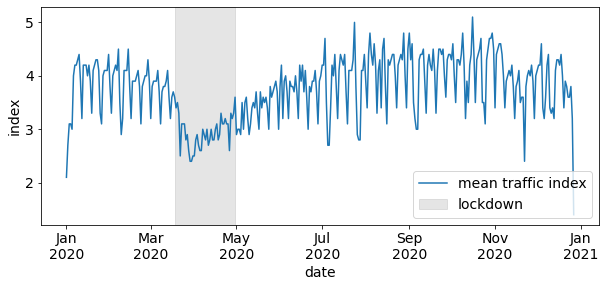

In [22]:
_, ax = plt.subplots(figsize=(10,4))
ax.plot(trf.index, trf['mean'], label='mean traffic index')

ax.xaxis.set_major_formatter(mdates.DateFormatter("%b\n%Y"))
ax.axvspan(datetime(2020, 3, 18), datetime(2020, 4, 30), color='gray', alpha=0.2, label='lockdown' )
ax.set_xlabel('date')
ax.set_ylabel('index')
ax.legend(loc='lower right')


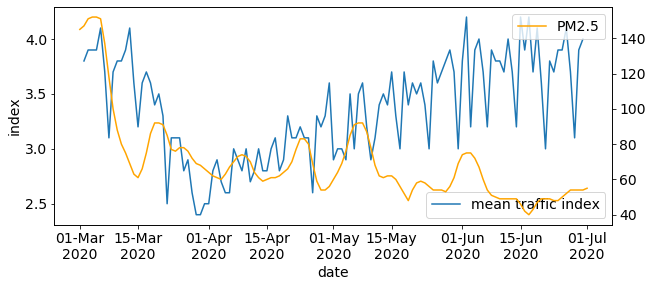

In [177]:
temp = trf[(trf['date'] > '2020-03-01' ) & (trf['date'] < '2020-07-01' )]

_, ax = plt.subplots(figsize=(10,4))
ax.plot(temp['date'], temp['mean'], label='mean traffic index')


#ax.axvspan(datetime(2020, 3, 18), datetime(2020, 4, 30), color='gray', alpha=0.2, label='lockdown' )
ax.set_xlabel('date')
ax.set_ylabel('index')

a = ax.twinx()
temp = poll_aqi.loc[ '2020-03-01':'2020-07-01' ]
a.plot(  temp['PM2.5'], label='PM2.5', color='orange')
a.legend()

ax.legend(loc='lower right')
ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%b\n%Y"))

In [100]:
# load the data  
dataset = Dataset('Bangkok')
dataset.load_()
#dataset.feature_no_fire()
poll_df = dataset.poll_df

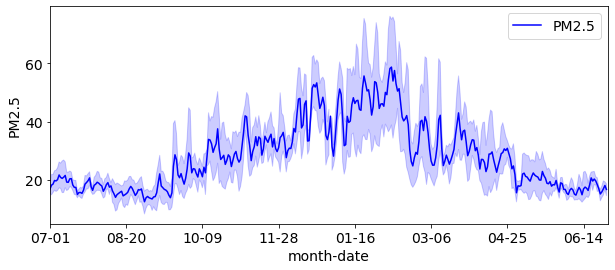

In [195]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
winter_day_dict, mean_df = plot_season_avg(poll_before2020.copy(),  'PM2.5', ax)

In [101]:
poll_before2020 = poll_df.loc[:'2019-12-31']
poll_2020 = poll_df.loc['2020-01-01':].copy()
#poll_aqi = poll_to_aqi(poll_2020, dataset.roll_dict)
poll_2020 = poll_2020.resample('d').mean()
poll_2020['dayofyear'] = poll_2020.index.dayofyear
poll_2020['year'] = poll_2020.index.year

# add winter day by substratcing the first day of july
offset = 183
winterday = poll_2020['dayofyear'] - offset  
# get rid of the negative number
winter_day_max = 365 - offset
winterday[winterday < 0] = winterday[winterday < 0] + offset + winter_day_max  +1 
poll_2020['winter_day'] = winterday

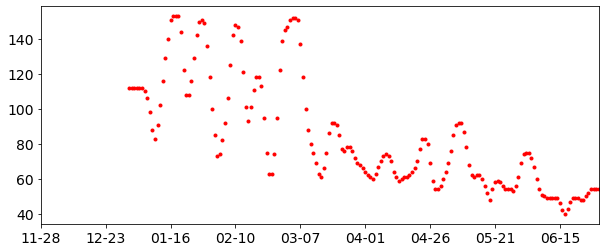

In [163]:
_, ax = plt.subplots(1,1,  figsize=(10, 4))
ax.scatter(poll_aqi['winter_day'], poll_aqi['PM2.5'], color='red', marker='.')
ax.set_xlim([150, 365])
new_ticks = []
for t in ax.get_xticklabels():
    try:
        new_t = winter_day_dict[str(int(t._x))]
    except:
        new_t = ''
    new_ticks.append(new_t)
    
print(new_ticks)

In [102]:
# add winter day for traffic 
trf['dayofyear'] = trf.index.dayofyear
offset = 183
winterday = trf['dayofyear'] - offset  
# get rid of the negative number
winter_day_max = 365 - offset
winterday[winterday < 0] = winterday[winterday < 0] + offset + winter_day_max  +1 
trf['winter_day'] = winterday

# take daily average of traffic index before 2020
trf_prev_d = trf_prev.loc[trf_miss_date:].resample('d').mean()
trf_prev_d['dayofyear'] = trf_prev_d.index.dayofyear
trf_prev_d['dayofweek'] = trf_prev_d.index.dayofweek

# lock down start/end date in day of year 
lock_start = 82
lock_end = 102

# lock down start/end date in winter deay 
lock_w_start = 265
lock_w_end = 285

In [51]:
print(winter_day_dict[str(lock_w_start)])
print(winter_day_dict[str(lock_w_end)])

Mar-22
Apr-11


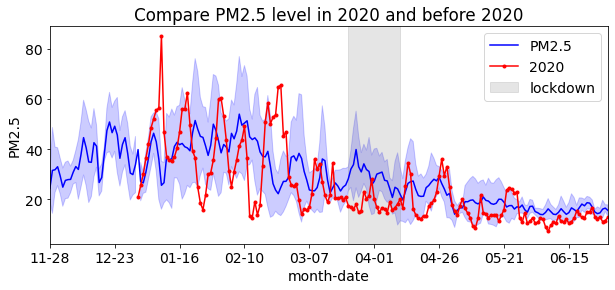

In [103]:
_, ax = plt.subplots(1,1,  figsize=(10, 4))

winter_day_dict, mean_df = plot_season_avg(poll_before2020.copy(),  'PM2.5', ax, agg='mean', ci='sd')
df = poll_2020.loc[:'2020-06-30']
ax.plot(df['winter_day'], df['PM2.5'], color='red', marker='.', label='2020')
#ax.set_ylim([25,  170])
ax.set_xlim([150, 365])
new_ticks = ['11-28', '12-23', '01-16', '02-10', '03-07', '04-01', '04-26', '05-21', '06-15', '']
ax.set_xticklabels(new_ticks)
ax.axvspan(lock_w_start, lock_w_end, color='gray', alpha=0.2, label='lockdown')
ax.legend()
plt.title('Compare PM2.5 level in 2020 and before 2020')

filename=dataset.report_folder + 'compare_PM25_2020_and_before.png'
plt.savefig(filename, dpi=300)

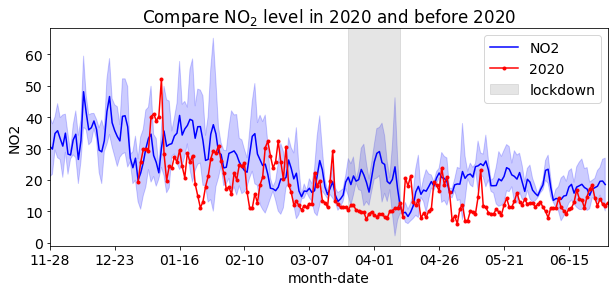

In [104]:
_, ax = plt.subplots(1,1,  figsize=(10, 4))

winter_day_dict, mean_df = plot_season_avg(poll_before2020.copy().loc['2017':],  'NO2', ax, agg='mean', ci='sd')
df = poll_2020.loc[:'2020-06-30']
ax.plot(df['winter_day'], df['NO2'], color='red', marker='.', label='2020')
#ax.set_ylim([25,  170])
ax.set_xlim([150, 365])
new_ticks = ['11-28', '12-23', '01-16', '02-10', '03-07', '04-01', '04-26', '05-21', '06-15', '']
ax.set_xticklabels(new_ticks)
ax.axvspan(lock_w_start, lock_w_end, color='gray', alpha=0.2, label='lockdown')
ax.legend()
plt.title('Compare NO$_2$ level in 2020 and before 2020')

filename=dataset.report_folder + 'compare_NO2_2020_and_before.png'
plt.savefig(filename, dpi=300)

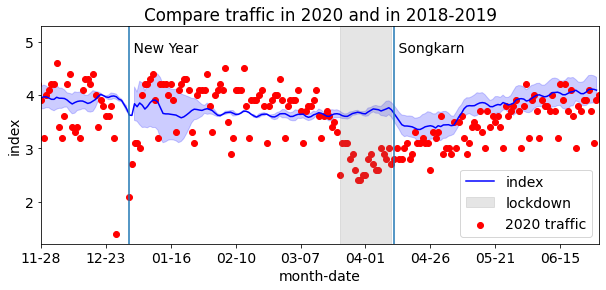

In [92]:
_, ax = plt.subplots(1,1,  figsize=(10, 4))

winter_day_dict, trf_mean_df = plot_season_avg(trf_prev_d.copy(), 'index', ax, ci='sd')
ax.axvline(184)
ax.axvline(286)

ax.text(184, 4.8, ' New Year',   horizontalalignment='left')
ax.text(286, 4.8 , ' Songkarn',  horizontalalignment='left')


ax.scatter(trf['winter_day'], trf['mean'], color='red', marker='o', label='2020 traffic')

# axis setting
ax.set_xlim([150, 365])
new_ticks = ['11-28', '12-23', '01-16', '02-10', '03-07', '04-01', '04-26', '05-21', '06-15', '']
ax.set_xticklabels(new_ticks)
ax.axvspan(lock_w_start, lock_w_end, color='gray', alpha=0.2, label='lockdown' )

ax.legend()
plt.title('Compare traffic in 2020 and in 2018-2019')

filename=dataset.report_folder + 'compare_traffic_2020_and_before.png'
plt.savefig(filename, dpi=300)

In [41]:
fire = dataset.fire[dataset.fire['distance']<200]
fire = fire.resample('d').sum()
fire['dayofyear'] = fire.index.dayofyear
fire['year'] = fire.index.year

# add winter day by substratcing the first day of july
offset = 183
winterday = fire['dayofyear'] - offset  
# get rid of the negative number
winter_day_max = 365 - offset
winterday[winterday < 0] = winterday[winterday < 0] + offset + winter_day_max  +1 
fire['winter_day'] = winterday

Text(0.5, 1.0, 'Compare number burning spots per day in 2020 and before 2020')

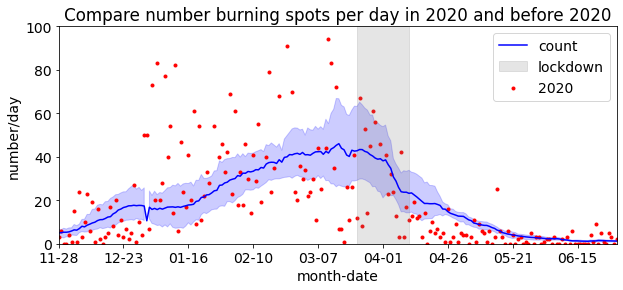

In [43]:
_, ax = plt.subplots(1,1,  figsize=(10, 4))

winter_day_dict, mean_df = plot_season_avg(fire.loc['2017':],  'count', ax, agg='mean')
df = fire.loc['2020-01-01':'2020-12-31']
ax.scatter(df['winter_day'], df['count'], color='red', marker='.', label='2020')
ax.set_ylim([0,  60])
ax.set_xlim([150, 365])
ax.set_ylabel('number/day')
new_ticks = ['11-28', '12-23', '01-16', '02-10', '03-07', '04-01', '04-26', '05-21', '06-15', '']
ax.set_xticklabels(new_ticks)
ax.axvspan(lock_w_start, lock_w_end, color='gray', alpha=0.2, label='lockdown')
ax.legend()
plt.title('Compare number burning spots per day in 2020 and before 2020')

## Concat Longdo data

In [7]:
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

 
t_files = [s for s in t_files if 'trafficindex' in s]
t_files

../data/traffic\2017-2020_hourly_CI.csv


['../data/traffic\\trafficindex2012.csv',
 '../data/traffic\\trafficindex2013.csv',
 '../data/traffic\\trafficindex2014.csv',
 '../data/traffic\\trafficindex2015.csv',
 '../data/traffic\\trafficindex2016.csv',
 '../data/traffic\\trafficindex2017.csv',
 '../data/traffic\\trafficindex2018.csv',
 '../data/traffic\\trafficindex2019.csv',
 '../data/traffic\\trafficindex2020.csv',
 '../data/traffic\\trafficindex2021.csv']

In [15]:
trf_start_date = '2018-01-03 00:00:00'

In [16]:
# hourly traffic data before 2020
longdo_trf = []

for file in t_files:
    longdo_trf.append(pd.read_csv(file))
    
longdo_trf = pd.concat(longdo_trf) 
longdo_trf['datetime'] = pd.to_datetime(longdo_trf['datetime'] )
longdo_trf = longdo_trf.set_index('datetime')
# resample to hourly 
longdo_trf = longdo_trf.resample('h').mean()
# remove the data after recalibration in 2018
longdo_trf = longdo_trf.loc[trf_start_date:]

<AxesSubplot:xlabel='datetime'>

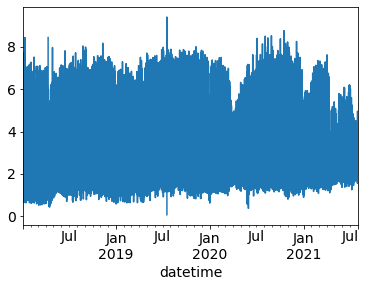

In [17]:
longdo_trf['index'].plot()

In [18]:
# export csv files
longdo_trf = longdo_trf[['index']]
longdo_trf.columns = ['traffic_index']
longdo_trf.to_csv('C:/Users/Benny/Documents/Fern/aqi_thailand2/data/bangkok/traffic_longdo_2018.csv', index=True)

In [19]:
t_files

['../data/traffic\\trafficindex2012.csv',
 '../data/traffic\\trafficindex2013.csv',
 '../data/traffic\\trafficindex2014.csv',
 '../data/traffic\\trafficindex2015.csv',
 '../data/traffic\\trafficindex2016.csv',
 '../data/traffic\\trafficindex2017.csv',
 '../data/traffic\\trafficindex2018.csv',
 '../data/traffic\\trafficindex2019.csv',
 '../data/traffic\\trafficindex2020.csv',
 '../data/traffic\\trafficindex2021.csv']

In [37]:
# traffic daily traffic data in 2020
trf = pd.read_csv('../data/traffic\\daily2021.csv')
trf = trf.iloc[:,1:]
trf.columns = ['date', 'max', 'mean']
 # extract months and date 
trf['month'] = trf['date'].str.extract('(\D+)').iloc[:,0]
trf['day'] = trf['date'].str.extract('(\d+)').iloc[:,0]
month_list = trf['month'].unique().tolist()

month_dict = {}
for i, m in enumerate(month_list):
    i += 8
    if len(str(i))==1:
        month_dict[m] = '-0'+str(i)
    else:
        month_dict[m] = '-'+ str(i)
        

# change month to number 
trf['month'] = trf['month'].replace(month_dict)

# combine month, date into one strings
date_list = []
for i, row in trf.iterrows():
    if len(row['day']) == 1:
        day = '-0' + row['day']
    else:
        day = '-' + row['day']
    new_date = '2020'+row['month'] + day
    date_list.append(new_date)
    
trf['date'] = pd.to_datetime(date_list)
trf = trf[['date','max','mean']].set_index('date')

In [38]:
trf = trf[['mean']]
trf.columns = ['traffic_index']
trf.index.name = 'datetime'
trf.to_csv('C:/Users/Benny/Documents/Fern/aqi_thailand2/data/bangkok/traffic_longdo_Aug2021.csv', index=True)

## T-test

Here, I compare the average pollution level with/without the shutdown of the same time of years. I also calculate the p-value and plot the distribution of AQI for each pollution level.

In [105]:
gas_list = ['PM2.5', 'PM10', 'O3', 'CO', 'NO2', 'SO2']

In [82]:
# average traffic index
trf_loc_arr = trf[(trf['dayofyear'] <= lock_end) & (trf['dayofyear'] >= lock_start)]['mean']
lock_mean = trf_loc_arr.mean().round(2)
lock_std = trf_loc_arr.std().round(2)

print( 'traffic index during lock down', lock_mean, '+/-', lock_std)

trf_arr = trf_prev_d[(trf_prev_d['dayofyear'] <= lock_end) & (trf_prev_d['dayofyear'] >= lock_start) & (trf_prev_d['dayofweek'].isin( np.arange(0, 5)))]['index']
trf_mean = trf_arr.mean().round(2)
trf_std = trf_arr.std().round(2)

print('traffic during the same time in the previous years', trf_mean, '+/-', trf_std)

stat, p = ttest_ind(trf_loc_arr, trf_arr, equal_var=False)

print(stat, 't-test p value', p)

# calculate percent decrease
per_des = ((lock_mean - trf_mean)/trf_mean*100).round()

print('percent decrease ', per_des)

stat, p = mannwhitneyu(trf_loc_arr, trf_arr, alternative='greater')

print(stat, 'Mann-whitney p value', p)

# build dataframe for box plot in AQI
trf_compare = []
df = pd.DataFrame(trf_arr.values, columns= ['Index'])
df['period'] = 'previous'
trf_compare.append(df) 
    
df = pd.DataFrame(trf_loc_arr.values, columns= ['Index'])
df['period'] = 'lockdown'
trf_compare.append(df)

trf_compare = pd.concat(trf_compare)

traffic index during lock down 2.76 +/- 0.23
traffic during the same time in the previous years 3.83 +/- 0.4
-12.019819210257829 t-test p value 5.100958618867148e-16
percent decrease  -28.0
21.0 Mann-whitney p value 0.999999991466002


In [106]:
# analying the daily max value 
agg_type = 'mean'

poll_before2020 = poll_df.loc[:'2019-12-31']
poll_2020 = poll_df.loc['2020-01-01':].copy()
#poll_aqi = poll_to_aqi(poll_2020, dataset.roll_dict)
poll_2020 = poll_2020.resample('d').agg(agg_type)
poll_2020['dayofyear'] = poll_2020.index.dayofyear
poll_2020['year'] = poll_2020.index.year


#analysing the data before 2020
poll_prev_d = poll_before2020.dropna().resample('d').agg(agg_type)
poll_prev_d['dayofyear'] = poll_prev_d.index.dayofyear
poll_prev_d['dayofweek'] = poll_prev_d.index.dayofweek


poll_compare = []

for col in gas_list:
    # average mean pollution level during lockdown 
    poll_lock_arr = poll_2020[(poll_2020['dayofyear'] <= lock_end) & (poll_2020['dayofyear'] >= lock_start)][col]
    poll_lock_mean = poll_lock_arr.mean().round(2)
    poll_lock_std = poll_lock_arr.std().round(2)

    print(col, 'pollution during lock down', poll_lock_mean, '+/-', poll_lock_std)

    poll_arr = poll_prev_d[(poll_prev_d['dayofyear'] <= lock_end) & (poll_prev_d['dayofyear'] >= lock_start) & (poll_prev_d['dayofweek'].isin( np.arange(0, 5)))][col]
    poll_mean = poll_arr.mean().round(2)
    poll_std = poll_arr.std().round(2)

    print(col, 'pollution during the same time in the previous years', poll_mean, '+/-', poll_std)

    stat, p = ttest_ind(poll_lock_arr, poll_arr, equal_var=False)
    
    print(stat, 't-test p value', p)
    
    # calculate percent decrease
    per_des = ((poll_lock_mean-poll_mean )/poll_mean*100).round()

    print('percent decrease ', per_des)
    
    stat, p = mannwhitneyu(poll_lock_arr, poll_arr, alternative='less')

    print(stat, 'Mann-whitney p value', p)
    
    # build dataframe for box plot in AQI
    df = pd.DataFrame(poll_arr.apply(to_aqi, pollutant=col).values, columns= ['AQI'])
    df['pollution'] = poll_arr.values
    df['period'] = 'previous'
    df['pollutant'] = col
    poll_compare.append(df) 
    
    df = pd.DataFrame(poll_lock_arr.apply(to_aqi, pollutant=col).values, columns= ['AQI'])
    df['pollution'] = poll_lock_arr.values
    df['period'] = 'lockdown'
    df['pollutant'] = col
    poll_compare.append(df) 
    

poll_compare = pd.concat(poll_compare)

PM2.5 pollution during lock down 20.93 +/- 7.24
PM2.5 pollution during the same time in the previous years 28.96 +/- 11.46
-4.5655415316390355 t-test p value 1.3295843702864514e-05
percent decrease  -28.0
768.0 Mann-whitney p value 1.6974770643083484e-05
PM10 pollution during lock down 38.78 +/- 11.6
PM10 pollution during the same time in the previous years 44.86 +/- 14.69
-2.4138489138190513 t-test p value 0.01771928671191185
percent decrease  -14.0
987.0 Mann-whitney p value 0.00227625021997257
O3 pollution during lock down 22.1 +/- 8.11
O3 pollution during the same time in the previous years 23.29 +/- 7.49
-0.7625728423473859 t-test p value 0.448214101985713
percent decrease  -5.0
1276.5 Mann-whitney p value 0.13393789428526204
CO pollution during lock down 0.57 +/- 0.3
CO pollution during the same time in the previous years 0.87 +/- 0.25
-5.331959313061849 t-test p value 1.268082547475823e-06
percent decrease  -34.0
566.0 Mann-whitney p value 2.8532591058034542e-08
NO2 pollution du

Text(0, 0.5, 'AQI')

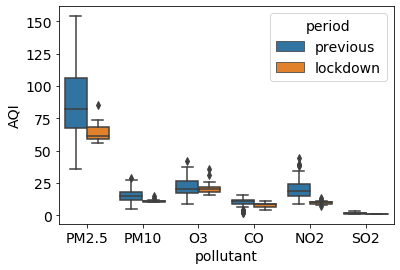

In [50]:
ax = sns.boxplot(x="pollutant", y="AQI", hue='period', data=poll_compare)
ax.set_ylabel('AQI')
#ax = sns.swarmplot(x="pollutant", y="pollution", hue='period', data=poll_compare)

Text(0, 0.5, 'PM2.5(µg m-3 )')

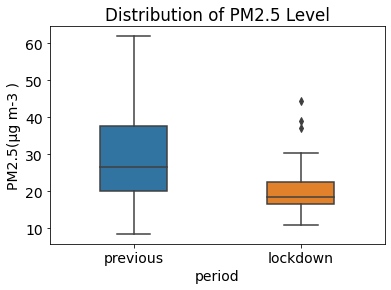

In [62]:
temp = poll_compare[poll_compare['pollutant']=='PM2.5']
ax = sns.boxplot(x='period', y='pollution' , data=temp, width=0.4)
#ax = sns.swarmplot(x='period', y='pollution' , data=temp, color=".25")
ax.set_title('Distribution of PM2.5 Level')

ax.set_ylabel('PM2.5(µg m-3 )')


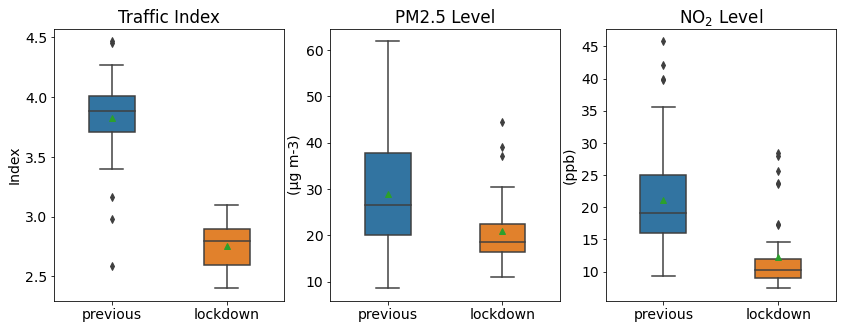

In [107]:
_, ax = plt.subplots(1, 3, figsize=(14, 5))

temp = trf_compare 
ax[0] = sns.boxplot(x='period', y='Index' , data=temp, width=0.4, ax=ax[0], showmeans=True)
#ax = sns.swarmplot(x='period', y='pollution' , data=temp, color=".25")
ax[0].set_title('Traffic Index')

ax[0].set_ylabel('Index')


temp = poll_compare[poll_compare['pollutant']=='PM2.5']
ax[1] = sns.boxplot(x='period', y='pollution' , data=temp, width=0.4, ax=ax[1], showmeans=True)
#ax = sns.swarmplot(x='period', y='pollution' , data=temp, color=".25")
ax[1].set_title('PM2.5 Level')

ax[1].set_ylabel('(µg m-3)')


temp = poll_compare[poll_compare['pollutant']=='NO2']
ax[2] = sns.boxplot(x='period', y='pollution' , data=temp, width=0.4, ax=ax[2], showmeans=True)
#ax = sns.swarmplot(x='period', y='pollution' , data=temp, color=".25")
ax[2].set_title('NO$_2$ Level')

ax[2].set_ylabel('(ppb)')

for a in ax:
    a.set_xlabel(None)

filename=dataset.report_folder + 'compare_2020_and_before_box.png'
plt.savefig(filename, dpi=300)


# Explore Traffic data

Working on the traffic data before 2020, which only have the daily average data. I found that the traffic index switch behavior at the beginning of 2018. This means I cannot put them on the same columns and feed to my ML model. I have to rescale on of the dataset before putting them together. I first explore if the data before or after 2018 is a better reference. 

Here, I am going to show that the data before 2018 is better. 

In [24]:
# load the traffic file 
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

../data/traffic\daily2020.csv


In [25]:
# hourly traffic data before 2020
trf_prev = []

for file in t_files[1:]:
    trf_prev.append(pd.read_csv(file))
    
trf_prev = pd.concat(trf_prev) 
trf_prev['datetime'] = pd.to_datetime(trf_prev['datetime'] )
trf_prev = trf_prev.set_index('datetime')
# remove the data before the first data point of PM2.5
trf_prev = trf_prev.loc[pm25_start_date:]

In [26]:
# the last date of the first calibration
cut_off = '2017-09-15 19:50:00'
# mark when the traffic start changing the behavior
trf_prev['new_cal'] = 0
index = trf_prev.loc[cut_off:].index
trf_prev.loc[index, 'new_cal'] = 1

# add holiday and weekend information
trf_prev = add_calendar_info(trf_prev)

The behavior switch is clearly seen by the time series data plot.

Text(0, 0.5, 'index')

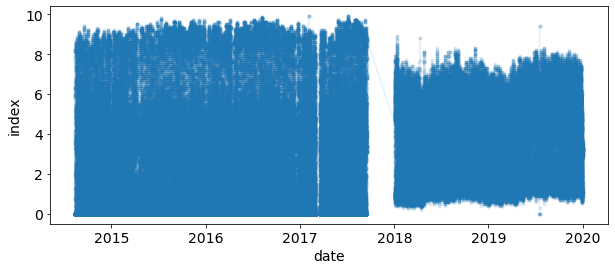

In [106]:
plt.figure(figsize=(10, 4))
plt.plot(trf_prev['index'], alpha= 0.1, marker='.')
plt.xlabel('date')
plt.ylabel('index')

The hourly behavior is also different. The data before 2018 has more apparent rush hour peaks. The baseline during the off-hour is zero as it is supposed to.

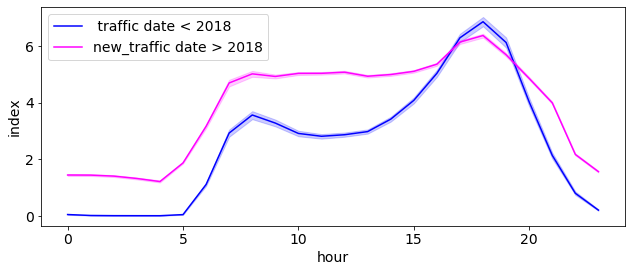

In [109]:
_, ax = plt.subplots(1, 1, figsize=(9, 4))
plot_hour_avg(trf_prev[trf_prev['new_cal']==0], 'index', ax,  color='blue')
plot_hour_avg(trf_prev[trf_prev['new_cal']==1], 'index', ax,  color='magenta')
plt.legend([' traffic date < 2018', 'new_traffic date > 2018'])
plt.tight_layout()

Shown in blue is the different between weekend and weekday traffic using the index before 2018 (blue) and after 2018 (orange). The weekend-weekday difference is much lower in the data after 2018. 

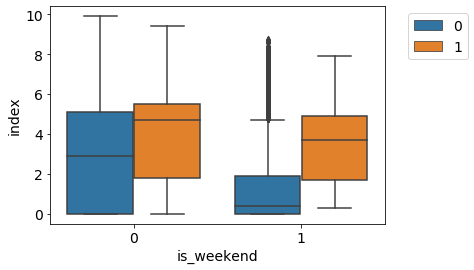

In [115]:
ax = sns.boxplot(x='is_weekend', y = 'index', hue='new_cal', data=trf_prev)

ax.legend(bbox_to_anchor=(1.05, 1))
#sns.boxplot(x='is_weekend', y = 'index', data=try_2cal)

Let's look at the difference between holiday vs normal day. The traffic index before 2018 has larger difference between normal day and holiday.

In [119]:
trf_prev[trf_prev['new_cal']==0].groupby(['is_holiday', 'is_weekend']).mean()['index']

is_holiday  is_weekend
0           0             3.253833
            1             1.264924
1           0             0.616098
            1             0.711353
Name: index, dtype: float64

In [120]:
trf_prev[trf_prev['new_cal']==1].groupby(['is_holiday', 'is_weekend']).mean()['index']

is_holiday  is_weekend
0           0             4.102438
            1             3.481704
1           0             2.931022
            1             2.797963
Name: index, dtype: float64

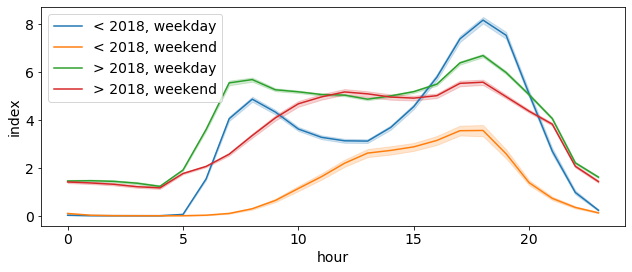

In [124]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
_, ax = plt.subplots(1, 1, figsize=(9, 4))
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[0], label='< 2018, weekday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_weekend']==1)], 'index', ax,  color=colors[1], label='< 2018, weekend')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[2], label='> 2018, weekday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_weekend']==1)], 'index', ax,  color=colors[3], label='> 2018, weekend')

plt.legend()
plt.tight_layout()

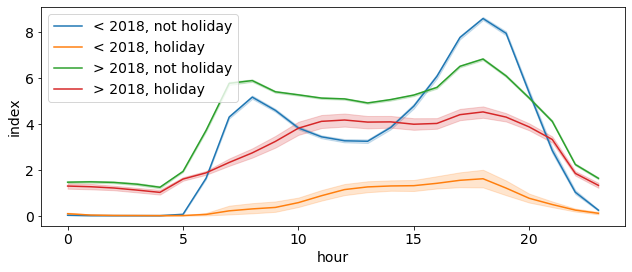

In [127]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
_, ax = plt.subplots(1, 1, figsize=(9, 4))
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_holiday']==0) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[0], label='< 2018, not holiday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_holiday']==1)], 'index', ax,  color=colors[1], label='< 2018, holiday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_holiday']==0) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[2], label='> 2018, not holiday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_holiday']==1)], 'index', ax,  color=colors[3], label='> 2018, holiday')

plt.legend()
plt.tight_layout()

In conclusion, because different between weekend/weekday is more apparent in the traffic data before 2018. I will assume that this is a better set and will scale everything to traffic index before 2018. 

# Effect of Traffic on Pollution

Compare the pollution level when the traffic is expected to be low. For example, during the weekend or a holiday.

In [27]:
# load the data  
dataset = Dataset('Bangkok')
dataset.load_()
dataset.feature_no_fire()
poll_df = dataset.poll_df

# add holiday information
poll_df = add_calendar_info(poll_df)

data no fire has shape (53478, 15)


In [139]:
# add season
poll_df = add_season(poll_df,  start_month='-11-01', end_month='-03-31')
# add is_winter
poll_df['is_winter'] = 'not winter'
idxs =  poll_df[poll_df['season'] !='other'].index
poll_df.loc[idxs, 'is_winter'] = 'winter'

The pollution value is not different between weekend/weekdays or on the holidays.

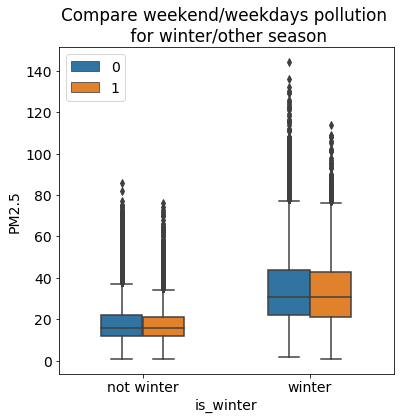

In [631]:
_, ax = plt.subplots(1,1, figsize=(6,6))
sns.boxplot(x='is_winter', y = 'PM2.5', hue='is_weekend', data=poll_df, ax=ax, width=0.5)

plt.title('Compare weekend/weekdays pollution \n for winter/other season')
plt.legend(loc='upper left')

Text(0.5, 1.0, 'Compare holiday/not holiday pollution \n for winter/other season')

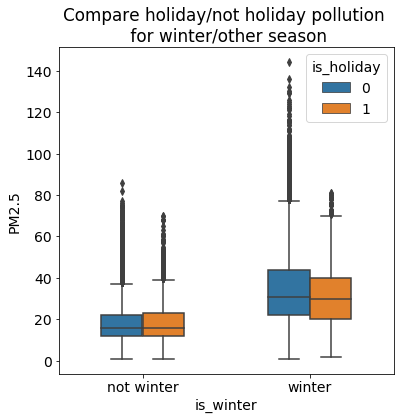

In [146]:
_, ax = plt.subplots(1,1, figsize=(6,6))
sns.boxplot(x='is_winter', y = 'PM2.5', hue='is_holiday', data=poll_df, ax=ax, width=0.5)

plt.title('Compare holiday/not holiday pollution \n for winter/other season')


Text(0.5, 1.0, 'Compare weekend/weekdays NO2 pollution \n for winter/other season')

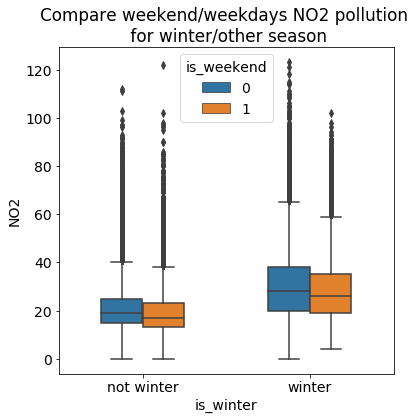

In [168]:
_, ax = plt.subplots(1,1, figsize=(6,6))
sns.boxplot(x='is_winter', y = 'NO2', hue='is_weekend', data=poll_df, ax=ax, width=0.5)

plt.title('Compare weekend/weekdays NO2 pollution \n for winter/other season')

Text(0.5, 1.0, 'Compare holiday/not holiday NO2 pollution \n for winter/other season')

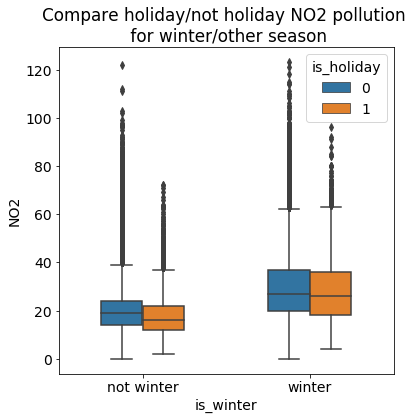

In [169]:
_, ax = plt.subplots(1,1, figsize=(6,6))
sns.boxplot(x='is_winter', y = 'NO2', hue='is_holiday', data=poll_df, ax=ax, width=0.5)

plt.title('Compare holiday/not holiday NO2 pollution \n for winter/other season')

Compare the pollution levels for the three top pollutants between **weekend and weekday** using the mean and  p-value. Focus on the values during winters season.

In [641]:
weekend_poll = poll_df[ (poll_df['is_winter']=='winter') & (poll_df['is_weekend']==1)]
weekday_poll = poll_df[ (poll_df['is_winter']=='winter') & (poll_df['is_weekend']==0)]

for col in ['PM2.5', 'PM10', 'O3', 'NO2']:
    
    # average mean  
    poll_arr1 = weekend_poll[col].dropna()
    poll_mean = poll_arr1.mean().round(2)
    poll_std = poll_arr1.std().round(2)

    print(col, 'during weekend', poll_mean, '+/-', poll_std)

    # average mean  
    poll_arr2 = weekday_poll[col].dropna()
    poll_mean = poll_arr2.mean().round(2)
    poll_std = poll_arr2.std().round(2)

    print(col, 'during weekday', poll_mean, '+/-', poll_std)

    t, p = ttest_ind(poll_arr1, poll_arr2, equal_var=False)
    
    print('t-stat', t, 't-test p value', p)
    
    stat, p = mannwhitneyu(poll_arr1, poll_arr2, alternative='less')

    print(stat, 'Mann-whitney p value', p)

PM2.5 during weekend 33.53 +/- 16.26
PM2.5 during weekday 34.99 +/- 17.58
t-stat -5.854754213918773 t-test p value 4.898014014751316e-09
47154612.5 Mann-whitney p value 1.258807219256481e-05
PM10 during weekend 61.19 +/- 33.4
PM10 during weekday 63.53 +/- 34.81
t-stat -9.27709276678527 t-test p value 1.8119068107056424e-20
751331159.0 Mann-whitney p value 4.4162222672952146e-23
O3 during weekend 19.14 +/- 17.21
O3 during weekday 18.82 +/- 17.25
t-stat 2.4661085001395455 t-test p value 0.01366260022223494
794953144.5 Mann-whitney p value 0.9988847826250702
NO2 during weekend 28.37 +/- 13.1
NO2 during weekday 30.46 +/- 14.13
t-stat -20.885818878653765 t-test p value 1.8833461471994654e-96
717646500.0 Mann-whitney p value 2.3993568206070856e-87


Compare the pollution levels for the three top pollutants between **holiday and not holiday** using the mean and  p-value. Focus on the values during winters season.

In [640]:
holiday = poll_df[ (poll_df['is_winter']=='winter') & (poll_df['is_holiday']==1)]
not_holiday = poll_df[ (poll_df['is_winter']=='winter') & (poll_df['is_holiday']==0)]

for col in ['PM2.5', 'PM10', 'O3', 'NO2']:
    
    # average mean  
    poll_arr1 = holiday[col].dropna()
    poll_mean = poll_arr1.mean().round(2)
    poll_std = poll_arr1.std().round(2)

    print(col, 'during holiday', poll_mean, '+/-', poll_std)

    # average mean  
    poll_arr2 = not_holiday[col].dropna()
    poll_mean = poll_arr2.mean().round(2)
    poll_std = poll_arr2.std().round(2)

    print(col, 'during not holiday', poll_mean, '+/-', poll_std)

    t, p = ttest_ind(poll_arr1, poll_arr2, equal_var=False)
    
    print('t-stat', t, 't-test p value', p)
    
    stat, p = mannwhitneyu(poll_arr1, poll_arr2, alternative='less')

    print(stat, 'Mann-whitney p value', p)

PM2.5 during holiday 31.97 +/- 15.22
PM2.5 during not holiday 34.7 +/- 17.31
t-stat -5.536350986982767 t-test p value 3.833618795065673e-08
9702993.5 Mann-whitney p value 1.4032055731115913e-05
PM10 during holiday 53.4 +/- 24.39
PM10 during not holiday 63.25 +/- 34.72
t-stat -22.735359032549834 t-test p value 9.56869212259399e-108
122894719.0 Mann-whitney p value 7.378411875764247e-51
O3 during holiday 22.34 +/- 18.24
O3 during not holiday 18.78 +/- 17.18
t-stat 11.246622310864314 t-test p value 7.074964868039483e-29
163173907.0 Mann-whitney p value 1.0
NO2 during holiday 28.38 +/- 13.59
NO2 during not holiday 29.93 +/- 13.89
t-stat -6.515747942220012 t-test p value 8.200379797304438e-11
134515374.0 Mann-whitney p value 1.659196689059305e-12


## Compare road side/ in block stations

Bangkok has many pollution monitoring station. Some are road side stations and some stations are in side communities. 

In [650]:
road_stats = ['03', '50', '52', '53']
amb_stats = ['02', '05', '11', '59', '61']

In [651]:
dataset.data_folder

'../data/bangkok/'

# Explore Traffic data

Working on the traffic data before 2020, which only have the daily average data. I found that the traffic index switch behavior at the beginning of 2018. This means I cannot put them on the same columns and feed to my ML model. I have to rescale on of the dataset before putting them together. I first explore if the data before or after 2018 is a better reference. 

Here, I am going to show that the data before 2018 is better. 

In [52]:
# load the traffic file 
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

../data/traffic\daily2020.csv


In [53]:
# hourly traffic data before 2020
trf_prev = []

for file in t_files[1:]:
    trf_prev.append(pd.read_csv(file))
    
trf_prev = pd.concat(trf_prev) 
trf_prev['datetime'] = pd.to_datetime(trf_prev['datetime'] )
trf_prev = trf_prev.set_index('datetime')
# remove the data before the first data point of PM2.5
trf_prev = trf_prev.loc[pm25_start_date:]

In [98]:
# the last date of the first calibration
cut_off = '2017-09-15 19:50:00'
# mark when the traffic start changing the behavior
trf_prev['new_cal'] = 0
index = trf_prev.loc[cut_off:].index
trf_prev.loc[index, 'new_cal'] = 1

# add holiday and weekend information
trf_prev = add_calendar_info(trf_prev)

The behavior switch is clearly seen by the time series data plot.

Text(0, 0.5, 'traffic index')

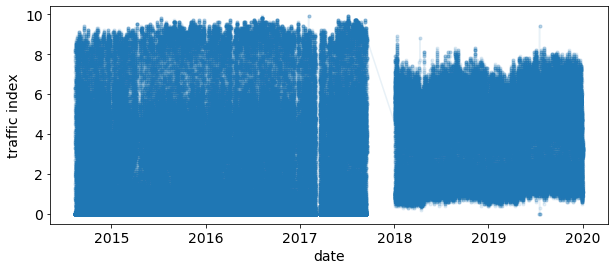

In [283]:
plt.figure(figsize=(10, 4))
plt.plot(trf_prev['index'], alpha= 0.1, marker='.')
plt.xlabel('date')
plt.ylabel('traffic index')

The hourly behavior is also different. The data before 2018 has more apparent rush hour peaks. The baseline during the off-hour is zero as it is supposed to.

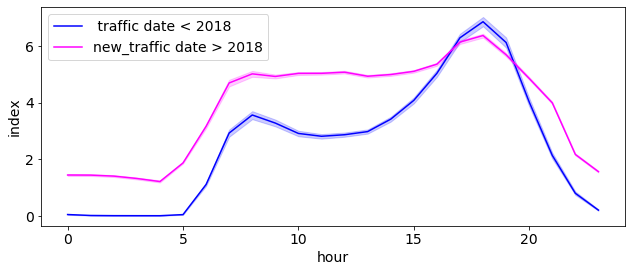

In [109]:
_, ax = plt.subplots(1, 1, figsize=(9, 4))
plot_hour_avg(trf_prev[trf_prev['new_cal']==0], 'index', ax,  color='blue')
plot_hour_avg(trf_prev[trf_prev['new_cal']==1], 'index', ax,  color='magenta')
plt.legend([' traffic date < 2018', 'new_traffic date > 2018'])
plt.tight_layout()

Shown in blue is the different between weekend and weekday traffic using the index before 2018 (blue) and after 2018 (orange). The weekend-weekday difference is much lower in the data after 2018. 

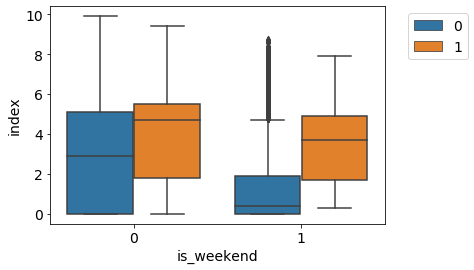

In [115]:
ax = sns.boxplot(x='is_weekend', y = 'index', hue='new_cal', data=trf_prev)

ax.legend(bbox_to_anchor=(1.05, 1))
#sns.boxplot(x='is_weekend', y = 'index', data=try_2cal)

Let's look at the difference between holiday vs normal day. The traffic index before 2018 has larger difference between normal day and holiday.

In [119]:
trf_prev[trf_prev['new_cal']==0].groupby(['is_holiday', 'is_weekend']).mean()['index']

is_holiday  is_weekend
0           0             3.253833
            1             1.264924
1           0             0.616098
            1             0.711353
Name: index, dtype: float64

In [120]:
trf_prev[trf_prev['new_cal']==1].groupby(['is_holiday', 'is_weekend']).mean()['index']

is_holiday  is_weekend
0           0             4.102438
            1             3.481704
1           0             2.931022
            1             2.797963
Name: index, dtype: float64

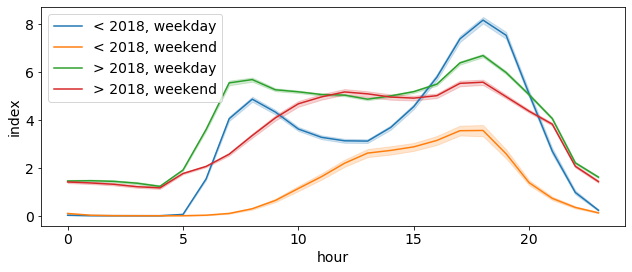

In [124]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
_, ax = plt.subplots(1, 1, figsize=(9, 4))
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[0], label='< 2018, weekday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_weekend']==1)], 'index', ax,  color=colors[1], label='< 2018, weekend')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[2], label='> 2018, weekday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_weekend']==1)], 'index', ax,  color=colors[3], label='> 2018, weekend')

plt.legend()
plt.tight_layout()

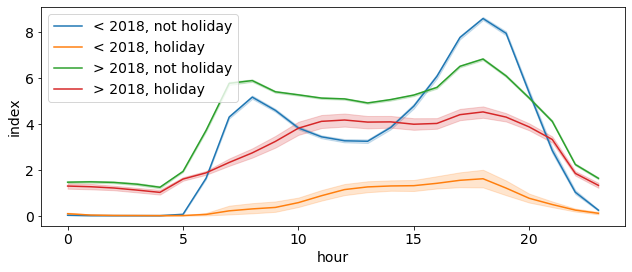

In [127]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
_, ax = plt.subplots(1, 1, figsize=(9, 4))
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_holiday']==0) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[0], label='< 2018, not holiday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==0) & (trf_prev['is_holiday']==1)], 'index', ax,  color=colors[1], label='< 2018, holiday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_holiday']==0) & (trf_prev['is_weekend']==0)], 'index', ax,  color=colors[2], label='> 2018, not holiday')
plot_hour_avg(trf_prev[(trf_prev['new_cal']==1) & (trf_prev['is_holiday']==1)], 'index', ax,  color=colors[3], label='> 2018, holiday')

plt.legend()
plt.tight_layout()

In conclusion, because different between weekend/weekday is more apparent in the traffic data before 2018. I will assume that this is a better set and will scale everything to traffic index before 2018. 

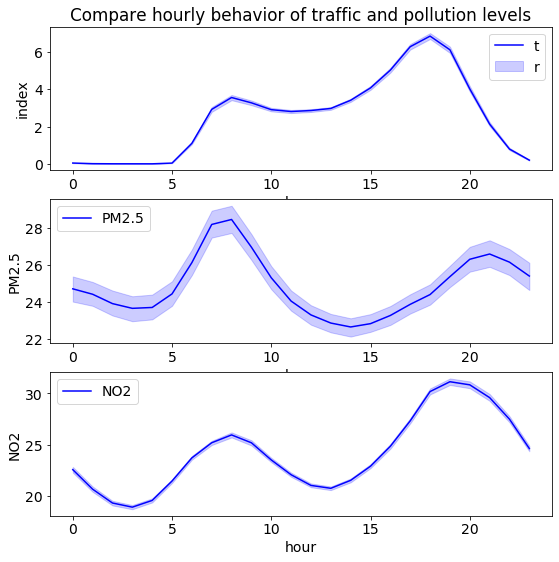

In [29]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
_, ax = plt.subplots(3, 1, figsize=(9, 9))
plot_hour_avg(trf_prev[trf_prev['new_cal']==0], 'index', ax[0],  color='blue')
ax[0].legend('traffic index')
ax[0].set_title('Compare hourly behavior of traffic and pollution levels')
plot_hour_avg(dataset.poll_df, 'PM2.5', ax[1],  color='blue')
plot_hour_avg(dataset.poll_df, 'NO2', ax[2],  color='blue')

# Modeling Traffic Index

I will build an RF model to predict hourly traffic index. 

In [562]:
# load the traffic data and keep the data only before 2018
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

trf_miss_date = '2018-01-03 00:00:00'

# hourly traffic data before 2020
traffic = []

for file in t_files[1:]:
    traffic.append(pd.read_csv(file))
    
traffic = pd.concat(traffic) 
traffic['datetime'] = pd.to_datetime(traffic['datetime'] )
traffic = traffic.set_index('datetime')
# remove the data before the first data point of PM2.5
traffic = traffic.loc[:trf_miss_date][['index']]
# get hourly traffic data
traffic = traffic.resample('h').mean().round(1)
traffic.columns = ['traffic_index']

../data/traffic\daily2020.csv


In [335]:
# load the dataset object
# load the data  
dataset = Dataset('Bangkok')
dataset.load_()

# merge data with weather
# assign this to data attribute to take advantage of the dataset object build-in functions
dataset.data = traffic.merge(dataset.wea, left_index=True, right_index=True,how='inner')
dataset.data = add_is_rain(dataset.data)
# drop only keep the columns related to the weather or weekend, which can  affect traffic 
to_drops = ['Humidity(%)', 'Wind', 'Wind_Speed(kmph)']
dataset.data = dataset.data.drop(to_drops, axis=1)

In [563]:
# add calenda information
dataset.data = add_calendar_info(dataset.data, holiday_file=dataset.data_folder + 'holiday.csv')
dataset.data.loc['2020-03-21':'2020-04-16','is_holiday'] = 1
# one hot encode the time of day columns
dataset.data = dummy_time_of_day(dataset.data, col='time_of_day', group_hour=1)
# one hot endcode day_of_week columns
dataset.data = dummy_day_of_week(dataset.data)
dataset.data = dataset.data[~dataset.data.index.duplicated(keep='first')]
dataset.data = dataset.data.dropna() 
actual_df = dataset.data

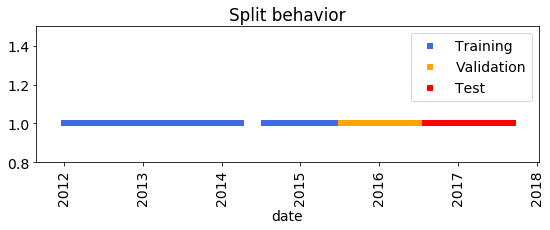

In [271]:
# use dataset split function
split_list = [0.6, 0.2, 0.2]
dataset.split_data(split_ratio=split_list)
display_time_split(dataset.split_list)

In [272]:
dataset.data.head()

,traffic_index,Temperature(C),is_rain,is_holiday,is_weekend,time_of_day_0,time_of_day_1,time_of_day_2,time_of_day_3,time_of_day_4,...,time_of_day_21,time_of_day_22,time_of_day_23,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6
datetime,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,0.7,22.0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2012-01-01 01:00:00,0.2,21.0,0,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2012-01-01 02:00:00,0.0,20.0,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2012-01-01 03:00:00,0.0,20.0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
2012-01-01 04:00:00,0.0,19.0,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1


In [250]:
dataset.split_data(split_ratio=split_list)
dataset.monitor = 'traffic_index'
xtrn, ytrn, x_cols = dataset.get_data_matrix(use_index=dataset.split_list[0])
xval, yval, _ = dataset.get_data_matrix(use_index=dataset.split_list[1])
dataset.x_cols = x_cols

model = do_rf_search(xtrn, ytrn, cv_split='other')
score_dict = cal_scores(yval, model.predict(xval), header_str='val_')
print('optimize 1 score', score_dict)    

{'n_estimators': 160, 'min_samples_split': 50, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': None, 'bootstrap': True} 0.8604036849705496
optimize 1 score {'val_r2_score': 0.874278817974256, 'val_mean_squared_error': 0.943042404593377, 'val_mean_absolute_error': 0.6613030465178297}


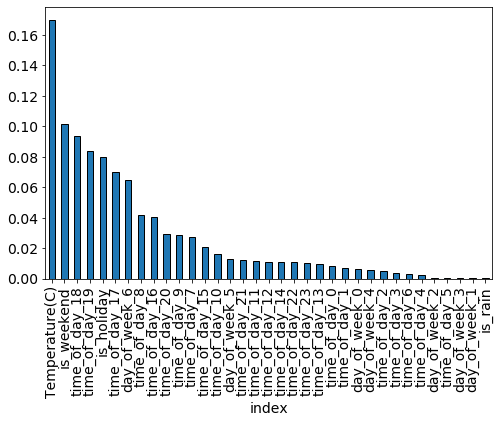

In [255]:
feat_imp.plot('index','importance',kind='bar',
            figsize=(8,5),
            linewidth=1,
            edgecolor='black',
            legend=False)

In [275]:
# merge train and validation and observe model performance in the test set 
# use dataset split function
split_list = [0.8, 0.2]
dataset.split_data(split_ratio=split_list)
xtrn, ytrn, x_cols = dataset.get_data_matrix(use_index=dataset.split_list[0])
xtest, ytest, _ = dataset.get_data_matrix(use_index=dataset.split_list[1])
model.fit(xtrn,ytrn)
score_dict = cal_scores(ytest, model.predict(xtest), header_str='val_')
print('final score', score_dict)    

final score {'val_r2_score': 0.8908906710253649, 'val_mean_squared_error': 0.8186345731051012, 'val_mean_absolute_error': 0.564116561631154}


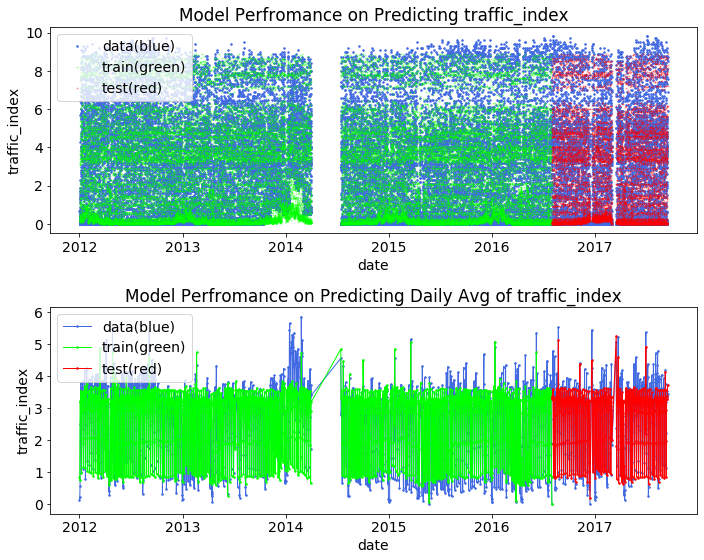

In [281]:
ytrn_pred_df, ytest_pred_df = plot_model_perf(dataset, model,split_list=[0.8,0.2],xlim=[], ylim=[],to_save=False)

Although the r2_score on the test set is 0.89. It is cannot predict occasional spikes in the traffic index. However, I think this is alright. 

In [293]:
print(x_cols)

['Temperature(C)', 'is_rain', 'is_holiday', 'is_weekend', 'time_of_day_0', 'time_of_day_1', 'time_of_day_2', 'time_of_day_3', 'time_of_day_4', 'time_of_day_5', 'time_of_day_6', 'time_of_day_7', 'time_of_day_8', 'time_of_day_9', 'time_of_day_10', 'time_of_day_11', 'time_of_day_12', 'time_of_day_13', 'time_of_day_14', 'time_of_day_15', 'time_of_day_16', 'time_of_day_17', 'time_of_day_18', 'time_of_day_19', 'time_of_day_20', 'time_of_day_21', 'time_of_day_22', 'time_of_day_23', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5', 'day_of_week_6']


In [282]:
# save the rf model
pickle.dump(model,open(dataset.model_folder + f'traffic_rf_model.pkl', 'wb'))

# Predicting Traffic Index

In second, a train traffic model is used to predict hourly traffic data. This data is compared to the actual data. 

In [2]:
# load the traffic data and keep the data only before 2018
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

trf_miss_date = '2018-01-03 00:00:00'

# hourly traffic data before 2020
traffic = []

for file in t_files[1:]:
    traffic.append(pd.read_csv(file))
    
traffic = pd.concat(traffic) 
traffic['datetime'] = pd.to_datetime(traffic['datetime'] )
traffic = traffic.set_index('datetime')
traffic_after = traffic.loc[trf_miss_date:][['index']]
# remove the data before the first data point of PM2.5
traffic = traffic.loc[:trf_miss_date][['index']]
# get hourly traffic data
traffic = traffic.resample('h').mean().round(1)
traffic_after = traffic_after.resample('h').mean().round(1)
traffic_after.columns = traffic.columns = ['traffic_index']

../data/traffic\daily2020.csv


In [3]:
# load the dataset object  
dataset = Dataset('Bangkok')
dataset.load_()
dataset.monitor_col = 'traffix_index'

dataset.x_cols = ['Temperature(C)', 'is_rain', 'is_holiday', 'is_weekend', 'time_of_day_0', 'time_of_day_1', 'time_of_day_2', 'time_of_day_3', 'time_of_day_4', 'time_of_day_5', 'time_of_day_6', 'time_of_day_7', 'time_of_day_8', 'time_of_day_9', 'time_of_day_10', 'time_of_day_11', 'time_of_day_12', 'time_of_day_13', 'time_of_day_14', 'time_of_day_15', 'time_of_day_16', 'time_of_day_17', 'time_of_day_18', 'time_of_day_19', 'time_of_day_20', 'time_of_day_21', 'time_of_day_22', 'time_of_day_23', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5', 'day_of_week_6']

In [4]:
# load model
model = pickle.load(open(dataset.model_folder + f'traffic_rf_model.pkl','rb'))

In [5]:
# prepare the data for prediction 
# round the weather data to hour 
dataset.wea.index = dataset.wea.index.round(freq='H')
dataset.wea = dataset.wea[~dataset.wea.index.duplicated(keep='first')]
# assign to data 
dataset.data = dataset.wea
dataset.data = add_is_rain(dataset.data)
# drop only keep the columns related to the weather or weekend, which can  affect traffic 
to_drops = ['Humidity(%)', 'Wind', 'Wind_Speed(kmph)']
dataset.data = dataset.data.drop(to_drops, axis=1)

# add calenda information
dataset.data = add_calendar_info(dataset.data, holiday_file=dataset.data_folder + 'holiday.csv')
# fix COVID shutdown 
dataset.data.loc['2020-03-21':'2020-04-16','is_holiday'] = 1
# one hot encode the time of day columns
dataset.data = dummy_time_of_day(dataset.data, col='time_of_day', group_hour=1)
# one hot endcode day_of_week columns
dataset.data = dummy_day_of_week(dataset.data)
dataset.data = dataset.data[~dataset.data.index.duplicated(keep='first')]
dataset.data = dataset.data.dropna() 
print(dataset.data.shape)

(176738, 37)


In [6]:
# keep only the first index of traffic 
dataset.data = dataset.data.loc[traffic.index.min():]
# rearrange the colums to match the model columns
dataset.data = dataset.data[dataset.x_cols]

In [7]:
# convert to matrix
xtest = dataset.data.values
# predict the index 
ytest_predict = model.predict(xtest)

In [8]:
ytest_pred_df = pd.DataFrame(ytest_predict, columns=['predict'])
ytest_pred_df.index = dataset.data.index

Compare actual and predicted data.

Text(0, 0.5, 'traffic index')

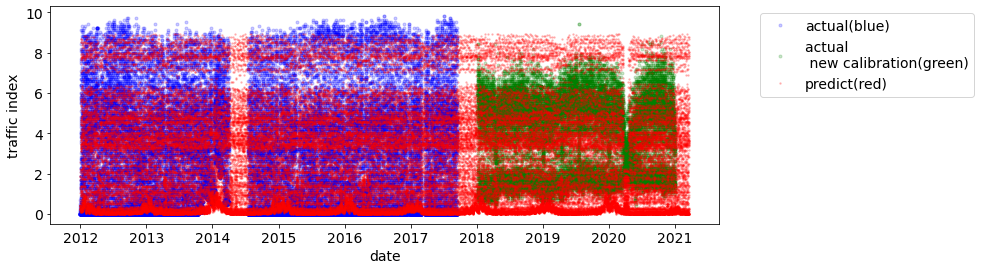

In [9]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

# compare the predict data and the actual traffix index 
ax.plot(traffic['traffic_index'], marker='.',
        label='actual(blue)', alpha=0.2, color='blue',linewidth=0)

# compare the predict data and the actual traffix index 
ax.plot(traffic_after['traffic_index'], marker='.',
        label='actual \n new calibration(green)', alpha=0.2, color='green', linewidth=0)

ax.plot(ytest_pred_df['predict'],
        marker='.',
        label='predict(red)',
        linewidth=0,
        alpha=0.2,
        markersize=3, color='red')

ax.legend(bbox_to_anchor=(1.05, 1))
ax.set_xlabel('date')
ax.set_ylabel('traffic index')

In [10]:
# save traffic prediction
ytest_pred_df.to_csv(dataset.data_folder + 'traffic_pred.csv' )

In [11]:
# Check weekend vs weekday behavior
ytest_pred_df = add_calendar_info(ytest_pred_df)

The hourly prediction and actual is pretty accurate on average.

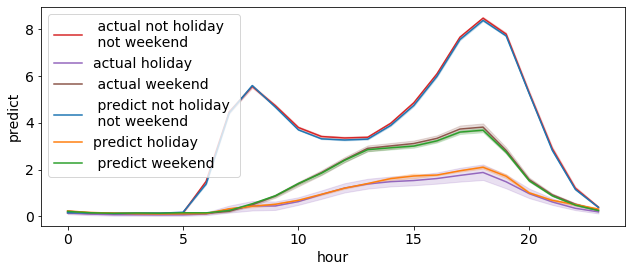

In [588]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
_, ax = plt.subplots(1, 1, figsize=(9, 4))

plot_hour_avg(actual_df[(actual_df['is_holiday']==0) & (actual_df['is_weekend']==0)], 'traffic_index', ax,  color=colors[3], label=' actual not holiday \n not weekend')
plot_hour_avg(actual_df[(actual_df['is_holiday']==1)], 'traffic_index', ax,  color=colors[4], label='actual holiday')
plot_hour_avg(actual_df[(actual_df['is_weekend']==1)], 'traffic_index', ax,  color=colors[5], label=' actual weekend')

plot_hour_avg(ytest_pred_df[(ytest_pred_df['is_holiday']==0) & (ytest_pred_df['is_weekend']==0)], 'predict', ax,  color=colors[0], label=' predict not holiday \n not weekend')
plot_hour_avg(ytest_pred_df[(ytest_pred_df['is_holiday']==1)], 'predict', ax,  color=colors[1], label='predict holiday')
plot_hour_avg(ytest_pred_df[(ytest_pred_df['is_weekend']==1)], 'predict', ax,  color=colors[2], label=' predict weekend')


plt.legend()
plt.tight_layout()

## Adjust the prediction using the actual data

1. For the data before 2018. Replace the prediction with the actual data if exist.
2. Adjust the data in 2018 - 2020 using the daily maximum. Divided daily average of the data in 2018 - 2020 into groups based on the maximum traffic index. Do the same for the prediction data.  If the actual data exist,  replace the prediction with the data from a similar group. This means the up and down pattern from the actual data is used.

In [12]:
# load traffic prediction
ytest_pred_df = pd.read_csv(dataset.data_folder + 'traffic_pred.csv' )
ytest_pred_df['datetime'] = pd.to_datetime(ytest_pred_df['datetime'])
ytest_pred_df = ytest_pred_df.set_index('datetime')

In [13]:
# load the traffic data and keep the data only before 2018
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
print(t_files[0])

trf_miss_date = '2018-01-03 00:00:00'

# hourly traffic data before 2020
traffic = []

for file in t_files[1:]:
    traffic.append(pd.read_csv(file))
    
traffic = pd.concat(traffic) 
traffic['datetime'] = pd.to_datetime(traffic['datetime'] )
traffic = traffic.set_index('datetime')
traffic_after = traffic.loc[trf_miss_date:][['index']]
# remove the data before the first data point of PM2.5
traffic = traffic.loc[:trf_miss_date][['index']]
# get hourly traffic data
traffic = traffic.resample('h').mean().round(1).dropna()
traffic_after = traffic_after.resample('h').mean().round(1)
traffic_after.columns = traffic.columns = ['traffic_index']

../data/traffic\daily2020.csv


In [14]:
# traffic daily traffic data in 2020
trf = pd.read_csv(t_files[0])
trf = trf.iloc[:,1:]
trf.columns = ['date', 'max', 'mean']
 # extract months and date 
trf['month'] = trf['date'].str.extract('(\D+)').iloc[:,0]
trf['day'] = trf['date'].str.extract('(\d+)').iloc[:,0]
month_list = trf['month'].unique().tolist()

month_dict = {}
for i, m in enumerate(month_list):
    i += 1
    if len(str(i))==1:
        month_dict[m] = '-0'+str(i)
    else:
        month_dict[m] = '-'+ str(i)
        

# change month to number 
trf['month'] = trf['month'].replace(month_dict)

# combine month, date into one strings
date_list = []
for i, row in trf.iterrows():
    if len(row['day']) == 1:
        day = '-0' + row['day']
    else:
        day = '-' + row['day']
    new_date = '2020'+row['month'] + day
    date_list.append(new_date)
    
trf['date'] = pd.to_datetime(date_list)
trf = trf[['date','max','mean']].set_index('date')

### Replace with actual data before 2018 if exist

In [15]:
# rename the columns
temp = traffic.copy()
temp.columns = ['predict']

ytest_pred_df = pd.concat([temp, ytest_pred_df])
ytest_pred_df = ytest_pred_df.sort_index()
# drop duplicate index 
ytest_pred_df = ytest_pred_df[~ytest_pred_df.index.duplicated(keep='first')]

### (WIP) Adjust the prediction in 2018 - 2019

Adjust the data in 2018 - 2020 using the daily maximum. Divided daily average of the data in 2018 - 2020 into groups based on the maximum traffic index. Do the same for the prediction data.  If the actual data exist, replace the prediction with the data from a similar group. Randomly pick. This means the up and down pattern from the actual data is used.

In [529]:
bins = 10

In [530]:
# obtain the daily maximum for the data in 2018 - 2010
df1 = traffic_after.resample('d').max()['traffic_index']
df2 = trf['max']

trf_d_af = pd.concat([df1, df2]).sort_index()

# turn into catertorical 
trf_d_af_cat = pd.cut(trf_d_af, bins=bins)
trf_d_af_cat = trf_d_af_cat.cat.codes
trf_d_af_cat.name = 'max_code'

trf_h_af_cat = trf_d_af_cat.resample('h').mean().fillna(method='ffill')

In [531]:
# obtain the code for ypredict (which is based on the old traffic)
ytest_pred_df['max_code'] = pd.cut(ytest_pred_df['predict'].resample('d').max(), bins=bins).cat.codes
ytest_pred_df = ytest_pred_df.fillna(method='ffill')
ytest_pred_df = ytest_pred_df.dropna()

# build the insertion dataframe 
insertion = ytest_pred_df.groupby(['is_holiday', 'day_of_week', 'time_of_day',
        'max_code']).mean()['predict'].reset_index()

insertion.head()

,is_holiday,day_of_week,time_of_day,max_code,predict
0,0.0,0.0,0.0,2.0,0.137846
1,0.0,0.0,0.0,4.0,0.125767
2,0.0,0.0,0.0,7.0,0.224696
3,0.0,0.0,0.0,8.0,0.135130
4,0.0,0.0,0.0,9.0,0.054405


In [532]:
# extract the prediction for the data since 2018
ypred_after = ytest_pred_df.loc[trf_miss_date:].drop('max_code', axis=1)
# merge with the actual traffic index code 
ypred_after = ypred_after.merge(trf_h_af_cat, left_index=True, right_index=True, how='right')
ypred_after = ypred_after.fillna(method='ffill')

In [533]:
new_predict_af = ypred_after.reset_index().merge(insertion, left_index=True, on =['max_code',  'time_of_day', 'is_holiday'], suffixes=('', '_new'), how='left')
new_predict_af = new_predict_af[['index','predict_new']].groupby('index').max()

new_predict_af.index = ypred_after.index

In [534]:
new_predict_af.tail()

,predict_new
2020-10-03 20:00:00,0.508696
2020-10-03 21:00:00,0.508696
2020-10-03 22:00:00,0.508696
2020-10-03 23:00:00,0.508696
2020-10-04 00:00:00,0.501038


In [535]:
# replace newly calibrate prediction to the old one 
new_predict_af.columns = ['predict']

ytest_pred_df = pd.concat([new_predict_af.dropna(), ytest_pred_df])
ytest_pred_df = ytest_pred_df.sort_index()
# drop nan value 
ytest_pred_df = ytest_pred_df[~ytest_pred_df['predict'].isna()]
# drop duplicate index 
ytest_pred_df = ytest_pred_df[~ytest_pred_df.index.duplicated(keep='first')]

In [536]:
ytest_pred_df.tail()

,predict,is_holiday,is_weekend,day_of_week,time_of_day,max_code
2020-10-03 20:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 21:00:00,0.442857,0.0,0.0,2.0,23.0,0.0
2020-10-03 22:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 23:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-04 00:00:00,0.501038,NaN,NaN,NaN,NaN,NaN


In [537]:
ytest_pred_df.tail(10)

,predict,is_holiday,is_weekend,day_of_week,time_of_day,max_code
2020-10-03 15:00:00,0.442857,0.0,0.0,2.0,23.0,0.0
2020-10-03 16:00:00,0.442857,0.0,0.0,2.0,23.0,0.0
2020-10-03 17:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 18:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 19:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 20:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 21:00:00,0.442857,0.0,0.0,2.0,23.0,0.0
2020-10-03 22:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-03 23:00:00,0.508696,NaN,NaN,NaN,NaN,NaN
2020-10-04 00:00:00,0.501038,NaN,NaN,NaN,NaN,NaN


## Check the data after clean up 

Text(0, 0.5, 'traffic index')

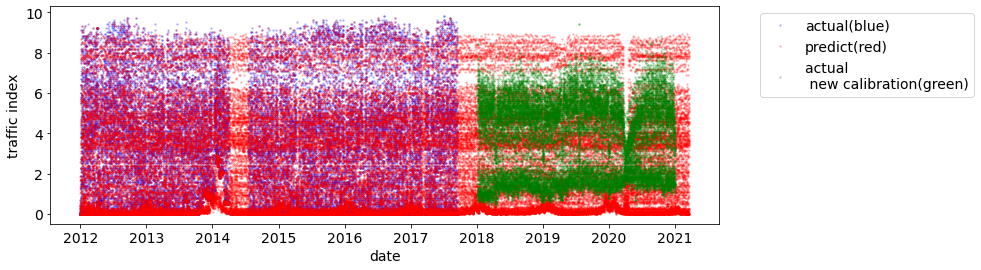

In [16]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

# compare the predict data and the actual traffix index 
ax.plot(traffic['traffic_index'], marker='.',
        label='actual(blue)', alpha=0.2, color='blue',linewidth=0,
        markersize=3)



ax.plot(ytest_pred_df['predict'],
        marker='.',
        label='predict(red)',
        linewidth=0,
        alpha=0.2,
        markersize=3, color='red')

# compare the predict data and the actual traffix index 
ax.plot(traffic_after['traffic_index'], marker='.',
        label='actual \n new calibration(green)', alpha=0.2, color='green', linewidth=0 ,
        markersize=3)

ax.legend(bbox_to_anchor=(1.05, 1))
ax.set_xlabel('date')
ax.set_ylabel('traffic index')

In [17]:
temp = ytest_pred_df[['predict']].round(2)
temp = temp.reset_index()
temp.columns = ['datetime', 'traffic_index']

temp.to_csv(dataset.data_folder + 'traffic.csv', index=False )

# Compare The Effect of Traffic on PM2.5 and NO2 

In [54]:
dataset = Dataset('Bangkok')
dataset.load_()

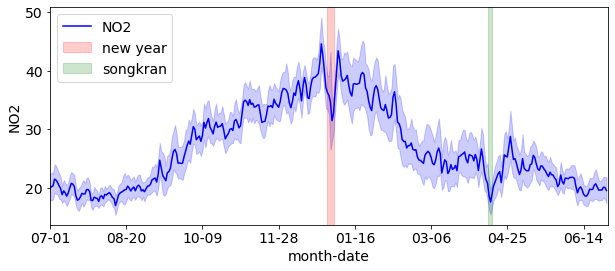

In [32]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.2, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.2, label='songkran')
winter_day_dict, mean_df = plot_season_avg(dataset.poll_df,  'NO2', ax)
ax.legend()

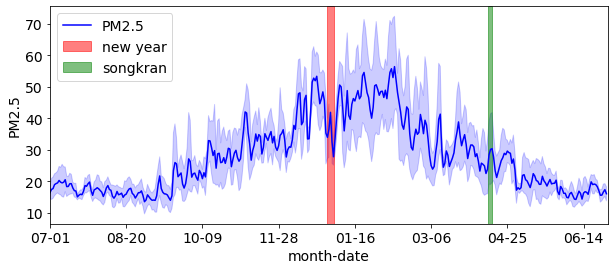

In [33]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.5, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.5, label='songkran')
winter_day_dict, mean_df = plot_season_avg(dataset.poll_df,  'PM2.5', ax)
ax.legend()

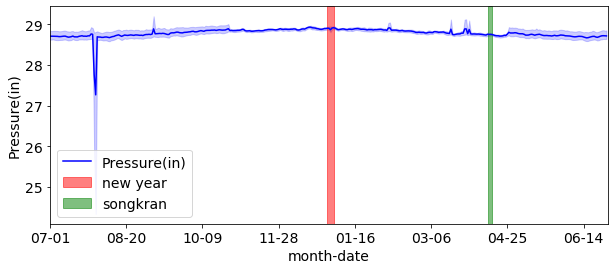

In [55]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.5, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.5, label='songkran')
winter_day_dict, mean_df = plot_season_avg(dataset.wea,  'Pressure(in)', ax, color='blue')
ax.legend()

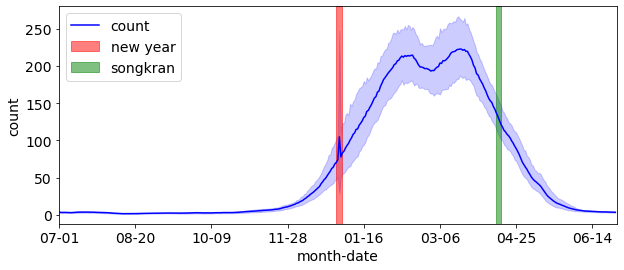

In [50]:
# count the number of fire each day
min_distance = 0 
max_distance = 400
fire_d = dataset.fire[(dataset.fire['distance'] <= max_distance) & (dataset.fire['distance'] > min_distance)]
fire_d = fire_d.resample('d').sum()[['count']]

_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.5, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.5, label='songkran')
winter_day_dict, mean_df = plot_season_avg(fire_d,  'count', ax, color='blue')
ax.legend()

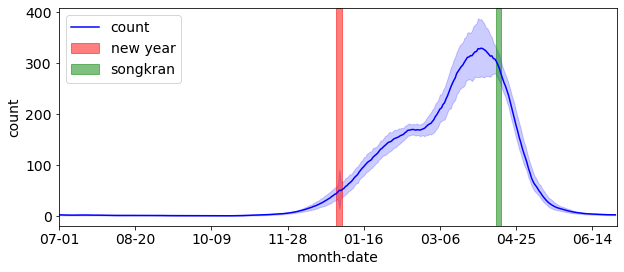

In [56]:
min_distance = 600 
max_distance = 700
fire_d = dataset.fire[(dataset.fire['distance'] <= max_distance) & (dataset.fire['distance'] > min_distance)]
fire_d = fire_d.resample('d').sum()[['count']]


_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.5, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.5, label='songkran')
winter_day_dict, mean_df = plot_season_avg(fire_d,  'count', ax, color='blue')
ax.legend()

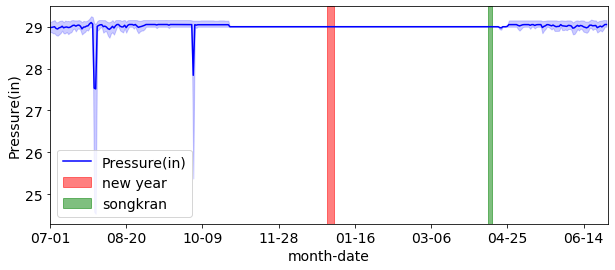

In [99]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.5, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.5, label='songkran')
winter_day_dict, mean_df = plot_season_avg(dataset.wea,  'Pressure(in)', ax, color='blue')
ax.legend()
ax.set_ylim([28.5, 29])

In [30]:
dataset = Dataset(city_name='Bangkok')
dataset.load_()

In [31]:
dataset.feature_no_fire(
            pollutant='PM2.5',
            rolling_win=1,
            fill_missing=True,
            cat_hour=False,
            group_hour=2)

data no fire has shape (53384, 15)


In [34]:
fire_dict = {"w_speed": 19.845195387053934, "shift": -72, "roll": 240, "damp_surface": 3.1296426579320755, "wind_damp": 0, "wind_lag": 0}

In [37]:
dataset.with_interaction=True
dataset.merge_fire(fire_dict, damp_surface=fire_dict['damp_surface'], wind_damp=fire_dict['wind_damp'], wind_lag=fire_dict['wind_lag'])


(['fire_0_100',
  'fire_100_200',
  'fire_200_400',
  'fire_400_600',
  'fire_600_800',
  'fire_800_1200'],
 [0, 100, 200, 400, 600, 800, 1200])

In [38]:
dataset.data.head()

,PM2.5,Temperature(C),Humidity(%),Wind Speed(kmph),wind_CALM,wind_E,wind_N,wind_S,wind_W,is_rain,...,is_weekend,day_of_week,time_of_day,traffic_index,fire_0_100,fire_100_200,fire_200_400,fire_400_600,fire_600_800,fire_800_1200
datetime,,,,,,,,,,,,,,,,,,,,,
2014-08-14 00:00:00,3.0,24.0,89.0,5.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,3.0,0.0,0.00,0.024771,0.001924,0.001471,0.000445,0.000524,0.001114
2014-08-14 01:00:00,3.0,24.0,89.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,1.0,0.36,0.024771,0.001924,0.001471,0.000445,0.000524,0.001114
2014-08-14 02:00:00,3.0,24.0,89.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,3.0,2.0,0.07,0.024771,0.001924,0.001471,0.000445,0.000524,0.001114
2014-08-14 03:00:00,3.0,24.0,89.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,3.0,3.0,0.00,0.024771,0.001924,0.001471,0.000445,0.000524,0.001114
2014-08-14 04:00:00,3.0,24.0,89.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,4.0,0.00,0.024771,0.001924,0.001471,0.000445,0.000524,0.001113


In [65]:
folder = 'C:/Users/Benny/Documents/Fern/aqi_thailand2/models/nakhon_si_thammarat/'
with open(folder + 'model_meta.json') as f:
    model_meta = json.load(f)
    
keys = list(model_meta.keys())
print(keys)

['PM2.5', 'PM10', 'O3']


In [66]:
for pollutant in keys:
    poll_name = pollutant.replace('.', '')
    poll_meta = model_meta[pollutant]
    filename = folder + f'{poll_name}_model_meta.json'
    print(filename)
    with open(filename, 'w') as f:
        json.dump(poll_meta, f)

C:/Users/Benny/Documents/Fern/aqi_thailand2/models/nakhon_si_thammarat/PM25_model_meta.json
C:/Users/Benny/Documents/Fern/aqi_thailand2/models/nakhon_si_thammarat/PM10_model_meta.json
C:/Users/Benny/Documents/Fern/aqi_thailand2/models/nakhon_si_thammarat/O3_model_meta.json


# BKP Data

In [428]:
np.arange(2560, 2564).astype(str)

array(['2560', '2561', '2562', '2563'], dtype='<U11')

In [455]:
def read_4station(filename):
    # ข้อมูลดิบ 4 สถานี
    
    df = pd.read_excel(filename, dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
    print(filename)
    
    #print(df.head())
    
    if 'NOX' in df.columns:
        # gass columns in the first row
        
        col = df.columns.to_list()
    
         
    else:
        # look for the gas row 
        for col in df.columns:
            temp = df[df[col].str.contains('NOX').fillna(False)]
            if len(temp)> 0:
                i = temp.index[0]

        col = df.iloc[i, :].to_list()
    col[0] = 'datetime'
    
    df.columns = col
    # correct Thai year 
    thai_yrs = np.arange(2560, 2564).astype(str)
    us_yrs = np.arange(2017, 2021).astype(str)
    for th_yr, us_yr in zip(thai_yrs, us_yrs):
        if df['datetime'].str.contains(th_yr).any():
            df['datetime'] = df['datetime'].str.replace(th_yr, us_yr)
    
    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    # drop nan datetime
    df = df[~df['datetime'].isna()]
    print(df.shape)
    # remove unnamed column 
    col = [s for s in df.columns if 'Unnamed' not in s]
    df = df[col]
    
    print('column name', col, df['datetime'].dt.year.unique())
    
    # coarse all non_numeric 
    number_col = df.columns[1:].to_list()
    print(number_col)
    for col in number_col:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    
    return df

In [498]:
# read ข้อมูล 3 สถานี พระโขนง ดินแดง ราษฎร์บูรณะ  ปี
filename = other_filename[0]
df = pd.read_excel(filename, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
df.iloc[:,0] = pd.to_datetime(df.iloc[:,0], errors='coerce')
# keep only the dindaeng columns
keep_col = [df.columns[0]] +  df.columns[df.iloc[1, :] == 'PHAKANONG'].to_list()
df = df[keep_col]
# set the gas column
col = ['datetime'] + df.iloc[2, :].dropna().to_list()
df.columns = col
# data starting point 
df = df.iloc[4:]
# drop averaging columns
df = df[~df['datetime'].isna()]

# coarse all non_numeric 
number_col = df.columns[1:].to_list()
for col in number_col:
    df[col] = pd.to_numeric(df[col], errors='coerce')
    
df['station_id'] = stat_id
df['station_name'] = station
print(df_all.columns)
print(df_all['datetime'].dt.year.unique())
df.to_csv( proc_folder  + stat_id + '_1.csv' , index=False)

Index(['datetime', 'PM10', 'CO', 'NO', 'NO2', 'NOX', 'station_id',
       'station_name', 'PM2.5'],
      dtype='object')
[2018 2019 2020]


In [501]:
# ข้อมูลดิบปี 2558 3  สถานี พระโขนง ดินแดง ราษฎร์บูรณะ
filename = other_filename[3]
df_excel = pd.read_excel(filename, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'], parse_dates=False)
number_col =   df_excel.iloc[5, 2:].str.replace('-','').dropna().to_list() 

# parase datetime for the date column
date_col = pd.to_datetime(df_excel.iloc[:,0], errors='coerce').copy()
time_col = pd.to_datetime(df_excel.iloc[:,1], errors='coerce', format='%H:%M:%S').copy()
# drop row with nan datetime
df_excel = df_excel[~date_col.isna()]
df_excel = df_excel.iloc[:, 2:]
df_excel.columns = number_col
# coarse all non_numeric 
for col in number_col:
    df_excel[col] = pd.to_numeric(df_excel[col], errors='coerce')    

df_excel['datetime'] = date_col.dt.strftime('%Y-%m-%d') + ' ' + time_col.dt.strftime('%H:%M') 
df_excel['datetime'] = pd.to_datetime(df_excel['datetime'])
df_excel['station_id'] = stat_id
df_excel['station_name'] = station 
print(df_excel.columns)
print(df_excel['datetime'].dt.year.unique())
df_excel.to_csv(proc_folder  + stat_id + '_4.csv' , index=False, encoding='utf-8')

Index(['PM10', 'CO', 'NO', 'NO2', 'NOX', 'datetime', 'station_id',
       'station_name'],
      dtype='object')
[2015 2016]


In [500]:
# ข้อมูลดิบปี 2549 - 2557   3 สถานี พระโขนง ดินแดง ราษฎร์บูรณะ
filename = other_filename[2]
df_excel = pd.read_excel(filename, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'], sheet_name=None)

df_all = []
for k in df_excel.keys():
    df = df_excel[k]
    col = df.columns.to_list()
    col[0] = 'datetime'
    df.columns = col
    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    # drop nan datetime
    df = df[~df['datetime'].isna()]
    
    # coarse all non_numeric 
    number_col = df.columns[1:].to_list()
    for col in number_col:
        df[col] = pd.to_numeric(df[col], errors='coerce')    
    df_all.append(df)

df_all = pd.concat(df_all, ignore_index=True)
# drop non reading 
df_all = df_all.set_index('datetime')
df_all = df_all.dropna(how='all')
df_all = df_all.reset_index()
df_all['station_id'] = stat_id
df_all['station_name'] = station 
print(df_all.columns)
print(df_all['datetime'].dt.year.unique())
df_all.to_csv(proc_folder  + stat_id + '_3.csv' , index=False, encoding='utf-8')

Index(['datetime', 'PM10', 'CO', 'NO', 'NO2', 'NOX', 'station_id',
       'station_name'],
      dtype='object')
[2006 2007 2008 2009 2010 2011 2012 2013 2014]


In [732]:
# ราชเทวี ปี 2010 - 2016
df_all = []
for i, file in enumerate(other_filename[7:]):
    print('index', i)
    df = read_4station_ratchathawee(file)
    df['station_id'] = stat_id
    df['station_name'] = station 
    
    df_all.append(df)
    
df_all = pd.concat(df_all)
df_all.to_csv(proc_folder  + stat_id + '_3.csv' , index=False, encoding='utf-8' )

index 0
..\data\bma_raw\ราชเทวี ปี 2010 - 2016\ราชเทวี2015Data ม.ค.- 21 ธ.ค.58.xls
(8759, 12)
column name ['O3', 'CO', 'NO2', 'PM-10', 'Temp', 'Air Pressure', 'O3 ZeroA', 'O3 SpanA', 'PM-2.5', 'datetime'] [2015]
['O3', 'CO', 'NO2', 'PM10', 'TEMP', 'AIR PRESSURE', 'O3 ZEROA', 'O3 SPANA', 'PM2.5']
index 1
..\data\bma_raw\ราชเทวี ปี 2010 - 2016\ราชเทวี2015Data เดือนธันวาคม 2558.xls
(744, 15)
column name ['CO', 'O3', 'NO', 'NOx', 'NO2', 'PM-10', 'WS', 'WD', 'Temp', 'RH', 'Air Pressure', 'PM-2.5', 'datetime'] [2015]
['CO', 'O3', 'NO', 'NOX', 'NO2', 'PM10', 'WS', 'WD', 'TEMP', 'RH', 'AIR PRESSURE', 'PM2.5']
index 2
..\data\bma_raw\ราชเทวี ปี 2010 - 2016\ราชเทวี59.xls
(8784, 10)
column name ['O3', 'CO', 'NO', 'NOx', 'NO2', 'PM-10', 'PM-2.5', 'datetime'] [2016]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5']
index 3
..\data\bma_raw\ราชเทวี ปี 2010 - 2016\ราชเทวีData ปี 2010.xlsx
(8760, 22)
column name ['O3', 'CO', 'NO', 'NOx', 'NO2', 'PM-10', 'Air Temp PM-10', 'WS', 'WD', 'Temp', 'RH', 'Air 

In [686]:
# 4 station
df_all = []
for i, file in enumerate(raw4_filenames):
    print('index', i)
    df = read_4station_ratchathawee(file)
    df['station_id'] = stat_id
    df['station_name'] = station 
    
    df_all.append(df)
    
df_all = pd.concat(df_all)
df_all.to_csv(proc_folder  + stat_id + '_2.csv' , index=False, encoding='utf-8')

index 0
..\data\bma_raw\ข้อมูลดิบ 4 สถานี ปี 62\10ตุลาคม62\Data ราชเทวี.xlsx
(744, 10)
column name ['O3', 'CO', 'NO', 'NOx', 'NO2', 'PM10', 'PM2.5', 'datetime'] [2019]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5']
index 1
..\data\bma_raw\ข้อมูลดิบ 4 สถานี ปี 62\11พฤศจิกายน62\Dataราชเทวี.xlsx
(720, 10)
column name ['O3', 'CO', 'NO', 'Nox', 'NO2', 'PM-10', 'PM-2.5', 'datetime'] [2019]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5']
index 2
..\data\bma_raw\ข้อมูลดิบ 4 สถานี ปี 62\12ธันวาคม62\Data ราชเทวี.xlsx
(744, 10)
column name ['O3', 'CO', 'NO', 'Nox', 'NO2', 'PM-10', 'PM-2.5', 'datetime'] [2019]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5']
index 3
..\data\bma_raw\ข้อมูลดิบ 4 สถานี ปี 62\1มกราคม62\ราชเทวีเดือนมกราคม 2562.xlsx
(744, 15)
column name ['O3', 'CO', 'NO', 'NOx', 'NO2', 'PM-10', 'PM-2.5', 'WS', 'WD', 'Temp', 'RH', 'BP', 'datetime'] [2019]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5', 'WS', 'WD', 'TEMP', 'RH', 'BP']
index 4
..\data\bma_raw\ข้อมูลดิบ 4 สถานี ปี 

In [748]:
temp_other_filename = ['..\\data\\bma_raw\\Data เสาเหล็ก ปี 63\\Data เขตราชเทวี2.5.xls',
 '..\\data\\bma_raw\\ข้อมูลดิบจากสถานีตรวจวัดคุณภาพอากาศแบบตู้คอนเทนเนอร์ 4 สถานี ปี 60\\ข้อมูลสถานีฯ บริเวณสำนักงานเขตราชเทวี ปี60.xls',
 '..\\data\\bma_raw\\ข้อมูลดิบเสาเหล็ก62\\Data เขตราชเทวี2.5.xls',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\1.Dataราชเทวี มกราคม 2561.xls',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\10.Data ราชเทวี เดือนตุลาคม 2561.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\11.Data ราชเทวี พฤศจิกายน.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\12.Dataราชเทวี ธันวาคม 2561.xls',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\2.Dataราชเทวีเดือนกุมภาพันธ์ 2561.xls',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\3.Dataราชเทวีเดือนมีนาคม2561.xls',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\4.Dataราชเทวีเดือนเมษายน2561.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\5.Data ราชเทวีเดือนพฤษภาคม2561.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\6.Data ราชเทวีเดือน มิถุนายน 2561.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\7.Data ราชเทวีเดือนกรกฎาคม 2561.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\8Data ราชเทวีเดือนสิงหาคม 2561.xlsx',
 '..\\data\\bma_raw\\ข้อมูลสถานีราชเทวี61\\9.Data ราชเทวี เดือนกันยายน 2561.xlsx']

df_all = []
for i, file in enumerate(temp_other_filename):
    print('index', i)
    df = read_4station_ratchathawee(file)
    df['station_id'] = stat_id
    df['station_name'] = station 
    
    df_all.append(df)
    
df_all = pd.concat(df_all)
df_all.to_csv(proc_folder  + stat_id + '_1.csv' , index=False, encoding='utf-8' )

index 0
..\data\bma_raw\Data เสาเหล็ก ปี 63\Data เขตราชเทวี2.5.xls
(742, 15)
column name ['O3', 'CO', 'NO', 'Nox', 'NO2', 'PM-10', 'PM-2.5', 'WS', 'WD', 'Temp', 'RH', 'BP', 'datetime'] [2020]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5', 'WS', 'WD', 'TEMP', 'RH', 'BP']
index 1
..\data\bma_raw\ข้อมูลดิบจากสถานีตรวจวัดคุณภาพอากาศแบบตู้คอนเทนเนอร์ 4 สถานี ปี 60\ข้อมูลสถานีฯ บริเวณสำนักงานเขตราชเทวี ปี60.xls
(8706, 10)
column name ['O3', 'CO', 'NO', 'Nox', 'NO2', 'PM-10', 'PM-2.5', 'datetime'] [2017]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5']
index 2
..\data\bma_raw\ข้อมูลดิบเสาเหล็ก62\Data เขตราชเทวี2.5.xls
(744, 15)
column name ['CO', 'O3', 'NO', 'NOx', 'NO2', 'PM-10', 'WS', 'WD', 'Temp', 'RH', 'BP', 'PM-2.5', 'datetime'] [2019]
['CO', 'O3', 'NO', 'NOX', 'NO2', 'PM10', 'WS', 'WD', 'TEMP', 'RH', 'BP', 'PM2.5']
index 3
..\data\bma_raw\ข้อมูลสถานีราชเทวี61\1.Dataราชเทวี มกราคม 2561.xls
(744, 18)
column name ['O3', 'NO', 'NO2', 'NOx', 'CO', 'PM-10', 'PM-2.5', 'WS', 'WD', 'Temp', '

In [691]:
# ข้อมูลดิบจากสถานีตรวจวัดคุณภาพอากาศแบบตู้คอนเทนเนอร์ 4 สถานี ปี 60
filename = other_filename[1]
df = read_4station_ratchathawee(filename)
df.to_csv(proc_folder  + stat_id + '_5.csv' , index=False)

..\data\bma_raw\ข้อมูลดิบจากสถานีตรวจวัดคุณภาพอากาศแบบตู้คอนเทนเนอร์ 4 สถานี ปี 60\ข้อมูลสถานีฯ บริเวณสำนักงานเขตราชเทวี ปี60.xls
(8706, 10)
column name ['O3', 'CO', 'NO', 'Nox', 'NO2', 'PM-10', 'PM-2.5', 'datetime'] [2017]
['O3', 'CO', 'NO', 'NOX', 'NO2', 'PM10', 'PM2.5']


In [ ]:
# parase datetime for the date column
date_col = pd.to_datetime(df_excel.iloc[:,0], errors='coerce').copy()
time_col = pd.to_datetime(df_excel.iloc[:,1], errors='coerce', format='%H:%M:%S').copy()
# drop row with nan datetime
df_excel = df_excel[~date_col.isna()]
df_excel = df_excel.iloc[:, 2:]
df_excel.columns = number_col
# coarse all non_numeric 
for col in number_col:
    df_excel[col] = pd.to_numeric(df_excel[col], errors='coerce')    

df_excel['datetime'] = date_col.dt.strftime('%Y-%m-%d') + ' ' + time_col.dt.strftime('%H:%M') 
df_excel['datetime'] = pd.to_datetime(df_excel['datetime'])

In [720]:
def read_4station_ratchathawee(filename):
    # ข้อมูลดิบ 4 สถานี
    
    df = pd.read_excel(filename, dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
    print(filename)
    
    #print(df.head())
    
    if 'NO' in df.columns:
        # gass columns in the first row
        
        col = df.columns.to_list()
    else:
             
        # look for the gas row 
        for col in df.columns:
            temp = df[df[col].str.contains('NO').fillna(False)]
            if len(temp)> 0:
                i = temp.index[0]
                break
        col = df.iloc[i,:].to_list()
        df.columns = col
            
    date_col =  df.iloc[:, 0].copy()
    time_col =  df.iloc[:, 1].copy()
    # correct Thai year 
    thai_yrs = np.arange(2560, 2564).astype(str)
    us_yrs = np.arange(2017, 2021).astype(str)
    for th_yr, us_yr in zip(thai_yrs, us_yrs):
        if date_col.str.contains(th_yr).any():
            date_col = date_col.str.replace(th_yr, us_yr)
        if time_col.str.contains(th_yr).any():
            time_col = time_col.str.replace(th_yr, us_yr)
            
    # parase datetime for the date column
    date_col = pd.to_datetime(date_col, errors='coerce')
    time_col = pd.to_datetime(time_col, errors='coerce')
    
    df['datetime'] = date_col.dt.strftime('%Y-%m-%d') + ' ' + time_col.dt.strftime('%H:%M') 
  
    
    df['datetime'] = pd.to_datetime(df['datetime'])
    
    df = df[~df['datetime'].isna()]
    
    print(df.shape)
    # remove unnamed column 
    col = [s for s in df.columns if 'Unnamed' not in s]
    col = [s for s in col if 'Date_Time' not in s]
    col = [s for s in col if 'Date' not in s]
    col = [s for s in col if 'Time' not in s]
    df = df[col]
    
    # replace '-'
    df.columns = [s.replace('-','') for s in df.columns]
    # turn into an upper case
    df.columns = [s.upper() for s in df.columns]
    df.columns = df.columns.str.replace('DATETIME', 'datetime')
    
    print('column name', col, df['datetime'].dt.year.unique())
    
    # coarse all non_numeric 
    number_col = df.columns.drop('datetime').to_list()
    print(number_col)
    for col in number_col:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    
    return df

In [991]:
def parse_1sheet(df):
    
    # look for the columns row 
    if  ('PM2.5' in df.columns) or df.columns.str.contains('Wind').any() :
        # gass columns in the first row
        
        col = df.columns.to_list()
    else:        
        # look for the gas row 
        for col in df.columns:
            temp = df[(df[col].str.contains('PM2.5').fillna(False)) |(df[col].str.contains('PM10').fillna(False)) | (df[col].str.contains('Wind').fillna(False))]
            if len(temp)> 0:
                i = temp.index[0]
                break
        col = df.iloc[i,:].to_list()
        df.columns = col
    
    if ('Datetime' in col) or df.iloc[:,0].str.contains('00:00').any():
        # datetime in the same columns
        col[0] = 'datetime'
        df.columns = col
        df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    
    else:
        # date and time on two columns
        
        date_col =  df.iloc[:, 0].copy()
        time_col =  df.iloc[:, 1].copy()
        # correct Thai year 
        thai_yrs = np.arange(2560, 2564).astype(str)
        us_yrs = np.arange(2017, 2021).astype(str)
        for th_yr, us_yr in zip(thai_yrs, us_yrs):
            if date_col.str.contains(th_yr).any():
                date_col = date_col.str.replace(th_yr, us_yr)
            if time_col.str.contains(th_yr).any():
                time_col = time_col.str.replace(th_yr, us_yr)
            
        # parase datetime for the date column
        date_col = pd.to_datetime(date_col, errors='coerce')
        time_col = pd.to_datetime(time_col, errors='coerce')
    
        df['datetime'] = date_col.dt.strftime('%Y-%m-%d') + ' ' + time_col.dt.strftime('%H:%M') 
        df['datetime'] = pd.to_datetime(df['datetime'])
    
    # drop null datetime, which automatically drop irrelvant columns
    df = df[~df['datetime'].isna()]
    #print('raw column name', df.columns.dropna())
    print(df.shape)
    # remove unnamed column 
    col = [s for s in df.columns.dropna() if 'Unnamed' not in s]
    col = [s for s in col if 'Date_Time' not in s]
    col = [s for s in col if 'Date' not in s]
    col = [s for s in col if 'Time' not in s]
    df = df[col]
    
    # replace '-'
    df.columns = [s.replace('-','') for s in df.columns]
    # turn into an upper case
    df.columns = [s.upper() for s in df.columns]
    df.columns = df.columns.str.replace('DATETIME', 'datetime')
    
    print('year', df['datetime'].dt.year.unique())
    
    # coarse all non_numeric 
    number_col = df.columns.drop('datetime').to_list()
    print(number_col)
    for col in number_col:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    
    return df

In [857]:
def parse_sao_sheet(df):
    
    # look for the columns row 
    if ('Time' in df.columns) or ('PM10' in df.columns) :
        # gass columns in the first row
        
        col = df.columns.to_list()
    else:        
        # look for the gas row 
        for col in df.columns:
            temp = df[(df[col].str.contains('Wind').fillna(False)) | (df[col].str.contains('PM10').fillna(False)) | (df[col].str.contains('PM2.5').fillna(False))]
            if len(temp)> 0:
                i = temp.index[0]
                break
        col = df.iloc[i,:].to_list()
        df.columns = col
    
    if ('Datetime' in col) :
 
        # datetime in the same columns
        col[0] = 'datetime'
        df.columns = col
        df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    
    else:
        # date and time on two columns
        # fill the missing value 
        
        df.iloc[:, 0] = df.iloc[:, 0].fillna(method='ffill')
        # copy
        date_col =  df.iloc[:, 0].copy()
        time_col =  df.iloc[:, 1].copy()
          
        
        if date_col.str.contains('1961').any():
           
            date_col = date_col.str.replace('1961', '2018')
            
            
        # parase datetime for the date column
        date_col = pd.to_datetime(date_col, errors='coerce')
        time_col = pd.to_datetime(time_col, errors='coerce')
    
        df['datetime'] = date_col.dt.strftime('%Y-%m-%d') + ' ' + time_col.dt.strftime('%H:%M') 
        df['datetime'] = pd.to_datetime(df['datetime'])
    
    # drop null datetime, which automatically drop irrelvant columns
    df = df[~df['datetime'].isna()]
    print('raw column name', df.columns.dropna())
    print(df.shape)
    # remove unnamed column 
    col = [s for s in df.columns.dropna() if 'Unnamed' not in s]
    col = [s for s in col if 'Date_Time' not in s]
    col = [s for s in col if 'Date' not in s]
    col = [s for s in col if 'Time' not in s]
    df = df[col]
    
    # replace '-'
    df.columns = [s.replace('-','') for s in df.columns]
    # turn into an upper case
    df.columns = [s.upper() for s in df.columns]
    df.columns = df.columns.str.replace('DATETIME', 'datetime')
    
    print('year', df['datetime'].dt.year.unique())
    
    # coarse all non_numeric 
    number_col = df.columns.drop('datetime').to_list()
    print(number_col)
    for col in number_col:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    
    return df

In [227]:
raw_folder = '../data/bma_raw/'
proc_folder = raw_folder + 'process/'
final_folder =  raw_folder + 'final/'
to_folder = '../data/bkp_hourly/'
air4_thai = '../data/air4thai_hourly/'

In [28]:
with open(air4_thai + 'station_info.json', encoding="utf-8") as f:
    station_info = json.load(f)
    
stations = pd.DataFrame(station_info['stations'])
print(stations.shape)
stations[stations['stationID'].str.contains('b')]

(138, 10)


,stationID,nameTH,nameEN,areaTH,areaEN,stationType,lat,long,forecast,LastUpdate
12,bkp100t,สำนักงานเขตบึงกุ่ม,"Bueng Kum District Office, Bangkok",แขวงคลองกุ่ม เขตบึงกุ่ม,"Khlong Kum, Bueng Kum, Bangkok",BKK,13.785212,100.669183,[],"{'date': '2021-01-22', 'time': '20:00', 'PM25'..."
13,bkp101t,สำนักงานเขตคลองสามวา,"Khlong Sam Wa District Office, Bangkok","เขตคลองสามวา, กรุงเทพฯ","Khlong Sam Wa, Bangkok",BKK,13.859911,100.704002,[],"{'date': '2021-01-22', 'time': '21:00', 'PM25'..."
14,bkp102t,สำนักงานเขตจอมทอง,"Chomthong District Office, Bangkok","เขตจอมทอง, กรุงเทพฯ","Chomthong, Bangkok",BKK,13.677757,100.483861,[],"{'date': '2021-01-22', 'time': '21:00', 'PM25'..."
15,bkp103t,สำนักงานเขตบางพลัด,"Bang Phlat District Office, Bangkok","ริมถนนจรัญสนิทวงศ์ เขตบางพลัด, กรุงเทพฯ","Charansanitwong Roadside, Bangkok",BKK,13.793965,100.504956,[],"{'date': '2021-01-22', 'time': '21:00', 'PM25'..."
16,bkp104t,สำนักงานเขตบางแค,"Bang Khae District Office, Bangkok","เขตบางแค, กรุงเทพฯ","Bang Khae, Bangkok",BKK,13.696314,100.409049,[],"{'date': '2021-01-22', 'time': '21:00', 'PM25'..."
17,bkp105t,สำนักงานเขตบางขุนเทียน,"Bang Khun Thian District Office, Bangkok","ริมถนนพระราม 2 เขตบางขุนเทียน, กรุงเทพฯ","RamaII Roadside, Bang Khun Thian, Bangkok",BKK,13.659908,100.435902,[],"{'date': '2021-01-22', 'time': '21:00', 'PM25'..."
18,bkp56t,สำนักงานเขตดินแดง กรุงเทพฯ,"Din Dang, Bangkok","ริมถนนวิภาวดีรังสิต, เขตดินแดง, กรุงเทพฯ","Din Dang, Bangkok",BKK,13.7619223,100.558606,[],"{'date': '2021-01-22', 'time': '17:00', 'PM25'..."
19,bkp57t,สำนักงานเขตพระโขนง กรุงเทพฯ,"Phra Kanong District Office, Bangkok","ริมถนนสุขุมวิท เขตพระโขนง, กรุงเทพฯ","Phra Kanong, Bangkok",BKK,13.691511,100.61457,[],"{'date': '2021-01-22', 'time': '17:00', 'PM25'..."
20,bkp58t,สำนักงานเขตราษฎร์บูรณะ กรุงเทพฯ,"Rat Burana District Office, Bangkok","ริมถนนราษฎร์บูรณะ, เขตราษฎร์บูรณะ, กรุงเทพฯ","Rat Burana, Bangkok",BKK,13.6821364,100.5060513,[],"{'date': '2021-01-22', 'time': '21:00', 'PM25'..."
21,bkp59t,สำนักงานเขตราชเทวี กรุงเทพฯ,"Ratchathewi District Office, Bangkok","ริมถนนพญาไท เขตราชเทวี, กรุงเทพฯ","Phayathai Roadside, Ratchathewi, Bangkok",BKK,13.7590851,100.5345788,[],"{'date': '2021-01-22', 'time': '17:00', 'PM25'..."


In [144]:
with open(to_folder + 'station_info.json', encoding="utf-8") as f:
    bkp_station = json.load(f)
    
bkp_station = pd.Series(bkp_station)

In [1432]:
station_name_list = bkp_station.to_list()

In [1442]:
with open(to_folder + 'station_info.json', encoding="utf-8") as f:
    bkp_station = json.load(f)
    
bkp_station = pd.Series(bkp_station)
bkp_station = bkp_station.str.split(' ', expand=True)
bkp_station[2] = bkp_station[2].fillna('')
bkp_station[3] = bkp_station[3].fillna('')

bkp_station = bkp_station[1] + ' ' + bkp_station[2] + ' ' + bkp_station[3]
bkp_station = bkp_station.str.rstrip()
bkp_station = bkp_station.str.lstrip()
bkp_station.name = 'station_name'

In [65]:
bkp_station.to_csv(to_folder + 'station_info.csv', encoding='utf-8')

In [834]:
# สถานีเสาเหล็ก 46 สถานี 2561
filename = '../data/bma_raw/สถานีเสาเหล็ก 46 สถานี 2561.xls'
df_dict = pd.read_excel(filename, sheet_name=None, dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])

      
# check if there is only one sheet per station
for stat_id, station in bkp_station.iteritems():
    k_list = []  
    for k in df_dict:
        if station in k:
            k_list.append(k)
    if len(k_list) > 1:
        print(station)
     

In [870]:
# สถานีเสาเหล็ก 46 สถานี 2561

# save each station
i = 0
k_list = []
station_id_list = []
for stat_id, station in bkp_station.iteritems():
    station = station.replace('เขต', '')
    station = station.replace('ยานนาวา','ยานาวา')
    for k in df_dict:
        
        if station in k:
            k_list.append(k)
            station_id_list.append(stat_id)
            i += 1
            df = parse_sao_sheet(df_dict[k].copy())
            df.to_csv(proc_folder  + stat_id + '_0.csv' , index=False, encoding='utf-8')       
   
print('number of sheet parsed', i)
print('parased station', k_list)

raw column name Index(['PM10', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
raw column name Index(['PM10', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
raw column name Index(['PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM2.5', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
raw column name Index(['PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM2.5', 'WIND SPEED', 'WIND 

raw column name Index(['PM10', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
raw column name Index(['PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM2.5', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
raw column name Index(['PM10', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
raw column name Index(['PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure', 'datetime'],
      dtype='object')
(6600, 9)
year [2018]
['PM2.5', 'WIND SPEED', 'WIND 

In [880]:
for stat_id, station in bkp_station.iloc[4:].iteritems():
    
    station = station.replace('เขต', '')
    station = station.replace('ศัตรูพ่าย', '')
    filenames = []
    for i in p.glob('**/*.xls*'):
        if station in i.name:
            filenames.append(str(i))
        
    other_filename = filenames
    if len(other_filename) > 0:
        print(station, stat_id, len(other_filename))
        station_id_list.append(stat_id)

ดุสิต bkp60t 2
ป้อมปราบ bkp61t 2
สัมพันธวงศ์ bkp62t 2
พญาไท bkp63t 2
วังทองหลาง bkp64t 2
ปทุมวัน bkp65t 2
บางรัก bkp66t 2
สาทร bkp67t 2
ยานนาวา bkp69t 2
วัฒนา bkp70t 4
สวนหลวง bkp71t 2
บางนา bkp72t 2
จตุจักร bkp73t 2
ดอนเมือง bkp74t 2
สายไหม bkp75t 2
บางกะปิ bkp76t 2
คันนายาว bkp77t 2
ลาดกระบัง bkp78t 2
มีนบุรี bkp79t 2
หนองจอก bkp80t 2
ประเวศ bkp81t 2
ธนบุรี bkp82t 2
คลองสาน bkp83t 2
บางกอกใหญ่ bkp84t 2
บางกอกน้อย bkp85t 2
ตลิ่งชัน bkp86t 2
ทวีวัฒนา bkp87t 2
ภาษีเจริญ bkp88t 2
หนองแขม bkp89t 2
บางบอน bkp90t 2
ทุ่งครุ bkp91t 2
พระนคร bkp92t 2
ห้วยขวาง bkp93t 2
คลองเตย bkp94t 2
บางซื่อ bkp95t 2
ลาดพร้าว bkp96t 2
หลักสี่ bkp97t 2
บางเขน bkp98t 2
สะพานสูง bkp99t 2
บึงกุ่ม bkp100t 2
คลองสามวา bkp101t 2
จอมทอง bkp102t 2
บางพลัด bkp103t 2
บางแค bkp104t 2
บางขุนเทียน bkp105t 2
บางคอแหลม bkp112t 2


In [883]:
station_id_list = np.unique(station_id_list).tolist()
station_id_list

['bkp100t',
 'bkp101t',
 'bkp102t',
 'bkp103t',
 'bkp104t',
 'bkp105t',
 'bkp112t',
 'bkp60t',
 'bkp61t',
 'bkp62t',
 'bkp63t',
 'bkp64t',
 'bkp65t',
 'bkp66t',
 'bkp67t',
 'bkp69t',
 'bkp70t',
 'bkp71t',
 'bkp72t',
 'bkp73t',
 'bkp74t',
 'bkp75t',
 'bkp76t',
 'bkp77t',
 'bkp78t',
 'bkp79t',
 'bkp80t',
 'bkp81t',
 'bkp82t',
 'bkp83t',
 'bkp84t',
 'bkp85t',
 'bkp86t',
 'bkp87t',
 'bkp88t',
 'bkp89t',
 'bkp90t',
 'bkp91t',
 'bkp92t',
 'bkp93t',
 'bkp94t',
 'bkp95t',
 'bkp96t',
 'bkp97t',
 'bkp98t',
 'bkp99t']

In [884]:
print(len(station_id_list))

46


In [1064]:
i = 14
station = bkp_station.iloc[i]
stat_id = bkp_station.index[i]
print(station, stat_id)
station = station.replace('เขต', '')
station = station.replace('ศัตรูพ่าย', '')

เขตสวนหลวง bkp71t


In [1065]:
p = Path(raw_folder)
filenames = []
for i in p.glob('**/*.xls*'):
    if station in i.name:
        filenames.append(str(i))
        
   # if 'บูรณะ ปี60' in i.name:
   #    filenames.append(str(i))
        
other_filename = filenames
other_filename

['..\\data\\bma_raw\\Data เสาเหล็ก ปี 63 (2)\\เขตสวนหลวง.xls',
 '..\\data\\bma_raw\\ข้อมูลดิบเสาเหล็ก62\\เขตสวนหลวง.xls']

In [1044]:
filename = other_filename[1]
df_dict = pd.read_excel(filename, sheet_name=None, dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
bad_key = []
for k in df_dict.keys():
    # remove sound only data 
    if 'Sound' not in k:
        print(k)
        df = parse_1sheet(df_dict[k].copy())
    if len(df) == 0:
        bad_key.append(k)
        

มกราคม 2562
(744, 7)
year [2019]
['PM2.5', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
กุมภาพันธ์ 2562
(672, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
มีนาคม 2562
(744, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
เมษายน 2562
(720, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
พฤษภาคม 2562
(744, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
มิถุนายน 2562
(720, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
กรกฏาคม 2562
(744, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
สิงหาคม 2562
(744, 7)
year [2019]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
กันยายน 2562
(

In [938]:
df_all = []
for filename in other_filename:
    df_dict = pd.read_excel(filename, sheet_name=None, dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
    
    for k in df_dict.keys():
        # remove sound only data 
        if 'Sound' not in k:
            print(k)
            df = parse_1sheet(df_dict[k].copy())
            df_all.append(df)
df_all = pd.concat(df_all, ignore_index=True)            
df_all.to_csv(proc_folder  + stat_id + '_1.csv' , index=False, encoding='utf-8')       

มกราคม 2563
raw column name Index(['datetime', 'PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure'],
      dtype='object')
(744, 7)
year [2020]
['PM2.5', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
กุมภาพันธ์ 2563
raw column name Index(['datetime', 'PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure'],
      dtype='object')
(696, 30)
year [2020]
['PM2.5', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
มีนาคม 2563
raw column name Index(['datetime', 'PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure'],
      dtype='object')
(744, 30)
year [2020]
['PM2.5', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
เมษายน2563
raw column name Index(['datetime', 'PM2.5', 'Wind Speed', 'Wind Direction', 'Temperature',
       'relative humidity', 'Pressure'],
      dtype='object'

In [921]:
#df = pd.read_excel(other_filename[7], dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
df = df_dict[k]
if 'Wind' in df.columns:
    # gass columns in the first row
        
    col = df.columns.to_list()
    
else:
             
    # look for the gas row 
    for col in df.columns:
        temp = df[(df[col].str.contains('Wind').fillna(False)) | (df[col].str.contains('PM10').fillna(False)) | (df[col].str.contains('Datetime').fillna(False))]

        if len(temp)> 0:
            i = temp.index[0]
            break
    col = df.iloc[i,:].to_list()
    df.columns = col
   
date_col =  df.iloc[:, 0].copy()
time_col =  df.iloc[:, 1].copy()
# correct Thai year 
thai_yrs = np.arange(2560, 2564).astype(str)
us_yrs = np.arange(2017, 2021).astype(str)
for th_yr, us_yr in zip(thai_yrs, us_yrs):
    if date_col.str.contains(th_yr).any():
        date_col = date_col.str.replace(th_yr, us_yr)
        
    if time_col.str.contains(th_yr).any():
        time_col = time_col.str.replace(th_yr, us_yr)
     
# parase datetime for the date column
date_col = pd.to_datetime(date_col, errors='coerce')
time_col = pd.to_datetime(time_col, errors='coerce')


Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temperature, relative humidity, Pressure]
Index: []
Empty DataFrame
Columns: [Unnamed: 0, Time, PM2.5, Wind Speed, Wind Direction, Temp

ValueError: Location based indexing can only have [integer, integer slice (START point is INCLUDED, END point is EXCLUDED), listlike of integers, boolean array] types

# Put All file together

In [1443]:
i = 4
station = bkp_station.iloc[i]
stat_id = bkp_station.index[i]
print(station, stat_id)
station = station.replace('เขต', '')
station = station.replace('ศัตรูพ่าย', '')

เขตดุสิต bkp60t


In [1362]:
for stat_id, station in bkp_station.iloc[4:5].iteritems():
    print(station, stat_id)
    station = station.replace('เขต', '')
    station = station.replace('ศัตรูพ่าย', '')
    
    # look for the files
    p = Path(raw_folder)
    filenames = []
    for i in p.glob('**/*.xls*'):
        if station in i.name:
            filenames.append(str(i))
        
    other_filename = filenames
    
    if len(other_filename) > 0:
        df_all = []
        for filename in other_filename:
            df_dict = pd.read_excel(filename, sheet_name=None, dtype=str, na_values=['Calib', '<Samp', 'NoData','*','Nodata', 'ไฟฟ้าสถานีดับ', 'InVld'])
    
            for k in df_dict.keys():
                # remove sound only data 
                if 'Sound' not in k:
                    print(k)
                    df = parse_1sheet(df_dict[k].copy())
                    df_all.append(df)
        df_all = pd.concat(df_all, ignore_index=True) 
        df_all.to_csv(proc_folder  + stat_id + '_1.csv' , index=False, encoding='utf-8')       


เขตดุสิต bkp60t
มกราคม2563
(744, 8)
year [2020]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
กุมภาพันธ์ 2563
(696, 8)
year [2020]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE']
มีนาคม 2563
(744, 8)
year [2020]
['PM10', 'PM2.5', 'WS', 'WD', 'TEMP', 'RH', 'BP']
20 เมษายน 2563
(720, 10)
year [2020]
['PM10', 'PM2.5', 'WS', 'WD', 'TEMP', 'RH', 'BP']
พฤษภาคม 2563
(744, 10)
year [2020]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE', 'PM2.5']
มิถุนายน 2563
(720, 10)
year [2020]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE', 'PM2.5']
กรกฎาคม 2563
(744, 10)
year [2020]
['PM10', 'WS', 'WD', 'TEMP', 'RH', 'BP', 'PM2.5']
สิงหาคม 2563
(744, 10)
year [2020]
['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY', 'PRESSURE', 'PM2.5']
กันยายน 2563
(720, 10)
year [2020]
['PM10', 'WS', 'WD', 'TEMP', 'RH', 'BP', 'PM2.5

In [1013]:
station_id_list

['bkp100t',
 'bkp101t',
 'bkp102t',
 'bkp103t',
 'bkp104t',
 'bkp105t',
 'bkp112t',
 'bkp60t',
 'bkp61t',
 'bkp62t',
 'bkp63t',
 'bkp64t',
 'bkp65t',
 'bkp66t',
 'bkp67t',
 'bkp69t',
 'bkp70t',
 'bkp71t',
 'bkp72t',
 'bkp73t',
 'bkp74t',
 'bkp75t',
 'bkp76t',
 'bkp77t',
 'bkp78t',
 'bkp79t',
 'bkp80t',
 'bkp81t',
 'bkp82t',
 'bkp83t',
 'bkp84t',
 'bkp85t',
 'bkp86t',
 'bkp87t',
 'bkp88t',
 'bkp89t',
 'bkp90t',
 'bkp91t',
 'bkp92t',
 'bkp93t',
 'bkp94t',
 'bkp95t',
 'bkp96t',
 'bkp97t',
 'bkp98t',
 'bkp99t']

In [1415]:
# puttting all fire together
files = glob(proc_folder + stat_id + '*.csv')
print(files)
station_data = []
for file in files:
    print(file)
    df = pd.read_csv(file)
    print(pd.to_datetime(df['datetime']).dt.year.unique())
    print(df.columns)
    station_data.append(df)
    
station_data = pd.concat(station_data)
station_data['datetime'] = pd.to_datetime(station_data['datetime'])
station_data = station_data.sort_values(['datetime'])
station_data = station_data.drop_duplicates('datetime')
print(station_data['datetime'].min(), station_data['datetime'].max())

station_data.to_csv(final_folder + stat_id + '_hist.csv' , index=False , encoding='utf-8')

['../data/bma_raw/process\\bkp61t_0.csv', '../data/bma_raw/process\\bkp61t_1.csv']
../data/bma_raw/process\bkp61t_0.csv
[2018]
Index(['PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE',
       'RELATIVE HUMIDITY', 'PRESSURE', 'datetime'],
      dtype='object')
../data/bma_raw/process\bkp61t_1.csv
[2020 2019]
Index(['datetime', 'PM10', 'WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE',
       'RELATIVE HUMIDITY', 'PRESSURE'],
      dtype='object')
2018-04-01 00:00:00 2020-12-31 23:00:00


In [1015]:
for stat_id in station_id_list:
    # puttting all fire together
    files = glob(proc_folder + stat_id + '*.csv')
    print(files)
    station_data = []
    for file in files:
     
        df = pd.read_csv(file)
        station_data.append(df)
    
    station_data = pd.concat(station_data)
    station_data['datetime'] = pd.to_datetime(station_data['datetime'])
    station_data = station_data.sort_values(['datetime'])
    station_data = station_data.drop_duplicates('datetime')
    print(station_data['datetime'].dt.year.unique())
    station_data.to_csv(final_folder + stat_id + '_hist.csv' , index=False , encoding='utf-8')

['../data/bma_raw/process\\bkp100t_0.csv', '../data/bma_raw/process\\bkp100t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp101t_0.csv', '../data/bma_raw/process\\bkp101t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp102t_0.csv', '../data/bma_raw/process\\bkp102t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp103t_0.csv', '../data/bma_raw/process\\bkp103t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp104t_0.csv', '../data/bma_raw/process\\bkp104t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp105t_0.csv', '../data/bma_raw/process\\bkp105t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp112t_0.csv', '../data/bma_raw/process\\bkp112t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp60t_0.csv', '../data/bma_raw/process\\bkp60t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp61t_0.csv', '../data/bma_raw/process\\bkp61t_1.csv']
[2018 2019 2020]
['../data/bma_raw/process\\bkp62t_0.csv', '../data/bma_raw/process\\bkp62t_1.csv']
[20

# Clean up Data

In [15]:
update_folder = '../data/bkp_hourly/'

In [2314]:
i = 54
stat_id_list = []
for stat_id in bkp_station.index[i:]:
    filename = final_folder + stat_id + '_hist.csv'
    if os.path.exists(filename):
        stat_id_list.append(stat_id)
        
stat_id_list

['bkp112t']

In [2315]:
stat_id = 'bkp112t'
print(stat_id)
print( bkp_station.loc[stat_id])
filename = final_folder + stat_id + '_hist.csv'
station_data = pd.read_csv(filename)
station_data['datetime'] = pd.to_datetime(station_data['datetime'] )

# remove the bottom
for col in pd.to_numeric(station_data.min(), errors='coerce').dropna().index:
    if col != 'datetime':
        idxs = station_data[station_data[col] < 0].index 
        station_data.loc[idxs, col] = np.nan

print(station_data.min())
print(station_data.quantile(0.99))

bkp112t
เขตบางคอแหลม
PM2.5                                  0
WIND SPEED                             0
WIND DIRECTION                      0.02
TEMPERATURE                        19.49
RELATIVE HUMIDITY                  22.21
PRESSURE                          999.67
datetime             2018-04-01 00:00:00
dtype: object
PM2.5                 105.7000
WIND SPEED              1.5400
WIND DIRECTION        357.1088
TEMPERATURE            36.0188
RELATIVE HUMIDITY      97.6200
PRESSURE             1016.1500
Name: 0.99, dtype: float64


In [2261]:
station_data = station_data.reset_index()

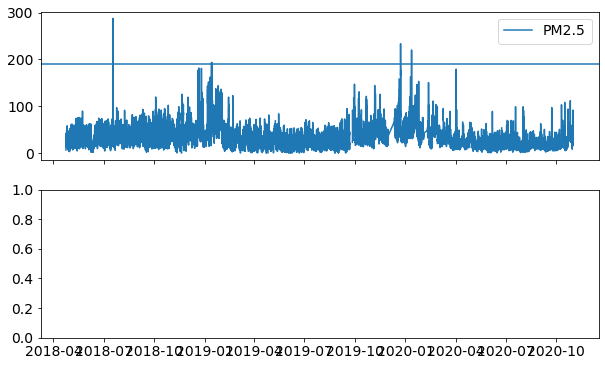

In [2316]:
q99 = station_data.quantile(0.9998) 

fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

for i, col in enumerate(['PM2.5', 'PM10']):
    if col in q99.index:
        ax[i].plot(station_data['datetime'], station_data[col], label=col)
        ax[i].axhline(q99[col])
        ax[i].legend()

In [2227]:
start_time = '2020-03-29'
station_data = station_data.set_index('datetime')
# fix PM10
temp = station_data.loc[:start_time, 'PM2.5'].dropna()
station_data['PM10'] = station_data['PM10'].fillna(temp)
station_data.loc[:start_time, 'PM2.5'] = np.nan

In [1743]:
# fix PM2.5
start_time = '2019-03-01'
station_data = station_data.set_index('datetime')
temp = station_data.loc[:start_time, 'PM10'].dropna()
station_data['PM2.5'] = station_data['PM2.5'].fillna(temp)
station_data = station_data.drop('PM10', axis=1)

In [1868]:
#remove the 0.0
for col in [ 'PM2.5']:
    idxs = station_data[station_data[col] == 0.0].index 
    station_data.loc[idxs, col] = np.nan

In [2210]:
#remove the top
for col in [ 'PM2.5']:
    q_value = station_data[col].quantile(0.9998)
    print(q_value)
    idxs = station_data[station_data[col] > q_value].index 
    station_data.loc[idxs, col] = np.nan

610.1272439998265


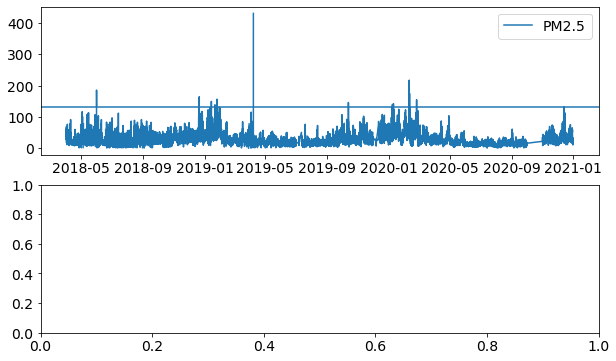

In [2211]:
fig, ax = plt.subplots(2, 1, figsize=(10,3*2))

i = 0
ax[i].plot(station_data['datetime'], station_data['PM2.5'], label="PM2.5")
ax[i].axhline(station_data['PM2.5'].quantile(0.999))
ax[i].legend()

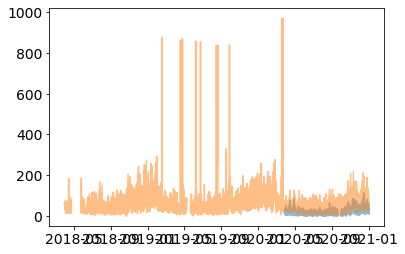

In [2230]:
plt.plot(station_data['datetime'], station_data['PM2.5'], alpha=0.5)
plt.plot(station_data['datetime'], station_data['PM10'], alpha=0.5)

In [2317]:
# fix columns header
old_cols = ['WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY',
       'PRESSURE', 'TEMP']
new_cols = ['WS', 'WD', 'Temp', 'RH', 'BP', 'Temp']

for old_col, new_col in zip(old_cols, new_cols):
    station_data.columns = station_data.columns.str.replace(old_col, new_col)
print(station_data.columns)

melt_station_data = station_data.melt(id_vars='datetime')
melt_station_data.head()

Index(['PM2.5', 'WS', 'WD', 'Temp', 'RH', 'BP', 'datetime'], dtype='object')


,datetime,variable,value
0,2018-04-01 00:00:00,PM2.5,NaN
1,2018-04-01 01:00:00,PM2.5,NaN
2,2018-04-01 02:00:00,PM2.5,NaN
3,2018-04-01 03:00:00,PM2.5,NaN
4,2018-04-01 04:00:00,PM2.5,NaN


In [2318]:
temp = []
for col in melt_station_data['variable'].unique():
    df = melt_station_data[melt_station_data['variable']==col].groupby('datetime').max()[['value']]
    df.columns = [col]
    temp.append(df)

temp = pd.concat(temp, axis=1)
temp.head()

,PM2.5,WS,WD,Temp,RH,BP
datetime,,,,,,
2018-04-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN


In [2319]:
station_data = temp.dropna(how='all').reset_index()
station_data.head()

,datetime,PM2.5,WS,WD,Temp,RH,BP
0,2018-04-23 17:00:00,6.86,NaN,NaN,NaN,NaN,NaN
1,2018-04-23 18:00:00,22.62,NaN,NaN,NaN,NaN,NaN
2,2018-04-23 19:00:00,29.11,NaN,NaN,NaN,NaN,NaN
3,2018-04-23 20:00:00,20.54,NaN,NaN,NaN,NaN,NaN
4,2018-04-23 21:00:00,24.32,NaN,NaN,NaN,NaN,NaN


In [2320]:
try:
    station_data = station_data.drop('AVG', axis=1)
except:
    pass

In [2321]:
station_data.to_csv(filename, index=False, encoding='utf-8' )

# Final Merge

In [293]:
with open(to_folder + 'station_info.json', encoding="utf-8") as f:
    bkp_station = json.load(f)
    
bkp_station = pd.Series(bkp_station)

In [295]:
i = 2
stat_id = bkp_station.index[i]
stat_id = 'bkp91t'
print(stat_id)
print( bkp_station.loc[stat_id])

bkp91t
เขตทุ่งครุ


In [296]:
# load historical and scrape data
filename = final_folder + stat_id + '_hist.csv'
station_data = pd.read_csv(filename)
station_data['datetime'] = pd.to_datetime(station_data['datetime'])
station_data['station_id'] = stat_id
old_cols = ['WIND SPEED', 'WIND DIRECTION', 'TEMPERATURE', 'RELATIVE HUMIDITY',
       'PRESSURE', 'Temp']
new_cols = ['WS', 'WD', 'Temp', 'RH', 'BP', 'Temp']

for old_col, new_col in zip(old_cols, new_cols):
    station_data.columns = station_data.columns.str.replace(old_col, new_col)
print(station_data.columns)

station_data = station_data.dropna(axis=1,how='all')

# scrape data
scrape_data = pd.read_csv(update_folder + stat_id + '.csv')
scrape_data['datetime'] = pd.to_datetime(scrape_data['datetime'])

print(scrape_data.columns)

station_data['station_name']  = bkp_station.loc[stat_id]
scrape_data['station_name'] = bkp_station.loc[stat_id]
scrape_data['station_id']  = station_data['station_id'].unique()[0]

Index(['datetime', 'index', 'PM10', 'WS', 'WD', 'Temp', 'RH', 'BP', 'PM2.5',
       'station_id'],
      dtype='object')
Index(['datetime', 'PM10', 'WS', 'WD', 'Temp', 'RH', 'BP', 'PM2.5',
       'station_id', 'station_name'],
      dtype='object')


In [299]:
final_data = pd.concat([station_data, scrape_data], ignore_index=True )
final_data = final_data.groupby('datetime' ).mean()
final_data = final_data.dropna(how='all')
final_data = final_data.reset_index()
final_data['station_id'] = stat_id
final_data['station_name'] = bkp_station.loc[stat_id]

In [301]:
for col in ['PM10','PM2.5', 'WS', 'WD', 'Temp', 'RH', 'BP']:
    if col in final_data.columns:
        idxs = final_data[final_data[col] < 0].index
        final_data.loc[idxs, col] = np.nan
        
if 'PM2.5' in final_data.columns:
    idxs = final_data[final_data['PM2.5'] > 250].index
    final_data.loc[idxs, 'PM2.5'] = np.nan
    
if 'PM10' in final_data.columns:
    idxs = final_data[final_data['PM10'] > 400].index
    final_data.loc[idxs, 'PM10'] = np.nan
    
if 'PM2.5' in final_data.columns:
    idxs = final_data[final_data['PM2.5'] <= 0.0].index
    final_data.loc[idxs, 'PM2.5'] = np.nan

In [302]:
final_data.tail()

,datetime,index,PM10,WS,WD,Temp,RH,BP,PM2.5,station_id,station_name
24158,2021-01-22 18:00:00,NaN,145.0,0.1,221.6,29.0,54.0,1009.0,83.0,bkp91t,เขตทุ่งครุ
24159,2021-01-22 19:00:00,NaN,134.0,0.1,262.6,27.0,60.0,1010.0,82.0,bkp91t,เขตทุ่งครุ
24160,2021-01-22 20:00:00,NaN,132.0,0.2,299.8,26.0,69.0,1010.0,84.0,bkp91t,เขตทุ่งครุ
24161,2021-01-22 21:00:00,NaN,128.0,0.2,311.6,25.0,72.0,1011.0,93.0,bkp91t,เขตทุ่งครุ
24162,2021-01-22 22:00:00,NaN,123.0,0.1,304.2,25.0,73.0,1011.0,104.0,bkp91t,เขตทุ่งครุ


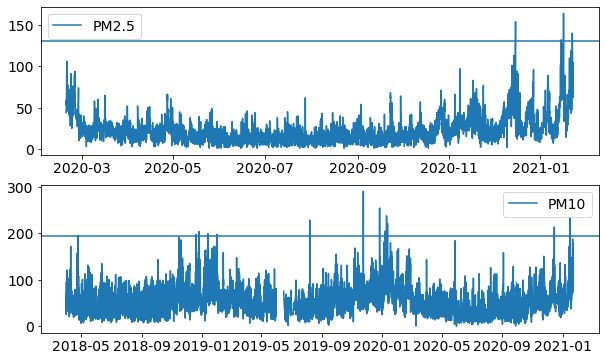

In [303]:
q99 = final_data.quantile(0.999) 

 
fig, ax = plt.subplots(2, 1, figsize=(10,3*2))

i = 0
ax[i].plot(final_data['datetime'], final_data['PM2.5'], label="PM2.5")
ax[i].axhline(final_data['PM2.5'].quantile(0.999))
ax[i].legend()

try:
    i = 1
    ax[i].plot(final_data['datetime'], final_data['PM10'], label="PM10")
    ax[i].axhline(final_data['PM10'].quantile(0.999))
    ax[i].legend()
    
except:
    pass

In [304]:
final_data = final_data.sort_values('datetime')
final_data.to_csv(update_folder + stat_id + '.csv' , index=False , encoding='utf-8')

# Fix data

In [109]:
for stat_id in bkp_station.index:
    filename = update_folder + stat_id + '.csv' 
    final_data = pd.read_csv(filename)
    try:
        pd.to_datetime(final_data['datetime'])
    except:
        print(filename)
 

In [110]:
filename = update_folder + 'bkp56t' + '.csv' 
final_data = pd.read_csv(filename)
final_data.tail()

,datetime,PM10,CO,NO,NO2,NOX,PM2.5,station_id,station_name
121400,2021-01-31 03:00:00,91.0,0.0,2.0,5.0,7.0,55.0,bkp56t,เขตดินแดง
121401,2021-01-31 04:00:00,94.0,0.0,1.0,4.0,5.0,51.0,bkp56t,เขตดินแดง
121402,2021-01-31 05:00:00,80.0,0.0,3.0,4.0,7.0,47.0,bkp56t,เขตดินแดง
121403,2021-01-31 06:00:00,53.0,0.0,4.0,5.0,10.0,40.0,bkp56t,เขตดินแดง
121404,2021-01-31 07:00:00,76.0,0.0,8.0,7.0,15.0,42.0,bkp56t,เขตดินแดง


In [17]:
i = 0
stat_id = bkp_station.index[i]
print( bkp_station.loc[stat_id])

final_data = pd.read_csv(update_folder + stat_id + '.csv' )
final_data['datetime'] = pd.to_datetime(final_data['datetime'])
final_data.head()

1 เขตดินแดง


,datetime,PM10,CO,NO,NO2,NOX,station_id,station_name,BARO,PM2.5
0,2006-01-01 08:00:00,NaN,1.7,100.0,4.0,104.0,bkp56t,เขตดินแดง,NaN,NaN
1,2006-01-01 09:00:00,NaN,1.5,83.0,4.0,86.0,bkp56t,เขตดินแดง,NaN,NaN
2,2006-01-01 10:00:00,NaN,1.0,30.0,1.0,30.0,bkp56t,เขตดินแดง,NaN,NaN
3,2006-01-01 11:00:00,NaN,1.0,31.0,1.0,32.0,bkp56t,เขตดินแดง,NaN,NaN
4,2006-01-01 12:00:00,NaN,1.0,31.0,1.0,33.0,bkp56t,เขตดินแดง,NaN,NaN


In [19]:
final_data['BARO'].unique()

array([nan, 'เขตดินแดง'], dtype=object)

In [18]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124841 entries, 0 to 124840
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   datetime      124841 non-null  datetime64[ns]
 1   PM10          119732 non-null  float64       
 2   CO            112238 non-null  float64       
 3   NO            114244 non-null  float64       
 4   NO2           114271 non-null  float64       
 5   NOX           114223 non-null  float64       
 6   station_id    124841 non-null  object        
 7   station_name  124841 non-null  object        
 8   BARO          205 non-null     object        
 9   PM2.5         8942 non-null    float64       
dtypes: datetime64[ns](1), float64(6), object(3)
memory usage: 9.5+ MB


In [1496]:
final_data['station_id'] = stat_id
final_data['station_name'] = bkp_station.loc[stat_id]

In [1497]:
final_data.to_csv(update_folder + stat_id + '.csv' , index=False , encoding='utf-8')


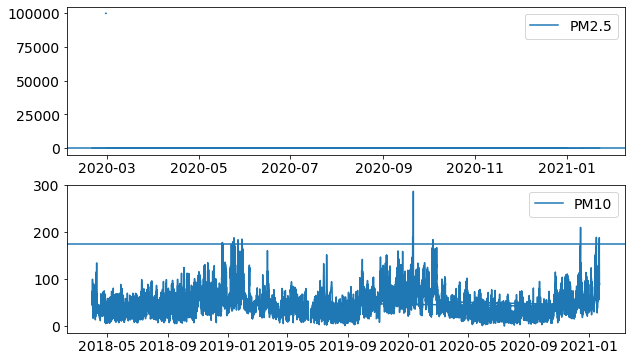

In [1328]:

fig, ax = plt.subplots(2, 1, figsize=(10,3*2))

i = 0
ax[i].plot(final_data['datetime'], final_data['PM2.5'], label="PM2.5")
ax[i].axhline(final_data['PM2.5'].quantile(0.999))
ax[i].legend()

try:
    i = 1
    ax[i].plot(final_data['datetime'], final_data['PM10'], label="PM10")
    ax[i].axhline(final_data['PM10'].quantile(0.999))
    ax[i].legend()
    
except:
    pass

# Add Station Locations

In [182]:
raw_folder = '../data/bma_raw/'
proc_folder = raw_folder + 'process/'
final_folder =  raw_folder + 'final/'
bkp_folder = update_folder = to_folder = '../data/bkp_hourly/'
air4_thai = '../data/air4thai_hourly/'

In [7]:
with open(air4_thai + 'station_info.json', encoding="utf-8") as f:
    station_info = json.load(f)
    
stations = pd.DataFrame(station_info['stations'])
bkp_station_loc = stations[stations['stationID'].str.contains('b')]
print(bkp_station_loc.shape)

(48, 10)


In [62]:
station_with_loc = bkp_station_loc['stationID'].to_list()

In [152]:
with open(to_folder + 'station_info.json', encoding="utf-8") as f:
    bkp_station = json.load(f)
    
bkp_station = pd.Series(bkp_station)

In [153]:
total_station = bkp_station.index.to_list()

In [72]:
station_no_location = list(set(total_station).difference(station_with_loc))

In [111]:
bkp_station[station_no_location].to_csv(to_folder + 'add_stations_location.csv', index=True, encoding="utf-8")

# Check outlier station

In [579]:
bkp_station = pd.read_csv('../data/bkp_hourly/station_info.csv')

In [326]:
i = 0
row = bkp_station.iloc[i]
stat_id = row['stationID']
areaTH = row['areaTH']
print(stat_id, areaTH)
filename = bkp_folder + stat_id + '.csv'

df = pd.read_csv(filename) 
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')

bkp114t nan


In [582]:
min_pm25_time = []
mean_pm25_value = []
max_pm25_value = []

min_pm10_time = []
mean_pm10_value = []
max_pm10_value = []

station_with_no2 = []

df_list = []
for stat_id in bkp_station['stationID']:
    filename = bkp_folder + stat_id + '.csv'
    df = pd.read_csv(filename) 
    df['datetime'] = pd.to_datetime(df['datetime'])
    df = df.set_index('datetime')
    
    
    if 'PM2.5' in df.columns:
        temp = df[['PM2.5']].dropna()
        min_pm25_time.append(temp.index.min())
        mean_pm25_value.append(temp['PM2.5'].mean())
        max_pm25_value.append(temp['PM2.5'].max())
    else:
        min_pm25_time.append(np.nan)
        mean_pm25_value.append(np.nan)
        max_pm25_value.append(np.nan)
        
    if 'PM10' in df.columns:
        temp = df[['PM10']].dropna()
        min_pm10_time.append(temp.index.min())
        mean_pm10_value.append(temp['PM10'].mean())
        max_pm10_value.append(temp['PM10'].max())
    else:
        min_pm10_time.append(np.nan)
        mean_pm10_value.append(np.nan)
        max_pm10_value.append(np.nan)
        
    if 'NO2' in df.columns:
        temp = df[['NO2']].dropna()
        df_list.append(temp)
        print(filename)
        station_with_no2.append(stat_id)

bkp_station['min_pm25_time'] = min_pm25_time
bkp_station['mean_pm25'] = mean_pm25_value
bkp_station['max_pm25'] = max_pm25_value

bkp_station['min_pm10_time'] = min_pm10_time
bkp_station['mean_pm10'] = mean_pm10_value
bkp_station['max_pm10'] = max_pm10_value

../data/bkp_hourly/bkp56t.csv
../data/bkp_hourly/bkp57t.csv
../data/bkp_hourly/bkp58t.csv
../data/bkp_hourly/bkp59t.csv


In [588]:
print(bkp_station[bkp_station['min_pm25_time'] < '2019-01-01']['stationID'].to_list())

['bkp100t', 'bkp103t', 'bkp105t', 'bkp62t', 'bkp63t', 'bkp64t', 'bkp65t', 'bkp66t', 'bkp69t', 'bkp73t', 'bkp76t', 'bkp78t', 'bkp83t', 'bkp85t', 'bkp88t', 'bkp92t', 'bkp94t', 'bkp95t', 'bkp97t', 'bkp98t', 'bkp82t', 'bkp112t', 'bkp67t']


In [503]:
bkp_station = bkp_station.sort_values('max_pm10') 

In [585]:
bkp_station['max_pm10'].dropna() 

1     400.67
2     303.00
4     433.68
6     400.00
7     394.00
8     399.00
9     196.00
10    299.00
11    299.00
18    394.57
19    296.00
20    313.53
22    230.00
23    279.36
25    306.75
27    358.35
28    272.00
29    340.65
31    307.32
33    303.00
34    283.00
36    591.00
37    241.00
38    290.00
40    230.00
43    303.72
46    229.00
Name: max_pm10, dtype: float64

In [450]:
idxs = bkp_station['max_pm10'].dropna().tail(20).index
to_inspect = bkp_station.loc[idxs,:]['stationID'].to_list()

bkp58t
Index(['PM10', 'PM2.5', 'CO', 'NO2', 'NO', 'NOX', 'station_id',
       'station_name'],
      dtype='object')


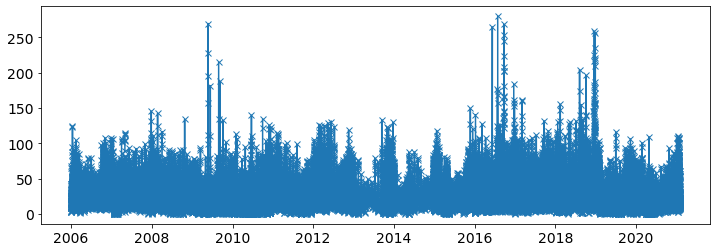

In [571]:
stat_id = station_with_no2[2]
print(stat_id)
filename = bkp_folder + stat_id + '.csv'
df = pd.read_csv(filename) 
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')
print(df.columns)

plt.figure(figsize=(12, 4))
plt.plot(df['NO2'], marker='x')

In [572]:
if 'NO2' in df.columns:
    idxs = df[df['NO2'] > 300].index
    df.loc[idxs, 'NO2'] = np.nan

if 'NO2' in df.columns:
    idxs = df[df['NO2'] <= 0.0].index
    df.loc[idxs, 'NO2'] = np.nan

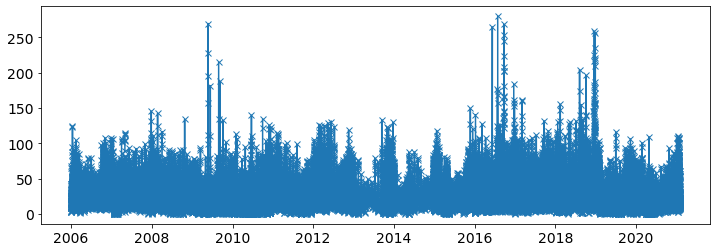

In [573]:
plt.figure(figsize=(12, 4))
plt.plot(df['NO2'], marker='x')

In [574]:
df = df.reset_index()
df.head()

,datetime,PM10,PM2.5,CO,NO2,NO,NOX,station_id,station_name
0,2006-01-01 08:00:00,79.0,NaN,0.3,12.0,4.0,16.0,bkp58t,เขตราษฎร์บูรณะ
1,2006-01-01 09:00:00,83.0,NaN,0.3,14.0,3.0,18.0,bkp58t,เขตราษฎร์บูรณะ
2,2006-01-01 10:00:00,85.0,NaN,0.2,14.0,1.0,16.0,bkp58t,เขตราษฎร์บูรณะ
3,2006-01-01 11:00:00,86.0,NaN,0.1,9.0,0.0,10.0,bkp58t,เขตราษฎร์บูรณะ
4,2006-01-01 12:00:00,51.0,NaN,0.1,3.0,0.0,3.0,bkp58t,เขตราษฎร์บูรณะ


In [575]:
df.to_csv(filename, index=False) 

# Map

In [13]:
raw_folder = '../data/bma_raw/'
proc_folder = raw_folder + 'process/'
final_folder =  raw_folder + 'final/'
bkp_folder = update_folder = to_folder = '../data/bkp_hourly/'
air4_thai = '../data/air4thai_hourly/'

In [14]:
dataset = Dataset('Bangkok')

In [173]:
# PCD station by provinces
bkk_stations = ['02t', '03t', '05t', '10t', '11t', '12t', '50t', '52t', '53t', '59t', '61t', '54t']
nontha_buri = ['13t', '22t']
pathum_thani = ['20t']
samut_pakarn = ['08t', '11t', '17t', '18t', '19t']
samut_sakorn = ['14t', '27t']
nakorn_pathom = ['81t']

all_stations = bkk_stations + nontha_buri + pathum_thani + samut_pakarn + samut_sakorn + nakorn_pathom

In [174]:
# PCD station by zone
# downtown ( '54t' has erradict behavior)
dt = ['10t', '11t', '12t','50t', '53t',  '54t', '59t', '61t']
#urban and outer bkk
ub = ['02t', '52t', '08t', '17t', '05t',  '13t']
sub = ['22t', '03t', '18t']
out = ['81t', '27t', '14t', '20t', '19t']

all_stations_list = dt + ub + sub + out
# remove station with less than 1 years data or erratic behavior
#dt.remove('54t')
stations_zone = [dt, ub, sub, out]

In [17]:
with open('../data/air4thai_hourly/station_info.json', encoding="utf8") as f:
    station_info = json.load(f)
    
station_info = pd.DataFrame(station_info['stations'])
# add "EPSG:3857"
station_info = add_merc_col(station_info, lat_col='lat', long_col='long')
 
#bkk_stations = station_info[station_info['stationID'].isin(bkk_stations)].reset_index()
all_stations = station_info[station_info['stationID'].isin(all_stations_list)].reset_index()
all_stations = all_stations.sort_values('stationID')

In [22]:
bkp_station = pd.read_csv('../data/bkp_hourly/station_info.csv')
# bkp_pm25
bkp_pm25 = ['bkp100t', 'bkp103t', 'bkp105t', 'bkp62t', 'bkp63t', 'bkp64t', 'bkp65t', 'bkp66t', 'bkp69t', 'bkp73t', 'bkp76t', 'bkp78t', 'bkp83t', 'bkp85t', 'bkp88t', 'bkp92t', 'bkp94t', 'bkp95t', 'bkp97t', 'bkp98t', 'bkp82t', 'bkp112t', 'bkp67t']

bkp_dt = ['bkp56t', 'bkp62t', 'bkp63t', 'bkp64t', 'bkp65t', 'bkp66t', 'bkp67t', 'bkp76t', 'bkp83t', 'bkp92t',  'bkp94t']
bkp_sub = ['bkp88t', 'bkp97t', 'bkp98t', 'bkp105t']
bkp_ub = ['bkp57t', 'bkp58t', 'bkp69t', 'bkp73t', 'bkp82t', 'bkp85t', 'bkp95t', 'bkp100t', 'bkp103t' ,'bkp112t']
bkp_out = [ 'bkp78t']

bkp_stations_zone = [bkp_dt, bkp_ub, bkp_sub, bkp_out]

bkp_no2 = ['bkp56t', 'bkp57t', 'bkp58t']
# select only valid PM2.5 station
sub_bkp_station = bkp_station[bkp_station['stationID'].isin(bkp_pm25)]
no2_bkp_station = bkp_station[bkp_station['stationID'].isin(bkp_no2)]

In [15]:
x = dataset.city_info['long_m']
y = dataset.city_info['lat_m']
#stepx = 2E5

stepx = 5E4
stepy = stepx
xmap_range = [x - 1.1*stepx, x + 0.75*stepx]
ymap_range = [1540000, y + 0.6*stepy]

stepx = 1.4E4
stepy = stepx
xmap_range_zoom = [x - 0.6*stepx, x + 1.3*stepx]
ymap_range_zoom = [y - 1*stepy, y + 1*stepy]

In [19]:
p = plot_basemap(xmap_range, ymap_range, toolbar_location=None,  plot_width=800, plot_height=800, title='Bangkok Metropolitan Region', watermark=False)
 
colors = ['mediumorchid', 'tomato', 'orange', 'limegreen']

source = ColumnDataSource(data=bkp_station)

# add bkp station location
for i, stat_list in enumerate(bkp_stations_zone):
    sub_station = sub_bkp_station[sub_bkp_station['stationID'].isin(stat_list)]
    for ii, row in sub_station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
            
bkplabels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='right',
              x_offset=12, y_offset=-10, source=source)


# for bokeh
source = ColumnDataSource(data=all_stations)

for i, stat_list in  enumerate(stations_zone):
    sub_station = all_stations[all_stations['stationID'].isin(stat_list)]
    for ii, row in sub_station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
   
labels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='center',
              x_offset=0, y_offset=-10, source=source)


box_x = [xmap_range_zoom[0], xmap_range_zoom[0], xmap_range_zoom[1], xmap_range_zoom[1], xmap_range_zoom[0]]
box_y = [ymap_range_zoom[0]+500, ymap_range_zoom[1]-100, ymap_range_zoom[1]-100, ymap_range_zoom[0]+500, ymap_range_zoom[0]+500]


p.line(box_x, box_y, color='blue', line_dash ='dashed', line_width=2, legend_label='center Bangkok')
p.add_layout(bkplabels)
p.add_layout(labels)
show(p)

In [24]:
p = plot_basemap(xmap_range_zoom, ymap_range_zoom,toolbar_location=None,  plot_width=800, plot_height=800, title='Center Bangkok', watermark=False)
 
colors = get_color(color_length=len(all_stations))

colors = ['mediumorchid', 'tomato', 'orange', 'limegreen']

sub_bkp_station['stationID'] = sub_bkp_station['stationID'].str.replace('kp', '')

source = ColumnDataSource(data=sub_bkp_station)

# add bkp station location
for i, stat_list in enumerate(bkp_stations_zone):
    stat_list = [s.replace('kp','') for s in stat_list]

    sub_station = sub_bkp_station[sub_bkp_station['stationID'].isin(stat_list)]
    for ii, row in sub_station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
            
bkplabels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='right',
              x_offset=12, y_offset=-10, source=source,  text_font_size="10pt")

# for bokeh
source = ColumnDataSource(data=all_stations)

for i, stat_list in enumerate(stations_zone):
    sub_station = all_stations[all_stations['stationID'].isin(stat_list)]
    for ii, row in sub_station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
   
labels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='center',
              x_offset=0, y_offset=-10, source=source)

p.line(box_x, box_y , color='blue', line_dash ='dashed', line_width=2)
p.add_layout(bkplabels)

p.add_layout(labels)
show(p)

In [29]:
# only NO2 station
p = plot_basemap(xmap_range, ymap_range, toolbar_location=None,  plot_width=800, plot_height=800, title='Bangkok Metropolitan Region', watermark=False)
 
colors = ['mediumorchid', 'tomato', 'orange', 'limegreen']

source = ColumnDataSource(data=no2_bkp_station)

# add bkp station location
for i, stat_list in enumerate(bkp_stations_zone):
    sub_station = no2_bkp_station[no2_bkp_station['stationID'].isin(stat_list)]
    for ii, row in sub_station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
            
bkplabels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='right',
              x_offset=12, y_offset=-10, source=source)


# for bokeh
source = ColumnDataSource(data=all_stations)

for i, stat_list in  enumerate(stations_zone):
    sub_station = all_stations[all_stations['stationID'].isin(stat_list)]
    for ii, row in sub_station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
   
labels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='center',
              x_offset=0, y_offset=-10, source=source)


box_x = [xmap_range_zoom[0], xmap_range_zoom[0], xmap_range_zoom[1], xmap_range_zoom[1], xmap_range_zoom[0]]
box_y = [ymap_range_zoom[0]+500, ymap_range_zoom[1]-100, ymap_range_zoom[1]-100, ymap_range_zoom[0]+500, ymap_range_zoom[0]+500]


p.line(box_x, box_y, color='blue', line_dash ='dashed', line_width=2, legend_label='center Bangkok')
p.add_layout(bkplabels)
p.add_layout(labels)
show(p)
export_png(p, filename='E:/Documents/Downloads/' + "no2_staiton_map_bma.png")

'E:\\Documents\\Downloads\\no2_staiton_map_bma.png'

In [27]:
# interesting No2 station
p = plot_basemap(xmap_range_zoom, ymap_range_zoom,toolbar_location=None,  plot_width=800, plot_height=800, title='Center Bangkok', watermark=False)
 
colors = get_color(color_length=len(all_stations))

colors = ['mediumorchid', 'tomato', 'orange', 'limegreen']

no2_bkp_station['stationID'] = no2_bkp_station['stationID'].str.replace('kp', '')

source = ColumnDataSource(data=no2_bkp_station)

# add bkp station location
for i, stat_list in enumerate(bkp_stations_zone):
    stat_list = [s.replace('kp','') for s in stat_list]

    station = no2_bkp_station[no2_bkp_station['stationID'].isin(stat_list)]
    for ii, row in station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
            
bkplabels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='right',
              x_offset=12, y_offset=-10, source=source,  text_font_size="10pt")

# for bokeh
source = ColumnDataSource(data=all_stations)

for i, stat_list in enumerate(stations_zone):
    station = all_stations[all_stations['stationID'].isin(stat_list)]
    for ii, row in station.iterrows():
         p.circle(row['long_m'], row['lat_m'], size=30, color=colors[i], line_color='black')
   
labels = LabelSet(x='long_m', y='lat_m', text='stationID', render_mode='css', text_align='center',
              x_offset=0, y_offset=-10, source=source)

p.line(box_x, box_y , color='blue', line_dash ='dashed', line_width=2)
p.add_layout(bkplabels)

p.add_layout(labels)
show(p)
export_png(p, filename='E:/Documents/Downloads/' + "no2_downtown.png")

'E:\\Documents\\Downloads\\no2_downtown.png'

In [672]:
bkp_station[bkp_station['stationID'] =='bkp92t']

,stationID,nameTH,nameEN,areaTH,areaEN,stationType,lat,long,forecast,LastUpdate,long_m,lat_m
39,bkp92t,สำนักงานเขตพระนคร,"Phra Nakhon District Office, Bangkok","ริมถนนสามเสน เขตพระนคร, กรุงเทพฯ","Samsen Roadside, Phra Nakhon, Bangkok",BKK,13.76415,100.499077,[],"{'date': '2021-01-31', 'time': '01:00', 'PM25'...",1.118751e+07,1.547172e+06


In [680]:
labels = ['downtown', 'urban', 'suburbant', 'outer']
cols = ['stationID', 'lat', 'long', 'long_m', 'lat_m', 'zone']

station_location = []
for i, stat_list in enumerate(stations_zone):
    sub_station = all_stations[all_stations['stationID'].isin(stat_list)]
    sub_station['zone'] = labels[i]
    station_location.append(sub_station[cols])
    
for i, stat_list in enumerate(bkp_stations_zone):
    sub_station = sub_bkp_station[sub_bkp_station['stationID'].isin(stat_list)]
    sub_station['zone'] = labels[i]
    station_location.append(sub_station[cols])
    
station_location = pd.concat(station_location)

In [681]:
station_location.to_csv('E:/Documents/Downloads/bkk_station_locations.csv', index=False)

# Data from Taxi Probes

In [3]:
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
t_files

['../data/traffic\\2017-2020_hourly_CI.csv',
 '../data/traffic\\2017-2020_hourly_stats_final.csv',
 '../data/traffic\\daily2020.csv',
 '../data/traffic\\trafficindex2012.csv',
 '../data/traffic\\trafficindex2013.csv',
 '../data/traffic\\trafficindex2014.csv',
 '../data/traffic\\trafficindex2015.csv',
 '../data/traffic\\trafficindex2016.csv',
 '../data/traffic\\trafficindex2017.csv',
 '../data/traffic\\trafficindex2018.csv',
 '../data/traffic\\trafficindex2019.csv',
 '../data/traffic\\trafficindex2020.csv']

In [5]:
# load taxi probe data 
ci = pd.read_csv(t_files[0])
ci['Time'] = pd.to_datetime(ci['Time'])
# take the average to compare to longdo data
ci_avg = ci.groupby('Time').mean()
print(ci_avg.index.max(), ci_avg.index.min())

# clean up strange value 
ci_clean = ci[(ci['CI']<2.5) & (ci['CI'] > 0)]

2020-12-31 23:00:00 2017-01-01 00:00:00


In [7]:
# load taxi probe data 
ci_new = pd.read_csv(t_files[1])
ci_new['Time'] = pd.to_datetime(ci_new['Time'])
# take the average to compare to longdo data
ci_new_avg = ci_new.groupby('Time').mean()

# clean up strange value 
ci_clean = ci_new[(ci_new['CI']<2.2) & (ci_new['CI'] > 0)][['Time','Station','CI']]

# take the average to compare to longdo data
ci_avg = ci_new.groupby('Time').mean()

ci = ci_new

print(ci_new_avg.index.max(), ci_new_avg.index.min())

2019-12-09 21:00:00 2017-01-01 00:00:00


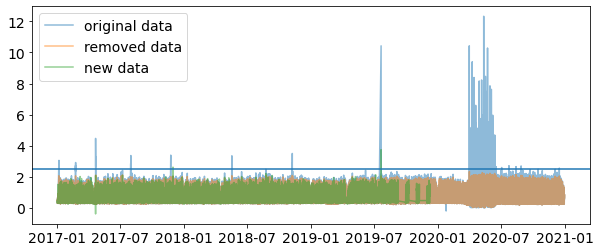

In [8]:
plt.figure(figsize=(10,4))
plt.plot(ci_avg, label='original data', alpha=0.5)
plt.plot(ci_clean.groupby('Time').mean(), alpha=0.5, label='removed data')
plt.plot(ci_new.groupby('Time').mean()['CI'], alpha=0.5, label='new data')

plt.axhline(2.5)
plt.legend()

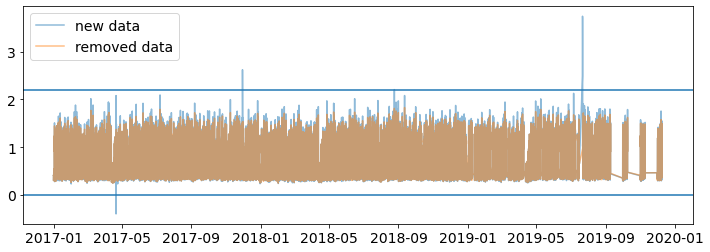

In [20]:
plt.figure(figsize=(12,4))
#plt.plot(ci_avg, label='original data', alpha=0.5)
#plt.plot(ci_clean.groupby('Time').mean(), alpha=0.5, label='removed data')
plt.plot(ci_new.groupby('Time').mean()['CI'], alpha=0.5, label='new data')
plt.plot(ci_clean.groupby('Time')['CI'].mean(), alpha=0.5, label='removed data')

plt.axhline(2.2)
plt.axhline(0)

plt.legend()

In [6]:
print(ci_avg.columns)

Index(['CI'], dtype='object')


In [7]:
# load longdo data
files_list =  ['../data/traffic\\trafficindex2017.csv',
 '../data/traffic\\trafficindex2018.csv',
 '../data/traffic\\trafficindex2019.csv',
 '../data/traffic\\trafficindex2020.csv']

ci_long = []
for file in files_list:
    ci_long.append(pd.read_csv(file))
  
ci_long = pd.concat(ci_long)
ci_long['datetime'] = pd.to_datetime(ci_long['datetime'])
ci_long = ci_long.set_index('datetime')
ci_long = ci_long.drop('timestamp', axis=1)
ci_long = ci_long.resample('H').mean()
print(ci_long.columns)

Index(['index'], dtype='object')


In [8]:
ci_all = ci_avg.merge(ci_long, left_index=True, right_index=True, how='outer')
ci_all = ci_all.rename(columns={'CI': 'taxi_ci', 'index': 'longdo_ci'})

# check max min 
print('max', ci_all.max())

print('min', ci_all.min())

max taxi_ci      12.333333
longdo_ci     9.816667
dtype: float64
min taxi_ci     -0.205511
longdo_ci    0.000000
dtype: float64


Text(0, 0.5, 'Longdo CI')

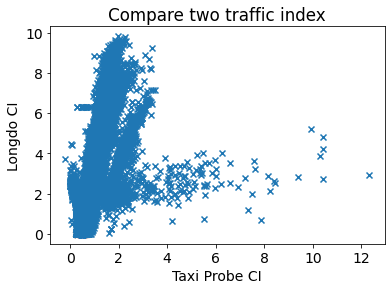

In [32]:
plt.scatter(ci_all['taxi_ci'], ci_all['longdo_ci'], marker='x')
plt.title('Compare two traffic index')

plt.xlabel('Taxi Probe CI')
plt.ylabel('Longdo CI')

Text(0, 0.5, 'CI')

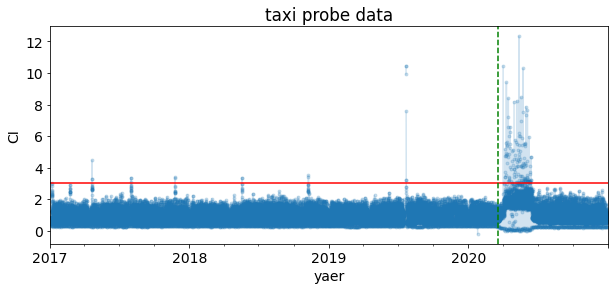

In [74]:
plt.figure(figsize=(10,4))
plt.title('taxi probe data')

ci_all.loc['2017':, 'taxi_ci'].plot(marker='.', label='raw data',alpha=0.2)
#temp.loc['2018':, 'taxi_ci'].plot(marker='.', alpha=0.05, color='red', label='keep dara')
plt.axhline(3, color='red')
plt.axvline('2020-03-20', color='green', linestyle='dashed')

plt.xlabel('yaer')
plt.ylabel('CI')

<AxesSubplot:title={'center':'longdo data'}>

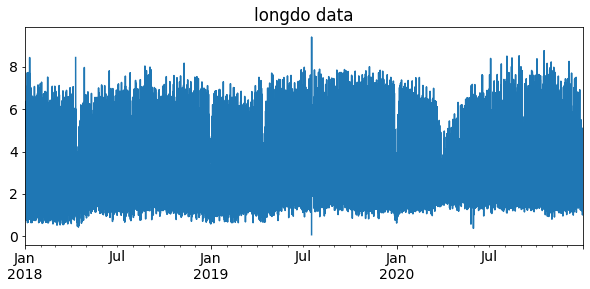

In [75]:
plt.figure(figsize=(10,4))
plt.title('longdo data')
ci_all.loc['2018':, 'longdo_ci'].plot()

In [48]:
# omit data higher than 3 
idxs = ci_all[ci_all['taxi_ci'] >= 3].index

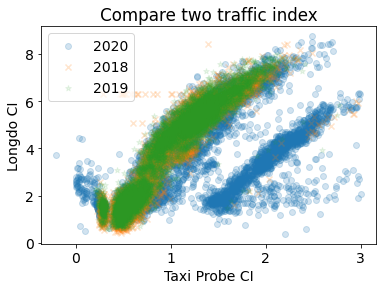

In [64]:
temp = ci_all.drop(idxs)
temp = temp.loc['2020']
plt.scatter(temp['taxi_ci'], temp['longdo_ci'], marker='o', label='2020', alpha=.2)

temp = ci_all.drop(idxs)
temp = temp.loc['2018']
plt.scatter(temp['taxi_ci'], temp['longdo_ci'], marker='x', label='2018', alpha=.2)

temp = ci_all.drop(idxs)
temp = temp.loc['2019']
plt.scatter(temp['taxi_ci'], temp['longdo_ci'], marker='*', label='2019', alpha=.1)


plt.title('Compare two traffic index')
plt.xlabel('Taxi Probe CI')
plt.ylabel('Longdo CI')
plt.legend()

In [66]:
temp = ci_all.drop(idxs)

print(temp.corr(method='pearson'))

print(temp.corr(method='spearman'))


            taxi_ci  longdo_ci
taxi_ci    1.000000   0.776691
longdo_ci  0.776691   1.000000
            taxi_ci  longdo_ci
taxi_ci    1.000000   0.834191
longdo_ci  0.834191   1.000000


In [22]:
dataset = Dataset('Bangkok')
dataset.load_()

In [23]:
df = dataset.wea.copy()
df['time_of_day'] = df.index.hour
df = df.groupby('time_of_day').mean()['Wind_Speed(kmph)']
df[df>9]

time_of_day
14    9.584810
15    9.865364
16    9.646021
Name: Wind_Speed(kmph), dtype: float64

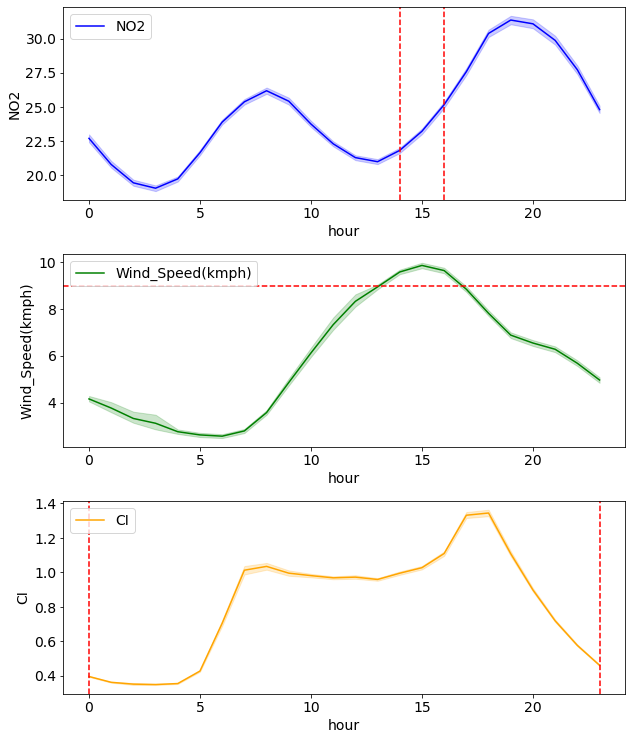

In [24]:
_, ax = plt.subplots(3, 1, figsize=(9, 3.5*3))
plot_hour_avg(dataset.poll_df.copy(), 'NO2', ax[0],  color='blue')
plot_hour_avg(dataset.wea.copy(), 'Wind_Speed(kmph)', ax[1],  color='green')
plot_hour_avg(ci_avg, 'CI', ax[2],  color='orange')

ax[1].axhline(9, color='red', linestyle='dashed')
ax[0].axvline(14, color='red', linestyle='dashed')
ax[0].axvline(16, color='red', linestyle='dashed')

ax[2].axvline(0, color='red', linestyle='dashed')
ax[2].axvline(23, color='red', linestyle='dashed')
plt.tight_layout()

## Load Stations Info

In [34]:
# PCD station by provinces
bkk_stations = ['02t', '03t', '05t', '10t', '11t', '12t', '50t', '52t', '53t', '59t', '61t', '54t']
nontha_buri = ['13t', '22t']
pathum_thani = ['20t']
samut_pakarn = ['08t', '11t', '17t', '18t', '19t']
samut_sakorn = ['14t', '27t']
nakorn_pathom = ['81t']

all_stations = bkk_stations + nontha_buri + pathum_thani + samut_pakarn + samut_sakorn + nakorn_pathom

In [35]:
# PCD station by zone
# downtown ( '54t' has erradict behavior)
dt = ['10t', '11t', '12t','50t', '53t',  '54t', '59t', '61t']
#urban and outer bkk
ub = ['02t', '52t', '08t', '17t', '05t',  '13t']
sub = ['22t', '03t', '18t']
out = ['81t', '27t', '14t', '20t', '19t']

all_stations_list = dt + ub + sub + out
# remove station with less than 1 years data or erratic behavior
#dt.remove('54t')
stations_zone = [dt, ub, sub, out]

In [36]:
with open('../data/air4thai_hourly/station_info.json', encoding="utf8") as f:
    station_info = json.load(f)
    
station_info = pd.DataFrame(station_info['stations'])
# add "EPSG:3857"
station_info = add_merc_col(station_info, lat_col='lat', long_col='long')
 
#bkk_stations = station_info[station_info['stationID'].isin(bkk_stations)].reset_index()
all_stations = station_info[station_info['stationID'].isin(all_stations_list)].reset_index()
all_stations = all_stations.sort_values('stationID')

In [37]:
bkp_station = pd.read_csv('../data/bkp_hourly/station_info.csv')

bkp_all_stations_list = ['bkp100t', 'bkp103t', 'bkp105t', 'bkp62t', 'bkp63t', 'bkp64t', 'bkp65t', 'bkp66t', 'bkp69t', 'bkp73t', 'bkp76t', 'bkp78t', 'bkp83t', 'bkp85t', 'bkp88t', 'bkp92t', 'bkp94t', 'bkp95t', 'bkp97t', 'bkp98t', 'bkp82t', 'bkp112t', 'bkp67t']


bkp_pm25 = ['bkp100t', 'bkp103t', 'bkp105t', 'bkp62t', 'bkp63t', 'bkp64t', 'bkp65t', 'bkp66t', 'bkp69t', 'bkp73t', 'bkp76t', 'bkp78t', 'bkp83t', 'bkp85t', 'bkp88t', 'bkp92t', 'bkp94t', 'bkp95t', 'bkp97t', 'bkp98t', 'bkp82t', 'bkp112t', 'bkp67t']

bkp_dt = ['bkp56t', 'bkp62t', 'bkp63t', 'bkp64t', 'bkp65t', 'bkp66t', 'bkp67t', 'bkp76t', 'bkp83t', 'bkp92t',  'bkp94t']
bkp_sub = ['bkp88t', 'bkp97t', 'bkp98t', 'bkp105t']
bkp_ub = ['bkp57t', 'bkp58t', 'bkp69t', 'bkp73t', 'bkp82t', 'bkp85t', 'bkp95t', 'bkp100t', 'bkp103t' ,'bkp112t']
bkp_out = [ 'bkp78t']

bkp_stations_zone = [bkp_dt, bkp_ub, bkp_sub, bkp_out]

bkp_no2 = ['bkp56t', 'bkp57t', 'bkp58t']
# select only valid PM2.5 station
sub_bkp_station = bkp_station[bkp_station['stationID'].isin(bkp_pm25)]
no2_bkp_station = bkp_station[bkp_station['stationID'].isin(bkp_no2)]

In [9]:
# combine zone from each stations  
dt_all = (dt    )
ub_all = (ub  )
sub_all = sub  
out_all = out  

pcd_bkp_station_zone = [dt_all, ub_all, sub_all, out_all]

In [36]:
label_list = ['downtown', 'urban', 'suburban', 'out']
ci['zone'] = np.nan

for l, s in zip(stations_zone, label_list):
    idxs = ci[ci['Station'].isin(l)].index
    ci.loc[idxs, 'zone'] = s
    
for l, s in zip(bkp_stations_zone, label_list):
    idxs = ci[ci['Station'].isin(l)].index
    ci.loc[idxs, 'zone'] = s

In [21]:
temp.head()

,Station,CI
Time,,
2017-01-01,50t,0.342676
2017-01-01,54t,0.276639
2017-01-01,11t,0.407070
2017-01-01,12t,0.257090
2017-01-01,61t,0.406242


## CI Stations

Text(0.5, 1.0, 'Downtown Stations')

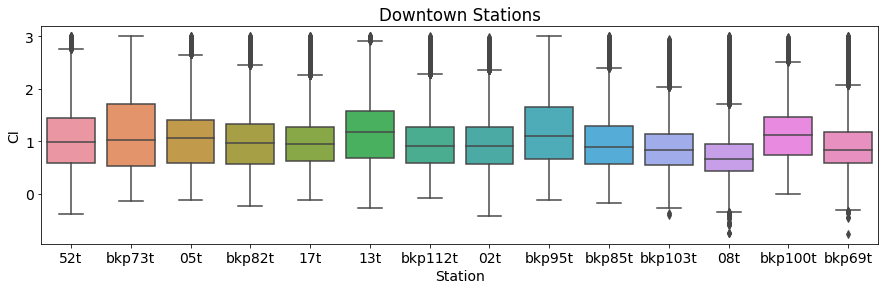

In [28]:
_, ax = plt.subplots(1,1, figsize=(15, 4))
temp = ci.set_index('Time')
temp = temp[temp['CI']<3]
temp = temp[temp['Station'].isin(ub + bkp_ub)]

sns.boxplot(x='Station', y='CI', data=temp, ax=ax)
ax.set_title('Urban Stations')

Text(0.5, 1.0, 'Downtown Stations')

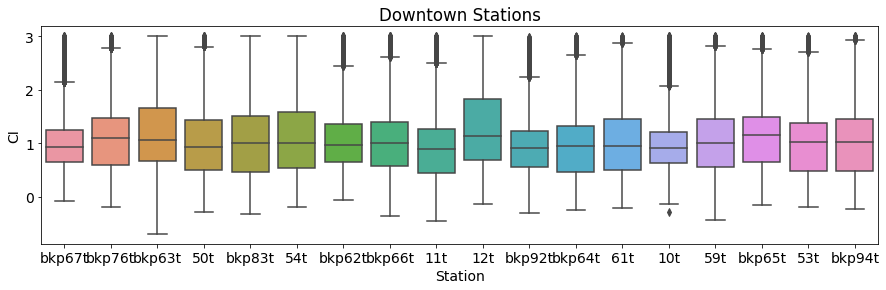

In [29]:
_, ax = plt.subplots(1,1, figsize=(15, 4))
temp = ci.set_index('Time')
temp = temp[temp['CI']<3]
temp = temp[temp['Station'].isin(dt + bkp_dt)]

sns.boxplot(x='Station', y='CI', data=temp, ax=ax)
ax.set_title('Downtown Stations')

Text(0.5, 1.0, 'Sub-Urban Stations')

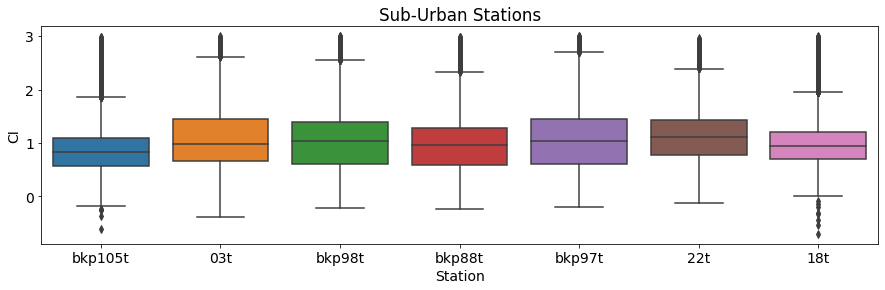

In [33]:
_, ax = plt.subplots(1,1, figsize=(15, 4))
temp = ci.set_index('Time')
temp = temp[temp['CI']<3]
temp = temp[temp['Station'].isin(sub + bkp_sub)]

sns.boxplot(x='Station', y='CI', data=temp, ax=ax)
ax.set_title('Sub-Urban Stations')

Text(0.5, 1.0, 'Rural Stations')

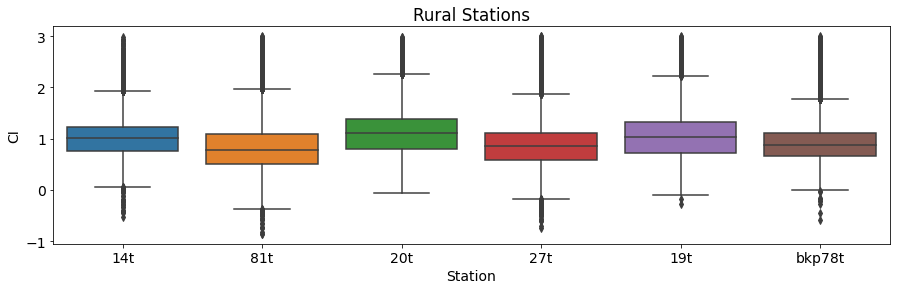

In [41]:
_, ax = plt.subplots(1,1, figsize=(15, 4))
temp = ci.set_index('Time')
temp = temp[temp['CI']<3]
temp = temp[temp['Station'].isin(out + bkp_out)]

sns.boxplot(x='Station', y='CI', data=temp, ax=ax)
ax.set_title('Rural Stations')

                CI
zone              
downtown  1.048210
out       0.964422
suburban  1.029718
urban     1.021356
                CI
zone              
downtown  0.985284
out       0.938800
suburban  0.976951
urban     0.932501


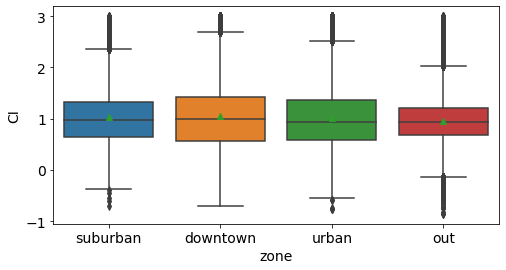

In [45]:
_, ax = plt.subplots(1,1, figsize=(8, 4))
temp = ci.set_index('Time')
temp = temp[temp['CI']<3]

sns.boxplot(x='zone', y='CI', data=temp, showmeans=True)
print(temp.groupby('zone').mean())
print(temp.groupby('zone').median())

Text(0.5, 1.0, 'Compare Downtown and Rural Stations')

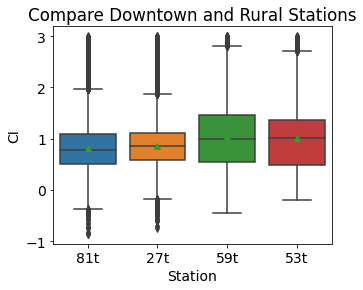

In [46]:
station_list = ['59t', '53t', '81t', '27t']

_, ax = plt.subplots(1,1, figsize=(5, 4))
temp = ci.set_index('Time')
temp = temp[temp['CI']<3]
temp = temp[temp['Station'].isin(station_list)]

sns.boxplot(x='Station', y='CI', data=temp, ax=ax, showmeans=True)
ax.set_title('Compare Downtown and Rural Stations')

- Focus on monsoon season. Find variation downtown stations and correlated with CI.
Omit bad data. 
- Build RF to predict the traffic index

In [46]:
ci_clean_p = ci_clean.set_index('Time').pivot(columns='Station')
ci_clean_p.columns =  ci_clean_p.columns.get_level_values(1)

ci_clean_p = add_season(ci_clean_p, start_month='-11-01', end_month='-03-31')
ci_clean_p['month'] = ci_clean_p.index.month

# remove strange hour 
ci_clean_p  = ci_clean_p[~ci_clean_p.index.hour.isin([14, 15, 16, 23, 0])]

# remove those outside the winter season
ci_clean_p_winter = ci_clean_p[ci_clean_p['season'] != 'other']
# monsoon season 
ci_clean_p_other = ci_clean_p[ci_clean_p['month'].isin([6,7,8])]

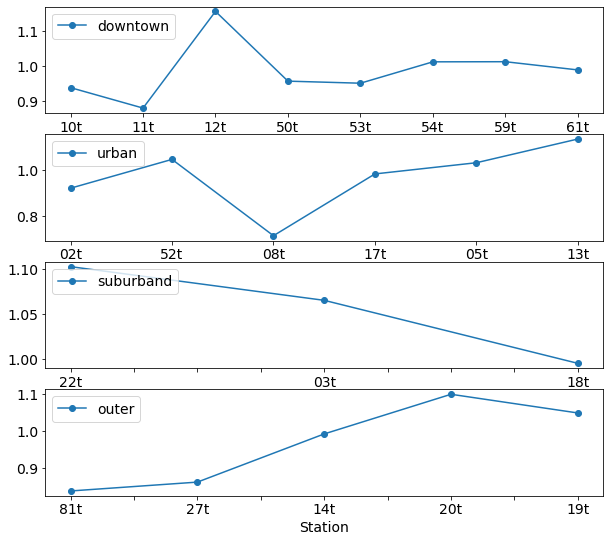

In [63]:
# compare the average among stations
zone_name_list = ['downtown', 'urban', 'suburband', 'outer']
mean_winter = ci_clean_p_winter.mean(axis=0)
_, ax = plt.subplots(4,1, figsize=(10, 9))
for i, zone in enumerate([dt_all, ub_all , sub_all, out_all ]):
    
    mean_winter[zone].plot(ax = ax[i], label=zone_name_list[i], marker='o')
    ax[i].legend(loc='upper left')

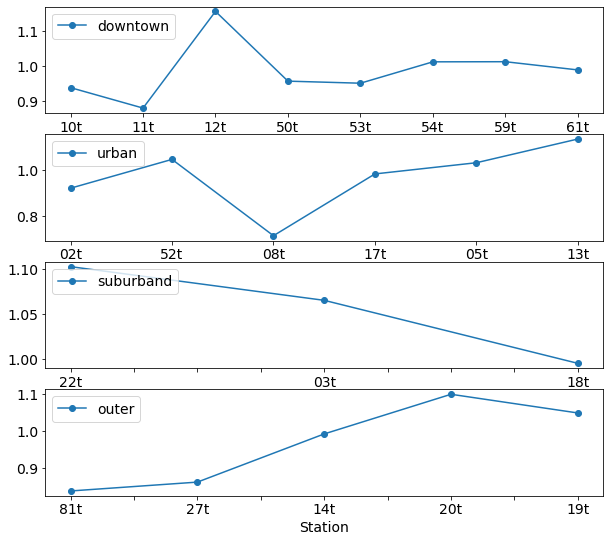

In [64]:
# compare the average among stations
zone_name_list = ['downtown', 'urban', 'suburband', 'outer']
mean_monsoon = ci_clean_p_other.mean(axis=0)
_, ax = plt.subplots(4,1, figsize=(10, 9))
for i, zone in enumerate([dt_all, ub_all , sub_all, out_all ]):
    mean_winter[zone].plot(ax = ax[i], label=zone_name_list[i], marker='o')
    ax[i].legend(loc='upper left')

In [47]:
start_date = '2018-01-01'
end_date = '2020-02-28'
# average between zones 
zone_name_list = ['downtown', 'urban', 'sub-urban', 'outer']
ci_zone = []
for i, station_list in enumerate(pcd_bkp_station_zone):
    s = ci_clean_p_winter[station_list].loc[start_date:end_date].mean(axis=1).dropna() 
    s = pd.DataFrame(s)
    s.columns = [zone_name_list[i]]
    ci_zone.append(s)
    
ci_zone = pd.concat(ci_zone, axis=1)

# average between zones 
# non pollution season
zone_name_list = ['downtown', 'urban', 'sub-urban', 'outer']
ci_zone_other = []
for i, station_list in enumerate(pcd_bkp_station_zone):
    s = ci_clean_p_other[station_list].loc[start_date:end_date].mean(axis=1).dropna() 
    s = pd.DataFrame(s)
    s.columns = [zone_name_list[i]]
    ci_zone_other.append(s)
    
ci_zone_other = pd.concat(ci_zone_other, axis=1)

In [48]:
for zone1, zone2 in zip([zone_name_list[0]]*3, zone_name_list[1:]):
    print(f'---{zone1} and {zone2}---')
    # difference btween two station
    arr1 = ci_zone[zone1].dropna().values
    arr2 = ci_zone[zone2].dropna().values

    t, p = ttest_ind(arr1, arr2, equal_var=False)
    difference = round(np.mean(arr2) - np.mean(arr1), 2)
    mean_drop = round(difference/np.mean(arr1) *100, 2)
    
    print('mean1', round(np.mean(arr1),2), 'mean2', round(np.mean(arr2),2))
    print(difference, 'mean drop (%)', mean_drop)
    print( 't-test p value', p)

---downtown and urban---
mean1 0.86 mean2 0.78
-0.08 mean drop (%) -9.3
t-test p value 2.562397589153108e-23
---downtown and sub-urban---
mean1 0.86 mean2 0.81
-0.05 mean drop (%) -5.81
t-test p value 8.689889873509513e-09
---downtown and outer---
mean1 0.86 mean2 0.7
-0.16 mean drop (%) -18.6
t-test p value 6.934746177912975e-107


In [49]:
for zone1, zone2 in zip([zone_name_list[0]]*3, zone_name_list[1:]):
    print(f'---{zone1} and {zone2}---(off season)')
    # difference btween two station
    arr1 = ci_zone_other[zone1].dropna().values
    arr2 = ci_zone_other[zone2].dropna().values

    t, p = ttest_ind(arr1, arr2, equal_var=False)
    difference = round(np.mean(arr2) - np.mean(arr1), 2)
    mean_drop = round(difference/np.mean(arr1) *100, 2)
    
    print('mean1', round(np.mean(arr1),2), 'mean2', round(np.mean(arr2),2))
    print(difference, 'mean drop (%)', mean_drop)
    print( 't-test p value', p)

---downtown and urban---(off season)
mean1 0.9 mean2 0.82
-0.08 mean drop (%) -8.88
t-test p value 6.906135028786523e-14
---downtown and sub-urban---(off season)
mean1 0.9 mean2 0.85
-0.05 mean drop (%) -5.55
t-test p value 1.6898545202169608e-06
---downtown and outer---(off season)
mean1 0.9 mean2 0.72
-0.18 mean drop (%) -19.97
t-test p value 1.3885592109804014e-80


In [40]:
dataset = Dataset('Bangkok')

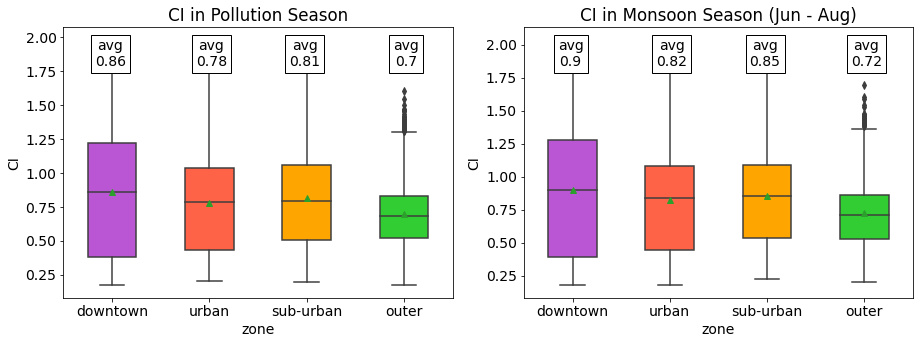

In [50]:
fig, ax = plt.subplots(1,2, figsize=(13, 5))

bplot1 = sns.boxplot(x='variable', y='value', data=ci_zone.melt().dropna(), width=0.5, ax=ax[0], showmeans=True )
bplot2 = sns.boxplot(x='variable', y='value', data=ci_zone_other.melt().dropna(), width=0.5, ax=ax[1], showmeans=True)

colors = ['mediumorchid', 'tomato', 'orange', 'limegreen']
# change color of the boxplot
for i in range(0,4):
    mybox = bplot1.artists[i]
    mybox.set_facecolor(colors[i])
    mybox = bplot2.artists[i]
    mybox.set_facecolor(colors[i])


position_list = [0.12, 0.38, 0.62, 0.88 ]
mean_winter = ci_zone.mean(axis=0).values.round(2)
mean_monsoon = ci_zone_other.mean(axis=0).values.round(2)

for po, mean1, mean2 in zip(position_list, mean_winter, mean_monsoon):
    ax[0].text(po, 0.90, 'avg\n'+str(mean1), horizontalalignment='center', verticalalignment='center', color='black', transform=ax[0].transAxes, bbox=dict(facecolor='white'))
    ax[1].text(po, 0.90, 'avg\n'+str(mean2), horizontalalignment='center', verticalalignment='center', color='black', transform=ax[1].transAxes, bbox=dict(facecolor='white'))


ax[0].set_title('CI in Pollution Season')
ax[1].set_title('CI in Monsoon Season (Jun - Aug)')
#ax[0].set_ylim([0, 80])
#ax[1].set_ylim([0, 40])
for a in ax:
    a.set_ylabel('CI')
    a.set_xlabel('zone')
    
plt.tight_layout()

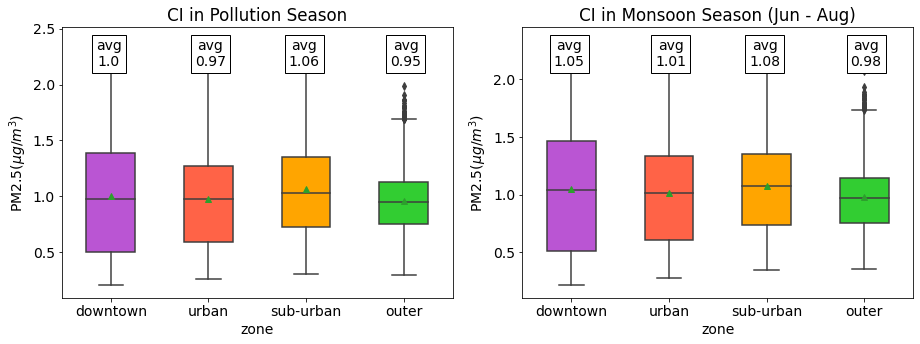

In [70]:
fig, ax = plt.subplots(1,2, figsize=(13, 5))

bplot1 = sns.boxplot(x='variable', y='value', data=ci_zone.melt().dropna(), width=0.5, ax=ax[0], showmeans=True )
bplot2 = sns.boxplot(x='variable', y='value', data=ci_zone_other.melt().dropna(), width=0.5, ax=ax[1], showmeans=True)

colors = ['mediumorchid', 'tomato', 'orange', 'limegreen']
# change color of the boxplot
for i in range(0,4):
    mybox = bplot1.artists[i]
    mybox.set_facecolor(colors[i])
    mybox = bplot2.artists[i]
    mybox.set_facecolor(colors[i])


position_list = [0.12, 0.38, 0.62, 0.88 ]
mean_winter = ci_zone.mean(axis=0).values.round(2)
mean_monsoon = ci_zone_other.mean(axis=0).values.round(2)

for po, mean1, mean2 in zip(position_list, mean_winter, mean_monsoon):
    ax[0].text(po, 0.90, 'avg\n'+str(mean1), horizontalalignment='center', verticalalignment='center', color='black', transform=ax[0].transAxes, bbox=dict(facecolor='white'))
    ax[1].text(po, 0.90, 'avg\n'+str(mean2), horizontalalignment='center', verticalalignment='center', color='black', transform=ax[1].transAxes, bbox=dict(facecolor='white'))


ax[0].set_title('CI in Pollution Season')
ax[1].set_title('CI in Monsoon Season (Jun - Aug)')
#ax[0].set_ylim([0, 80])
#ax[1].set_ylim([0, 40])
for a in ax:
    a.set_ylabel('CI')
    a.set_xlabel('zone')
    
plt.tight_layout()
#plt.savefig(dataset.report_folder + 'compare_bkk_metro_area_no2.png')

## NO2

In [10]:
data_folder = '../data/aqm_hourly_final/'

# load data for all stations 
poll_station = []
station_first_day = []
for station in all_stations_list:
    filename = data_folder + station + '.csv'
    df = pd.read_csv(filename)
    df['datetime'] = pd.to_datetime(df['datetime'])
    df = df.set_index('datetime').loc['2011':, 'NO2']
    # print the first day of each station 
    station_first_day.append([station, df.dropna().index.min()])
    poll_station.append(df)

    
poll_station = pd.concat(poll_station, axis=1)
poll_station.columns = all_stations_list  

In [11]:
# combine zone from each stations  
dt_all = (dt + ['bkp56t']     )
ub_all = (ub + ['bkp57t'] )
sub_all = sub  
out_all = out 

pcd_bkp_station_zone = [dt_all, ub_all, sub_all, out_all]

In [12]:
poll_station = add_season(poll_station, start_month='-11-01', end_month='-03-31')
poll_station['month'] = poll_station.index.month

# remove strange hours and hours with high winds in the CI data 
#poll_station  = poll_station[~poll_station.index.hour.isin([14, 15, 16, 23, 0])]

# remove those outside the winter season
poll_station_winter = poll_station[poll_station['season'] != 'other']
# monsoon season 
poll_station_other = poll_station[poll_station['month'].isin([6,7,8])]

In [55]:
start_date = '2018-01-01'
end_date = '2020-02-28'
# average between zones 
zone_name_list = ['downtown', 'urban', 'sub-urban', 'outer']
poll_zone = []
for i, station_list in enumerate(pcd_bkp_station_zone):
    s = poll_station_winter[station_list].loc[start_date:end_date].mean(axis=1).dropna() 
    s = pd.DataFrame(s)
    s.columns = [zone_name_list[i]]
    poll_zone.append(s)
    
poll_zone = pd.concat(poll_zone, axis=1)

# average between zones 
# non pollution season
zone_name_list = ['downtown', 'urban', 'sub-urban', 'outer']
poll_zone_other = []
for i, station_list in enumerate(pcd_bkp_station_zone):
    s = poll_station_other[station_list].loc[start_date:end_date].mean(axis=1).dropna() 
    s = pd.DataFrame(s)
    s.columns = [zone_name_list[i]]
    poll_zone_other.append(s)
    
poll_zone_other = pd.concat(poll_zone_other, axis=1)

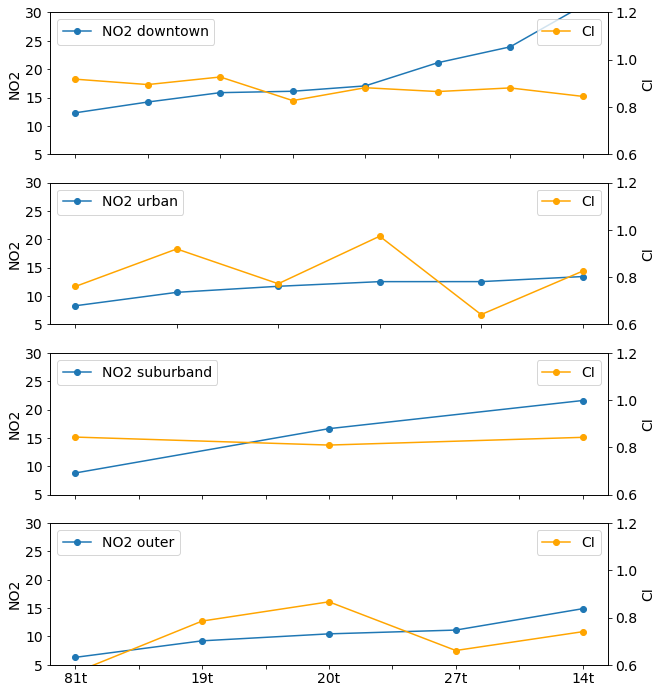

In [70]:
# compare the average among stations
zone_name_list = ['downtown', 'urban', 'suburband', 'outer']
mean_monsoon = poll_station_other.mean(axis=0)
mean_monsoon_ci = ci_clean_p_other.mean(axis=0)

_, ax = plt.subplots(4,1, figsize=(10, 12), sharex=False)

for i, zone in enumerate([dt_all, ub_all , sub_all, out_all ]):
    
    temp = mean_monsoon[zone].sort_values()
    
    temp.plot(ax = ax[i], label='NO2 '+zone_name_list[i], marker='o')
    ax[i].legend(loc='upper left')
    
    a = ax[i].twinx()
    mean_monsoon_ci[temp.index.to_list()].plot(ax = a, label='CI', marker='o', color='orange')
    a.legend(loc='upper right')
    
     
    ax[i].set_ylabel('NO2')
    a.set_ylabel('CI')
    a.set_ylim([0.6,1.2])
    ax[i].set_ylim([5, 30])

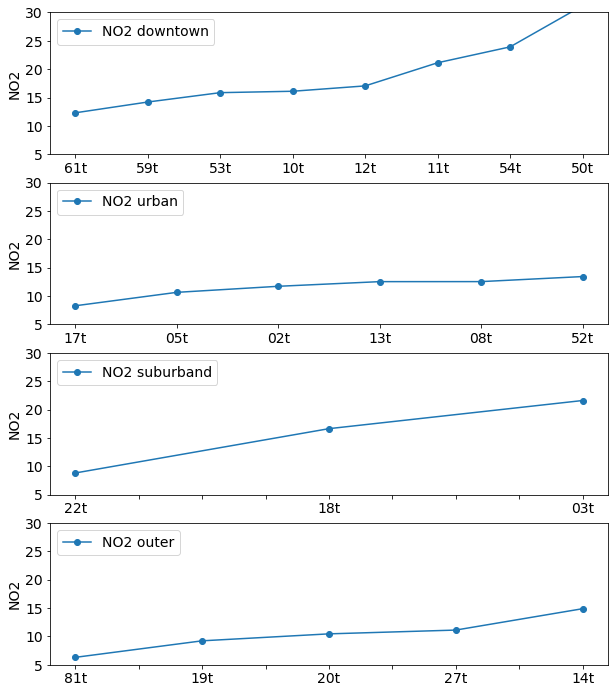

In [71]:
# compare the average among stations
zone_name_list = ['downtown', 'urban', 'suburband', 'outer']
mean_monsoon = poll_station_other.mean(axis=0)
mean_monsoon_ci = ci_clean_p_other.mean(axis=0)

_, ax = plt.subplots(4,1, figsize=(10, 12), sharex=False)

for i, zone in enumerate([dt_all, ub_all , sub_all, out_all ]):
    
    temp = mean_monsoon[zone].sort_values()
    
    temp.plot(ax = ax[i], label='NO2 '+zone_name_list[i], marker='o')
    ax[i].legend(loc='upper left')
    
    
    ax[i].set_ylabel('NO2')
    a.set_ylabel('CI')
    a.set_ylim([0.6,1.2])
    ax[i].set_ylim([5, 30])

Text(0.5, 0, 'station')

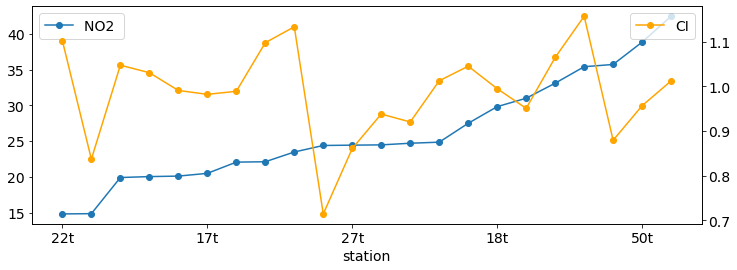

In [78]:
mean_winter = poll_station_winter.mean(axis=0)
mean_winter_ci = ci_clean_p_winter.mean(axis=0)

_, ax = plt.subplots(1,1, figsize=(12, 4), sharex=False)

temp = mean_winter.sort_values().drop(['year','month'])
temp.plot(ax = ax, label='NO2 ', marker='o')

a = ax.twinx()
mean_winter_ci[temp.index.to_list()].plot(ax = a, label='CI', marker='o', color='orange')
a.legend(loc='upper right')


ax.legend()
ax.set_xlabel('station')

Text(0.5, 0, 'station')

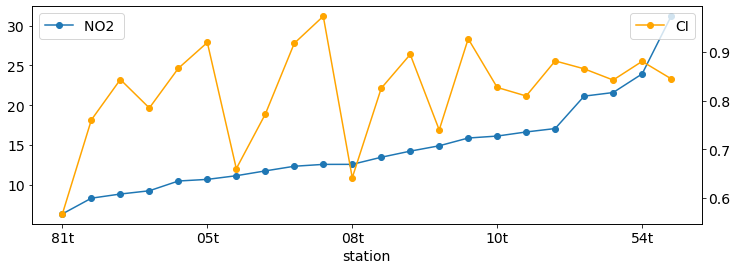

In [69]:
mean_monsoon = poll_station_other.mean(axis=0)
mean_monsoon_ci = ci_clean_p_other.mean(axis=0)

_, ax = plt.subplots(1,1, figsize=(12, 4), sharex=False)

temp = mean_monsoon.sort_values().drop(['year','month'])
temp.plot(ax = ax, label='NO2 ', marker='o')

a = ax.twinx()
mean_monsoon_ci[temp.index.to_list()].plot(ax = a, label='CI', marker='o', color='orange')
a.legend(loc='upper right')


ax.legend()
ax.set_xlabel('station')

In [59]:
poll_melt = poll_station.melt(ignore_index=False, var_name='station', value_name='NO2')
poll_melt = poll_melt.reset_index()
poll_melt.head()

,datetime,station,NO2
0,2011-01-01 00:00:00,10t,42
1,2011-01-01 01:00:00,10t,NaN
2,2011-01-01 02:00:00,10t,NaN
3,2011-01-01 03:00:00,10t,40
4,2011-01-01 04:00:00,10t,37


In [60]:
ci_poll = ci_clean.merge(poll_melt, right_on=['datetime', 'station'], left_on=['Time', 'Station'], how='inner')
ci_poll = ci_poll.dropna()
ci_poll['NO2'] = ci_poll['NO2'].astype(float)

In [61]:
ci_poll_winter = ci_poll[ci_poll['Time'].dt.month.isin([1,11,12])]
ci_poll_monsoon = ci_poll[ci_poll['Time'].dt.month.isin([6,7,8])]


ci_poll_monsoon['hour_of_day'] = ci_poll_monsoon['Time'].dt.hour
ci_poll_winter['hour_of_day'] = ci_poll_winter['Time'].dt.hour

Text(0.5, 1.0, 'monsoon season')

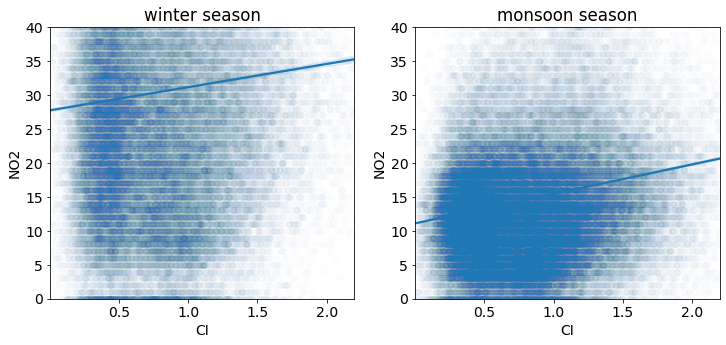

In [62]:
_, ax = plt.subplots(1,2, figsize=(12,5))
temp = ci_poll_winter

sns.regplot(data=temp, x = 'CI', y='NO2', scatter_kws={'alpha':0.01}, ax=ax[0])
ax[0].set_ylim([0, 40])

ax[0].set_title('winter season')

temp = ci_poll_monsoon
sns.regplot(data=temp, x = 'CI', y='NO2', scatter_kws={'alpha':0.01}, ax=ax[1])
ax[1].set_ylim([0, 40])

ax[1].set_title('monsoon season')

Text(0.5, 1.0, 'monsoon season')

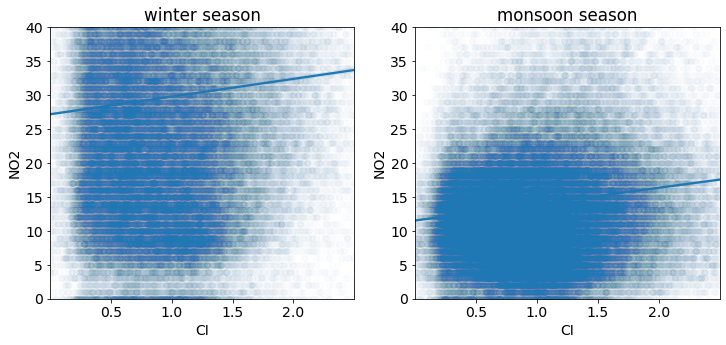

In [190]:
_, ax = plt.subplots(1,2, figsize=(12,5))
temp = ci_poll_winter

sns.regplot(data=temp, x = 'CI', y='NO2', scatter_kws={'alpha':0.01}, ax=ax[0])
ax[0].set_ylim([0, 40])

ax[0].set_title('winter season')

temp = ci_poll_monsoon
sns.regplot(data=temp, x = 'CI', y='NO2', scatter_kws={'alpha':0.01}, ax=ax[1])
ax[1].set_ylim([0, 40])

ax[1].set_title('monsoon season')

(0.0, 50.0)

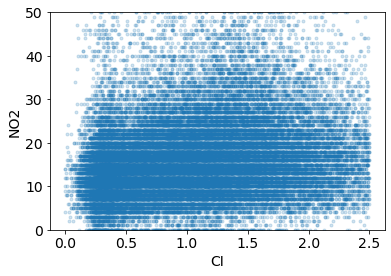

In [183]:
temp = ci_poll_monsoon[ci_poll_monsoon['station'].isin(dt_all)]
plt.scatter(temp['CI'], temp['NO2'], marker='.', alpha=0.2)

plt.xlabel('CI')
plt.ylabel('NO2')
#plt.yscale('log')
plt.ylim([0, 50])

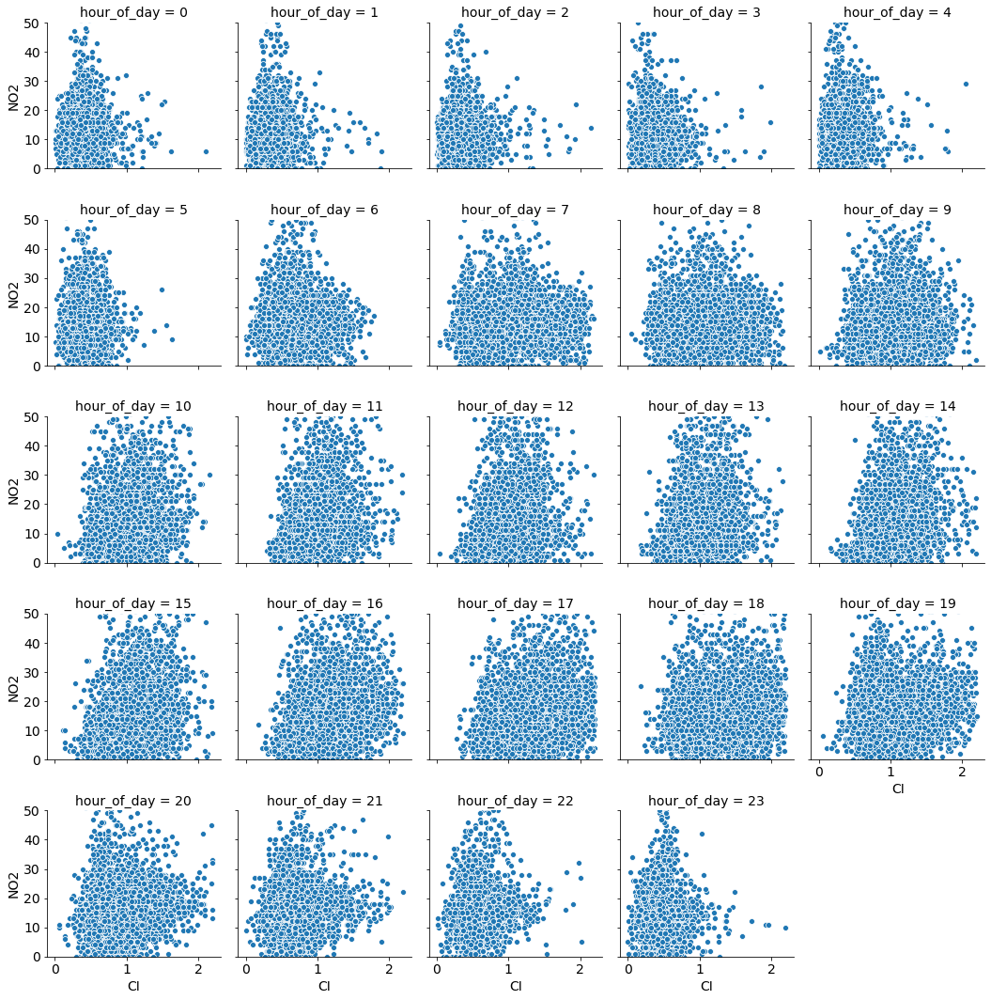

In [68]:
temp = ci_poll_monsoon[ci_poll_monsoon['station'].isin(dt_all)]
temp = ci_poll_monsoon

g = sns.relplot(x="CI", y="NO2",  
            col="hour_of_day", col_wrap=5,
            height=3, data=temp)

#
#g.set(xscale='log')
#g.set(yscale='log')
g.set(ylim=(0, 50))

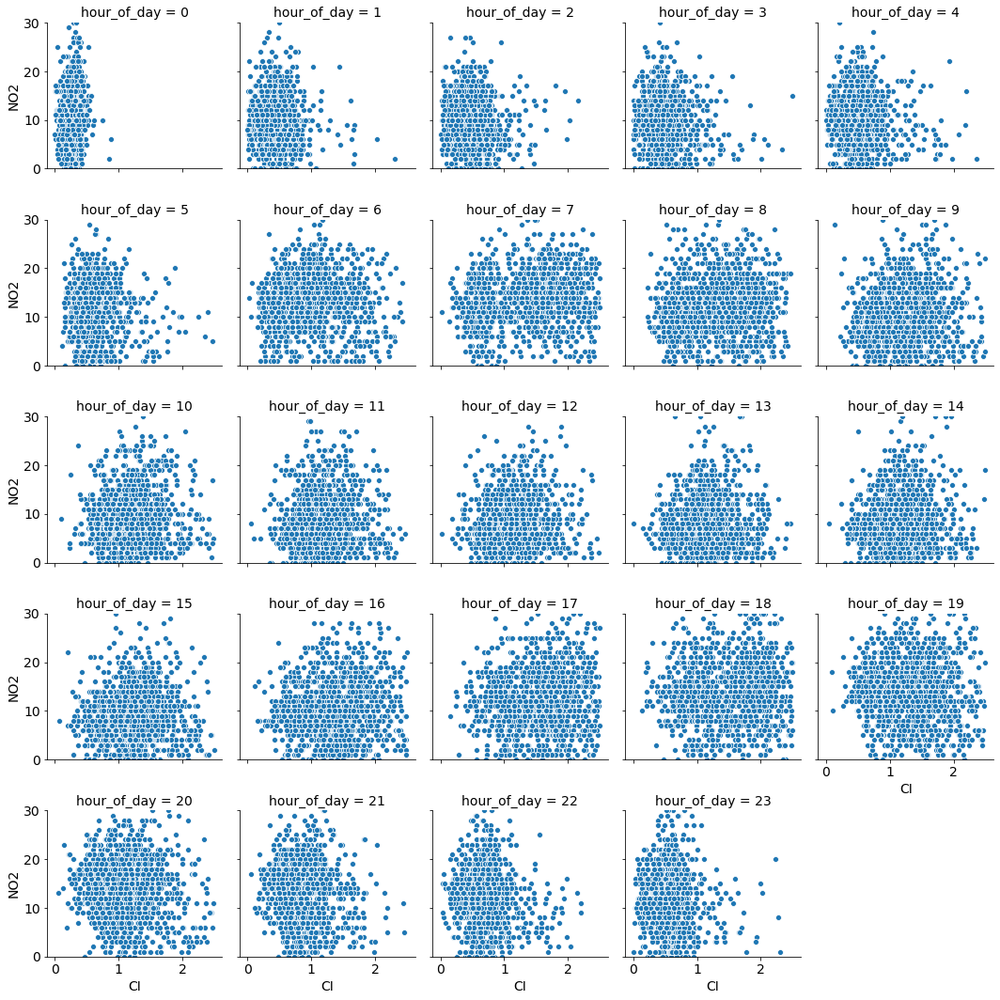

In [125]:
temp = ci_poll_monsoon[ci_poll_monsoon['station'].isin(ub_all)]

g = sns.relplot(x="CI", y="NO2",  
            col="hour_of_day", col_wrap=5,
            height=3, data=temp)

#
#g.set(xscale='log')
#g.set(yscale='log')
g.set(ylim=(0, 30))

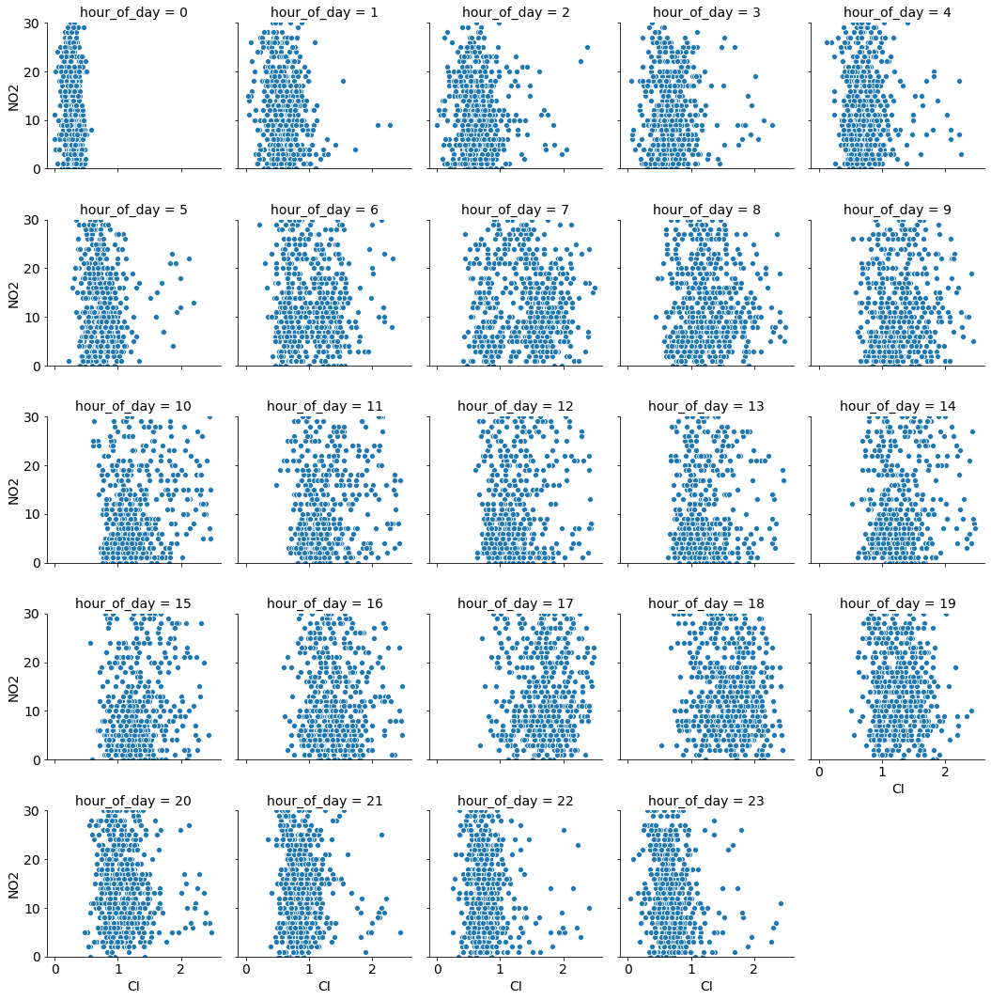

In [127]:
temp = ci_poll_monsoon[ci_poll_monsoon['station'].isin(sub_all)]

g = sns.relplot(x="CI", y="NO2",  
            col="hour_of_day", col_wrap=5,
            height=3, data=temp)

#
#g.set(xscale='log')
#g.set(yscale='log')
g.set(ylim=(0, 30))

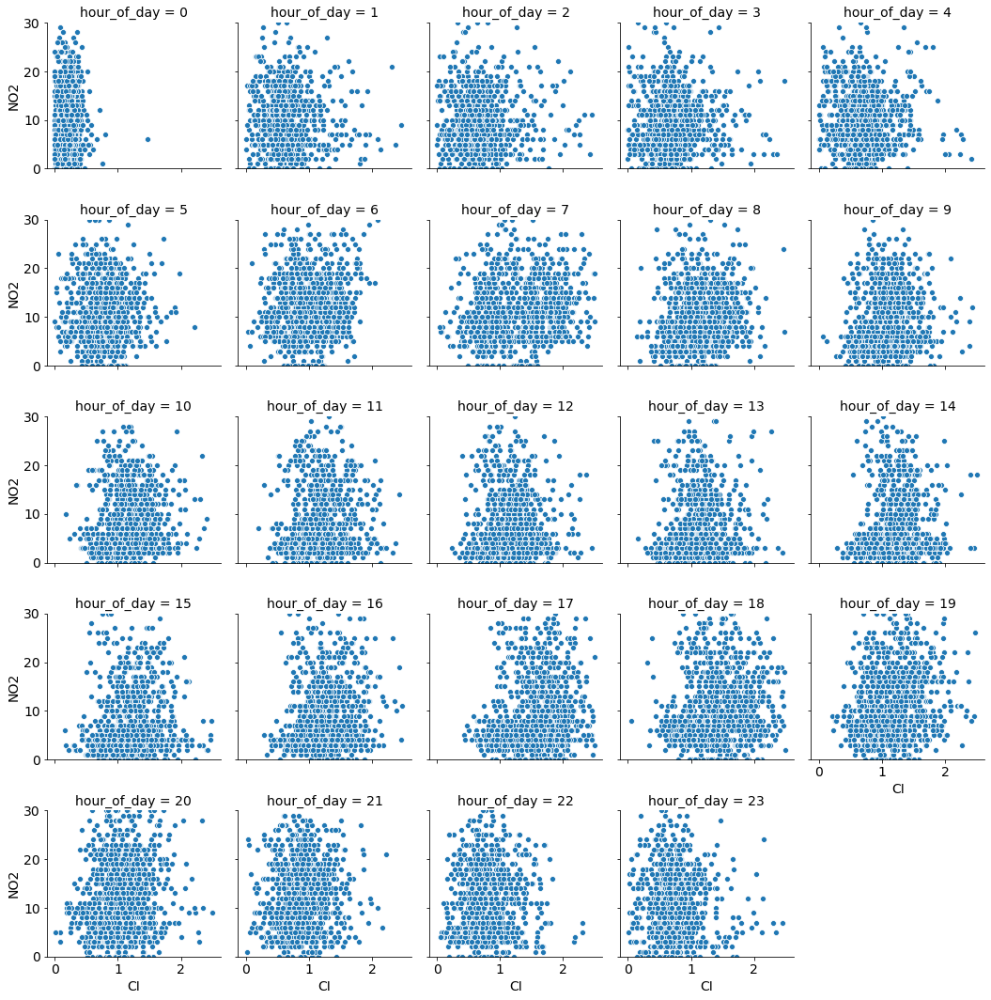

In [128]:
temp = ci_poll_monsoon[ci_poll_monsoon['station'].isin(out_all)]

g = sns.relplot(x="CI", y="NO2",  
            col="hour_of_day", col_wrap=5,
            height=3, data=temp)

#
#g.set(xscale='log')
#g.set(yscale='log')
g.set(ylim=(0, 30))

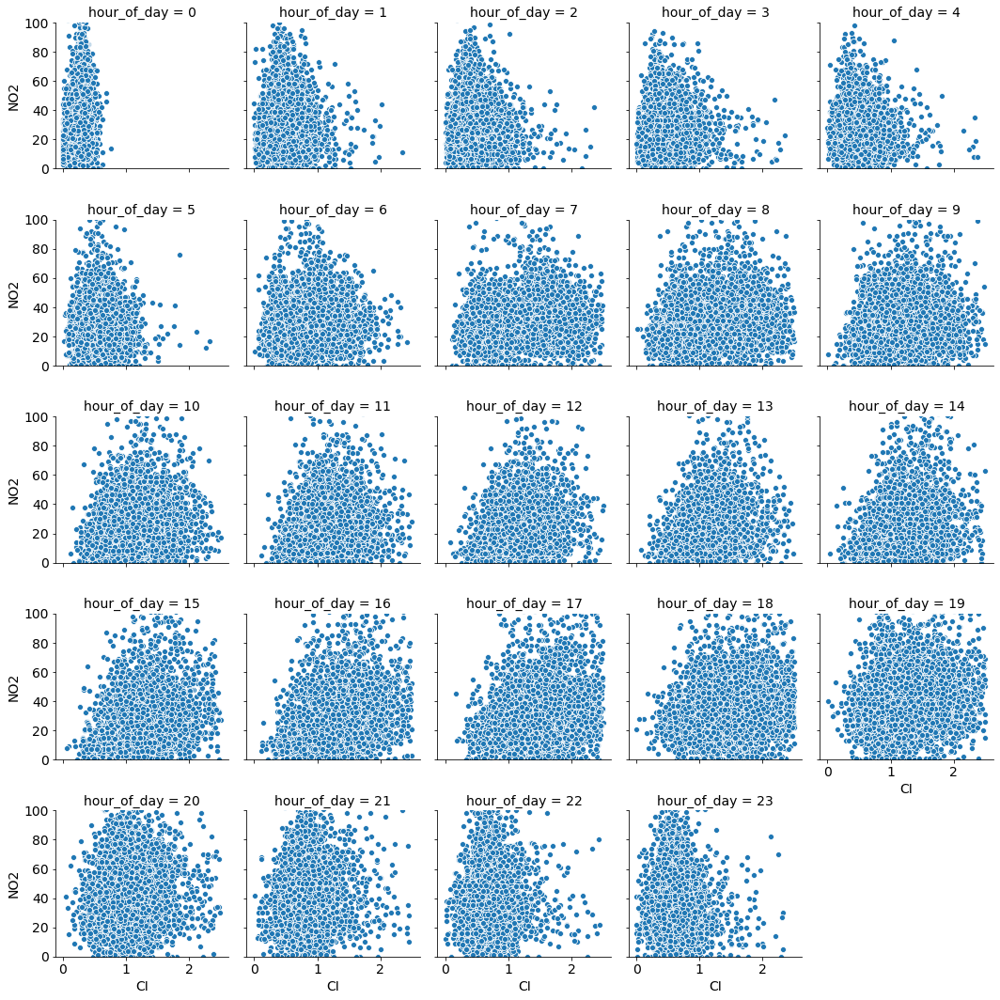

In [104]:
g = sns.relplot(x="CI", y="NO2",  
            col="hour_of_day", col_wrap=5,
            height=3, data=ci_poll_winter)

g.set(ylim=(0, 100))

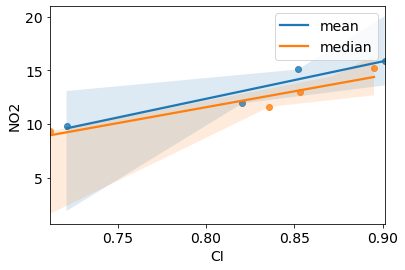

In [63]:
df = pd.concat([poll_zone_other.mean(), ci_zone_other.mean()], axis=1)
df.columns = ['NO2', 'CI']

_, ax = plt.subplots(1,1)
sns.regplot(x='CI', y='NO2', data=df, ax=ax)

df = pd.concat([poll_zone_other.median(), ci_zone_other.median()], axis=1)
df.columns = ['NO2', 'CI']

sns.regplot(x='CI', y='NO2', data=df, ax=ax)

ax.legend(['mean', 'median'])

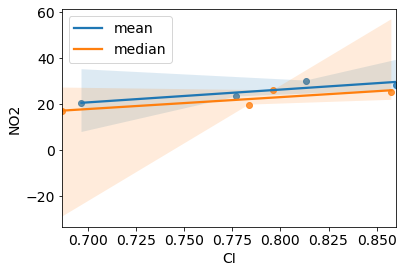

In [64]:
df = pd.concat([poll_zone.mean(), ci_zone.mean()], axis=1)
df.columns = ['NO2', 'CI']

_, ax = plt.subplots(1,1)
sns.regplot(x='CI', y='NO2', data=df, ax=ax)

df = pd.concat([poll_zone .median(), ci_zone.median()], axis=1)
df.columns = ['NO2', 'CI']

sns.regplot(x='CI', y='NO2', data=df, ax=ax)

ax.legend(['mean', 'median'], loc='upper left')

In [65]:
ci_zone_melt = ci_zone.melt(ignore_index=False, value_name='CI', var_name='zone').reset_index()
poll_zone_melt = poll_zone.melt(ignore_index=False, value_name='NO2', var_name='zone').reset_index()

ci_poll_zone_melt = ci_zone_melt.merge(poll_zone_melt, right_on=['datetime', 'zone'], left_on=['Time', 'zone'])

In [66]:
ci_zone_other_melt = ci_zone_other.melt(ignore_index=False, value_name='CI', var_name='zone').reset_index()
poll_zone_other_melt = poll_zone_other.melt(ignore_index=False, value_name='NO2', var_name='zone').reset_index()

ci_poll_zone_other = ci_zone_other_melt.merge(poll_zone_other_melt, right_on=['datetime', 'zone'], left_on=['Time', 'zone'])

Text(0.5, 1.0, 'monsoon season')

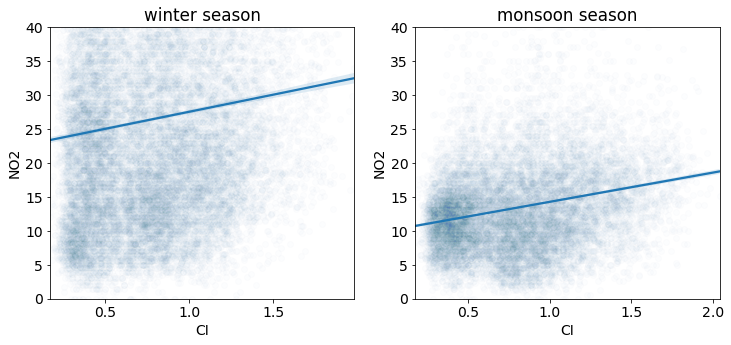

In [67]:
_, ax = plt.subplots(1,2, figsize=(12,5))
temp = ci_poll_zone_melt

sns.regplot(data=temp, x = 'CI', y='NO2', scatter_kws={'alpha':0.01}, ax=ax[0])
ax[0].set_ylim([0, 40])

ax[0].set_title('winter season')

temp = ci_poll_zone_other
sns.regplot(data=temp, x = 'CI', y='NO2', scatter_kws={'alpha':0.01}, ax=ax[1])
ax[1].set_ylim([0, 40])

ax[1].set_title('monsoon season')

In [178]:
ci_poll_zone_other.sort_values('Time').head()[['Time', 'CI', 'NO2', 'zone']]

,Time,CI,NO2,zone
0,2018-06-01 01:00:00,0.360979,21.750000,downtown
3387,2018-06-01 01:00:00,0.634108,16.000000,urban
10161,2018-06-01 01:00:00,0.700295,11.333333,outer
6774,2018-06-01 01:00:00,0.510724,13.000000,sub-urban
10162,2018-06-01 02:00:00,0.459456,9.000000,outer


## NO2 Nearest Neighbors

In [38]:
data_folder = '../data/aqm_hourly_final/'

# load data for all stations 
poll_station = []
station_first_day = []
for station in all_stations_list:
    filename = data_folder + station + '.csv'
    df = pd.read_csv(filename)
    df['datetime'] = pd.to_datetime(df['datetime'])
    df = df.set_index('datetime').loc['2011':, 'NO2']
    # print the first day of each station 
    station_first_day.append([station, df.dropna().index.min()])
    poll_station.append(df)

bkp_folder = '../data/bkp_hourly/'
bkp_all_stations_list_short = [s.replace('kp', '') for s in bkp_all_stations_list]

bkp_no2_station = []
for station in np.hstack(bkp_stations_zone): 
    filename = bkp_folder = '../data/bkp_hourly/'+ station + '.csv'
    df = pd.read_csv(filename)
    df['datetime'] = pd.to_datetime(df['datetime'])
    
    if 'NO2' in df.columns:
        bkp_no2_station.append(station)
        df = df.set_index('datetime').loc['2011':, 'NO2']
        # print the first day of each station 
        station_first_day.append([station, df.dropna().index.min()])
        poll_station.append(df)
    
poll_station = pd.concat(poll_station, axis=1)
poll_station.columns = all_stations_list + bkp_no2_station

In [161]:
# combine zone from each stations  
dt_all = (dt + ['bkp56t']     )
ub_all = (ub + ['bkp57t'] )
sub_all = sub  
out_all = out 

pcd_bkp_station_zone = [dt_all, ub_all, sub_all, out_all]

In [162]:
poll_station = add_season(poll_station, start_month='-11-01', end_month='-03-31')
poll_station['month'] = poll_station.index.month

# remove strange hours and hours with high winds in the CI data 
#poll_station  = poll_station[~poll_station.index.hour.isin([14, 15, 16, 23, 0])]

# remove those outside the winter season
poll_station_winter = poll_station[poll_station['season'] != 'other']
# monsoon season 
poll_station_other = poll_station[poll_station['month'].isin([6,7,8])]

In [163]:
no2_station_all = pd.concat([all_stations.drop('index', axis=1), no2_bkp_station], ignore_index=True)

no2_station_all = all_stations.drop('index', axis=1)
no2_station_all.head()

,stationID,nameTH,nameEN,areaTH,areaEN,stationType,lat,long,forecast,LastUpdate,long_m,lat_m
0,02t,มหาวิทยาลัยราชภัฏบ้านสมเด็จเจ้าพระยา,Bansomdejchaopraya Rajabhat University,"แขวงหิรัญรูจี เขตธนบุรี, กรุงเทพฯ","Hiran Ruchi, Khet Thon Buri, Bangkok",GROUND,13.732846,100.487662,[],"{'date': '2021-05-21', 'time': '09:00', 'PM25'...",1.118624e+07,1.543584e+06
1,03t,ริมถนนทางหลวงหมายเลข 3902,Highway NO.3902 km.13 +600,"ริมถนนกาญจนาภิเษก เขตบางขุนเทียน, กรุงเทพฯ","Kanchanaphisek Rd, Bang Khun Thian, Bangkok",GROUND,13.636514,100.414262,[],"{'date': '2021-05-21', 'time': '09:00', 'PM25'...",1.117806e+07,1.532547e+06
2,05t,กรมอุตุนิยมวิทยาบางนา,Thai Meteorological Department,"แขวงบางนา เขตบางนา, กรุงเทพฯ","Bang Na, Khet Bang Na, Bangkok",GROUND,13.666183,100.605742,[],"{'date': '2021-05-21', 'time': '09:00', 'PM25'...",1.119938e+07,1.535946e+06
16,08t,ศูนย์ฟื้นฟูอาชีพคนพิการและทุพลภาพ,Prabadang Rehabiltation Center,"ต.ทรงคนอง อ.พระประแดง, สมุทรปราการ","Song Kanong, Phra Pradaeng, Samut Prakan",GROUND,13.664087,100.543436,[],"{'date': '2021-05-21', 'time': '09:00', 'PM25'...",1.119244e+07,1.535706e+06
3,10t,เคหะชุมชนคลองจั่น,National Housing Authority Klongchan,"แขวงคลองจั่น เขตบางกะปิ, กรุงเทพฯ","Khlong Chan, Khet Bang Kapi, Bangkok",GROUND,13.779873,100.646009,[],"{'date': '2021-05-21', 'time': '09:00', 'PM25'...",1.120386e+07,1.548974e+06


In [225]:
# find the nearest stations 
near_station_dict = {}
for station in (all_stations_list):

    row = no2_station_all[no2_station_all['stationID'] == station]
    long_m = row.iloc[0]['long_m'] 
    lat_m = row.iloc[0]['lat_m']

    df = no2_station_all[['stationID']]

    df['distance'] =   ((no2_station_all['long_m'] - long_m)**2 + (no2_station_all['lat_m'] - lat_m)**2 )
    
    near_station_dict[station] = df.sort_values('distance').iloc[:2]['stationID'].to_list()

In [226]:
near_station_dict

{'10t': ['10t', '61t'],
 '11t': ['11t', '54t'],
 '12t': ['12t', '50t'],
 '50t': ['50t', '12t'],
 '53t': ['53t', '11t'],
 '54t': ['54t', '11t'],
 '59t': ['59t', '54t'],
 '61t': ['61t', '10t'],
 '02t': ['02t', '52t'],
 '52t': ['52t', '02t'],
 '08t': ['08t', '17t'],
 '17t': ['17t', '08t'],
 '05t': ['05t', '08t'],
 '13t': ['13t', '22t'],
 '22t': ['22t', '13t'],
 '03t': ['03t', '52t'],
 '18t': ['18t', '05t'],
 '81t': ['81t', '14t'],
 '27t': ['27t', '14t'],
 '14t': ['14t', '03t'],
 '20t': ['20t', '22t'],
 '19t': ['19t', '18t']}

In [221]:
# calculate the new average 
ci_station_avg = []
poll_station_avg = []
for station in (all_stations_list ):
    temp = ci[ci['Station'].isin(near_station_dict[station])][['Time', 'CI']]
    temp = temp.groupby('Time').mean()
    temp.columns = [station]
    ci_station_avg.append(temp)
    
    temp = poll_station[near_station_dict[station]].mean(axis=1)
    temp = pd.DataFrame(temp, columns=[station])
    poll_station_avg.append(temp)
    
ci_station_avg = pd.concat(ci_station_avg, axis=1).round(5)
poll_station_avg = pd.concat(poll_station_avg, axis=1).round(1)

# separate winter & monsoon season
poll_station_avg = add_season(poll_station_avg, start_month='-11-01', end_month='-03-31')
poll_station_avg['month'] = poll_station_avg.index.month

# remove strange hours and hours with high winds in the CI data 
poll_station_avg  = poll_station_avg[~poll_station_avg.index.hour.isin([14, 15, 16])]

# remove those outside the winter season
poll_station_avg_winter = poll_station_avg[poll_station_avg['season'] != 'other']
# monsoon season 
poll_station_avg_other = poll_station_avg[poll_station_avg['month'].isin([5, 6,7,8, 9])]


# separate winter & monsoon season
ci_station_avg = add_season(ci_station_avg, start_month='-11-01', end_month='-03-31')
ci_station_avg['month'] = ci_station_avg.index.month

# remove strange hours and hours with high winds in the CI data 
ci_station_avg  = ci_station_avg[~ci_station_avg.index.hour.isin([14, 15, 16])]

# remove those outside the winter season
ci_station_avg_winter = ci_station_avg[ci_station_avg['season'] != 'other']
# monsoon season 
ci_station_avg_other = ci_station_avg[ci_station_avg['month'].isin([5, 6,7,8,9])]

Text(0.5, 0, 'station')

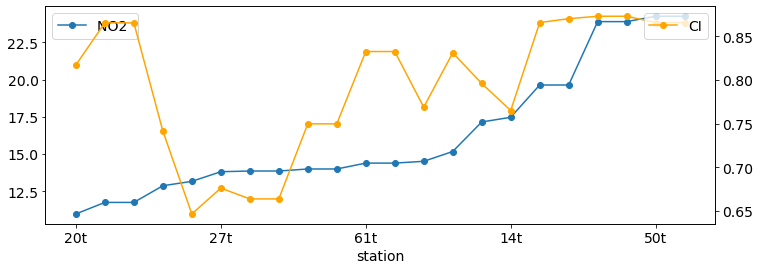

In [214]:
mean_monsoon = poll_station_avg_other.mean(axis=0)
mean_monsoon_ci = ci_station_avg_other.mean(axis=0)

_, ax = plt.subplots(1,1, figsize=(12, 4), sharex=False)

temp = mean_monsoon.sort_values().drop(['year','month'])
temp.plot(ax = ax, label='NO2 ', marker='o')

a = ax.twinx()
mean_monsoon_ci[temp.index.to_list()].plot(ax = a, label='CI', marker='o', color='orange')
a.legend(loc='upper right')


ax.legend()
ax.set_xlabel('station')

SpearmanrResult(correlation=0.6181303116147309, pvalue=0.0021697570917961332)
pearson  (0.5158259084981663, 0.01399886129520658)


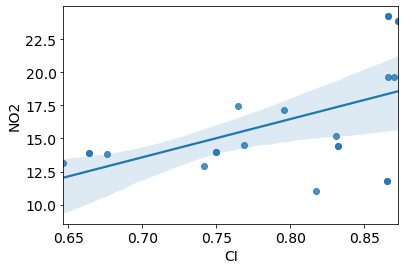

In [215]:
df = pd.concat([ mean_monsoon, mean_monsoon_ci], axis=1)
df.columns = ['NO2', 'CI']
df = df.drop(['year', 'month'])
sns.regplot(df['CI'], df['NO2'])

print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

Text(0.5, 0, 'station')

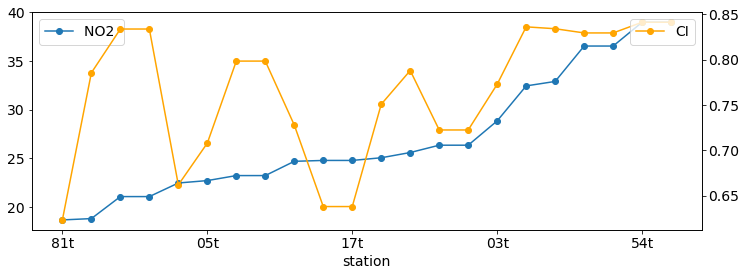

In [216]:
mean_winter = poll_station_avg_winter.mean(axis=0)
mean_winter_ci = ci_station_avg_winter.mean(axis=0)

_, ax = plt.subplots(1,1, figsize=(12, 4), sharex=False)

temp = mean_winter.sort_values().drop(['year','month'])
temp.plot(ax = ax, label='NO2 ', marker='o')

a = ax.twinx()
mean_winter_ci[temp.index.to_list()].plot(ax = a, label='CI', marker='o', color='orange')
a.legend(loc='upper right')


ax.legend()
ax.set_xlabel('station')


SpearmanrResult(correlation=0.4946175637393768, pvalue=0.01927743077061528)
pearson  (0.5361697645621717, 0.010104617244650019)
SpearmanrResult(correlation=0.6181303116147309, pvalue=0.0021697570917961332)
pearson  (0.5158259084981663, 0.01399886129520658)


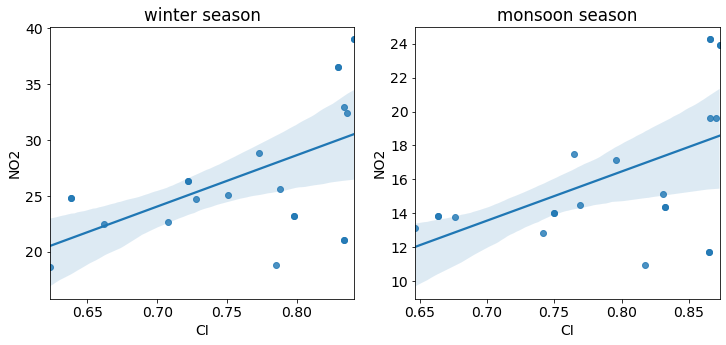

In [217]:
_, ax = plt.subplots(1,2, figsize=(12,5))
df = pd.concat([ mean_winter, mean_winter_ci], axis=1)
df.columns = ['NO2', 'CI']
df = df.drop(['year', 'month'])

sns.regplot(df['CI'], df['NO2'], ax=ax[0])

print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

ax[0].set_title('winter season')


df = pd.concat([ mean_monsoon, mean_monsoon_ci], axis=1)
df.columns = ['NO2', 'CI']
df = df.drop(['year', 'month'])
sns.regplot(df['CI'], df['NO2'], ax=ax[1])

ax[1].set_title('monsoon season')


print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))


SpearmanrResult(correlation=0.14216012920716684, pvalue=0.0)
pearson  (0.12527733037735564, 0.0)


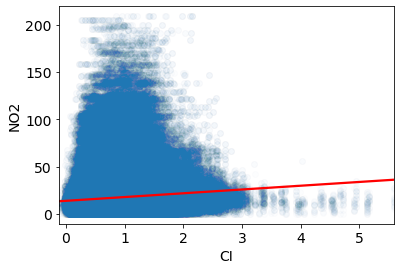

In [218]:
poll_melt_other = poll_station_avg_other.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='NO2')
ci_melt_other = ci_station_avg_other.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='CI')

poll_ci_other = poll_melt_other.merge(ci_melt_other, right_index=True, left_index=True, on='station')

df = poll_ci_other.dropna()

sns.regplot(df['CI'], df['NO2'], scatter_kws={'alpha':0.01}, line_kws={"color": "red"})

print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

SpearmanrResult(correlation=0.08395140660706196, pvalue=0.0)
pearson  (0.07725014881043556, 0.0)


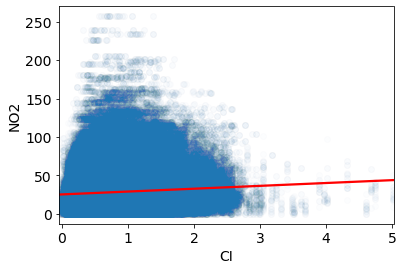

In [219]:
poll_melt_winter = poll_station_avg_winter.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='NO2')
ci_melt_winter = ci_station_avg_winter.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='CI')

poll_ci_winter = poll_melt_winter.merge(ci_melt_winter, right_index=True, left_index=True, on='station')

df = poll_ci_winter.dropna()

sns.regplot(df['CI'], df['NO2'], scatter_kws={'alpha':0.01}, line_kws={"color": "red"})

print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

In [233]:
# find the nearest stations 
near_station_dict = {}
for station in (all_stations_list):

    row = no2_station_all[no2_station_all['stationID'] == station]
    long_m = row.iloc[0]['long_m'] 
    lat_m = row.iloc[0]['lat_m']

    df = no2_station_all[['stationID']]

    df['distance'] =   ((no2_station_all['long_m'] - long_m)**2 + (no2_station_all['lat_m'] - lat_m)**2 )
    
    near_station_dict[station] = df.sort_values('distance').iloc[:1]['stationID'].to_list()
 

# no average 

# find the nearest stations 
near_station_dict = {}
for station in (all_stations_list):

    row = no2_station_all[no2_station_all['stationID'] == station]
    long_m = row.iloc[0]['long_m'] 
    lat_m = row.iloc[0]['lat_m']

    df = no2_station_all[['stationID']]

    df['distance'] =   ((no2_station_all['long_m'] - long_m)**2 + (no2_station_all['lat_m'] - lat_m)**2 )
    
    near_station_dict[station] = df.sort_values('distance').iloc[:2]['stationID'].to_list()

# calculate the new average 
ci_station_avg = []
poll_station_avg = []
for station in (all_stations_list ):
    temp = ci[ci['Station'].isin(near_station_dict[station])][['Time', 'CI']]
    temp = temp.groupby('Time').mean()
    temp.columns = [station]
    ci_station_avg.append(temp)
    
    temp = poll_station[near_station_dict[station]].mean(axis=1)
    temp = pd.DataFrame(temp, columns=[station])
    poll_station_avg.append(temp)
    
ci_station_avg = pd.concat(ci_station_avg, axis=1).round(5)
poll_station_avg = pd.concat(poll_station_avg, axis=1).round(1)

# separate winter & monsoon season
poll_station_avg = add_season(poll_station_avg, start_month='-11-01', end_month='-03-31')
poll_station_avg['month'] = poll_station_avg.index.month

# remove strange hours and hours with high winds in the CI data 
poll_station_avg  = poll_station_avg[~poll_station_avg.index.hour.isin([14, 15, 16])]

# remove those outside the winter season
poll_station_avg_winter = poll_station_avg[poll_station_avg['season'] != 'other']
# monsoon season 
poll_station_avg_other = poll_station_avg[poll_station_avg['month'].isin([5, 6,7,8, 9])]


# separate winter & monsoon season
ci_station_avg = add_season(ci_station_avg, start_month='-11-01', end_month='-03-31')
ci_station_avg['month'] = ci_station_avg.index.month

# remove strange hours and hours with high winds in the CI data 
ci_station_avg  = ci_station_avg[~ci_station_avg.index.hour.isin([14, 15, 16])]

# remove those outside the winter season
ci_station_avg_winter = ci_station_avg[ci_station_avg['season'] != 'other']
# monsoon season 
ci_station_avg_other = ci_station_avg[ci_station_avg['month'].isin([5, 6,7,8,9])]

In [240]:
# average ignore stations
poll_melt_other = poll_station_avg_other.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='NO2')
poll_melt_other = poll_melt_other.groupby(axis=0,level=0).mean()
ci_melt_other = ci_station_avg_other.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='CI')
ci_melt_other = ci_melt_other.groupby(axis=0,level=0).mean()

poll_ci_other = poll_melt_other.merge(ci_melt_other, right_index=True, left_index=True )

poll_melt_winter = poll_station_avg_winter.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='NO2')
ci_melt_winter = ci_station_avg_winter.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='CI')
poll_melt_winter = poll_melt_winter.groupby(axis=0,level=0).mean()
ci_melt_winter = ci_melt_winter.groupby(axis=0,level=0).mean()

poll_ci_winter = poll_melt_winter.merge(ci_melt_winter, right_index=True, left_index=True )

SpearmanrResult(correlation=0.15871552216118676, pvalue=5.741626881646082e-38)
pearson  (0.12602298554794147, 1.907886494777629e-24)
SpearmanrResult(correlation=0.32093137990197423, pvalue=5.110407907177618e-209)
pearson  (0.27787298822501383, 4.621637217179073e-155)


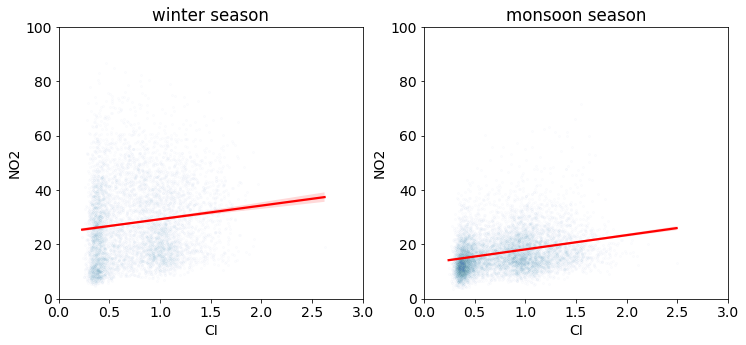

In [244]:
_, ax = plt.subplots(1,2, figsize=(12,5))

df = poll_ci_winter.dropna()
sns.regplot(df['CI'], df['NO2'], scatter_kws={'alpha':0.01, 's':5}, line_kws={"color": "red"}, ax=ax[0])

print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

ax[0].set_title('winter season')
ax[0].set_ylim([0, 100])
ax[0].set_xlim([0, 3])



df = poll_ci_other.dropna()
sns.regplot(df['CI'], df['NO2'], scatter_kws={'alpha':0.01, 's':5}, line_kws={"color": "red"}, ax=ax[1])

ax[1].set_title('monsoon season')
ax[1].set_ylim([0, 100])
ax[1].set_xlim([0, 3])


print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

In [247]:
# find the nearest stations 
near_station_dict = {}
for station in (all_stations_list):

    row = no2_station_all[no2_station_all['stationID'] == station]
    long_m = row.iloc[0]['long_m'] 
    lat_m = row.iloc[0]['lat_m']

    df = no2_station_all[['stationID']]

    df['distance'] =   ((no2_station_all['long_m'] - long_m)**2 + (no2_station_all['lat_m'] - lat_m)**2 )
    
    near_station_dict[station] = df.sort_values('distance').iloc[:2]['stationID'].to_list()

# calculate the new average 
ci_station_avg = []
poll_station_avg = []
for station in (all_stations_list ):
    temp = ci[ci['Station'].isin(near_station_dict[station])][['Time', 'CI']]
    temp = temp.groupby('Time').mean()
    temp.columns = [station]
    ci_station_avg.append(temp)
    
    temp = poll_station[near_station_dict[station]].mean(axis=1)
    temp = pd.DataFrame(temp, columns=[station])
    poll_station_avg.append(temp)
    
ci_station_avg = pd.concat(ci_station_avg, axis=1).round(5)
poll_station_avg = pd.concat(poll_station_avg, axis=1).round(1)

# separate winter & monsoon season
poll_station_avg = add_season(poll_station_avg, start_month='-11-01', end_month='-03-31')
poll_station_avg['month'] = poll_station_avg.index.month

# remove strange hours and hours with high winds in the CI data 
poll_station_avg  = poll_station_avg[~poll_station_avg.index.hour.isin([14, 15, 16])]

# remove those outside the winter season
poll_station_avg_winter = poll_station_avg[poll_station_avg['season'] != 'other']
# monsoon season 
poll_station_avg_other = poll_station_avg[poll_station_avg['month'].isin([5, 6,7,8, 9])]


# separate winter & monsoon season
ci_station_avg = add_season(ci_station_avg, start_month='-11-01', end_month='-03-31')
ci_station_avg['month'] = ci_station_avg.index.month

# remove strange hours and hours with high winds in the CI data 
ci_station_avg  = ci_station_avg[~ci_station_avg.index.hour.isin([14, 15, 16])]

# remove those outside the winter season
ci_station_avg_winter = ci_station_avg[ci_station_avg['season'] != 'other']
# monsoon season 
ci_station_avg_other = ci_station_avg[ci_station_avg['month'].isin([5, 6,7,8,9])]

In [248]:
poll_melt_other = poll_station_avg_other.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='NO2')
ci_melt_other = ci_station_avg_other.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='CI')

poll_ci_other = poll_melt_other.merge(ci_melt_other, right_index=True, left_index=True, on='station')

poll_melt_winter = poll_station_avg_winter.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='NO2')
ci_melt_winter = ci_station_avg_winter.drop(['year', 'season','month'], axis=1).melt(ignore_index=False, var_name='station', value_name='CI')

poll_ci_winter = poll_melt_winter.merge(ci_melt_winter, right_index=True, left_index=True, on='station')

SpearmanrResult(correlation=0.08395140660706196, pvalue=0.0)
pearson  (0.07725014881043556, 0.0)
SpearmanrResult(correlation=0.14216012920716684, pvalue=0.0)
pearson  (0.12527733037735564, 0.0)


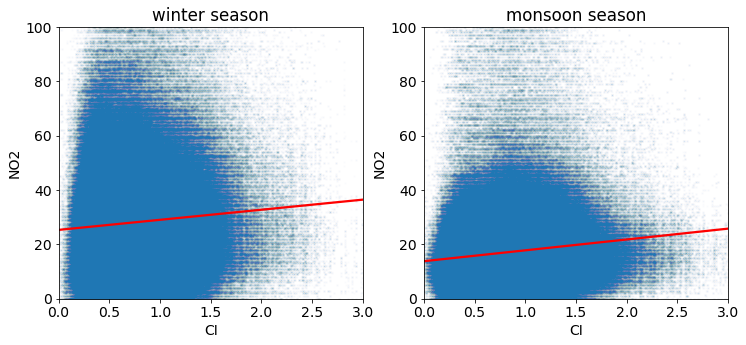

In [250]:
_, ax = plt.subplots(1,2, figsize=(12,5))

df = poll_ci_winter.dropna()
sns.regplot(df['CI'], df['NO2'], scatter_kws={'alpha':0.01, 's':2}, line_kws={"color": "red"}, ax=ax[0])

print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

ax[0].set_title('winter season')
ax[0].set_ylim([0, 100])
ax[0].set_xlim([0, 3])



df = poll_ci_other.dropna()
sns.regplot(df['CI'], df['NO2'], scatter_kws={'alpha':0.01, 's':2}, line_kws={"color": "red"}, ax=ax[1])

ax[1].set_title('monsoon season')
ax[1].set_ylim([0, 100])
ax[1].set_xlim([0, 3])


print(spearmanr(df['CI'].values, df['NO2'].values))
print('pearson ', pearsonr(df['CI'].values, df['NO2'].values))

# Traffic Model for Taxi Probe CI

In [33]:
# longdo traffic data 
t_folder = '../data/traffic/'
t_files = glob(t_folder + '*.csv')
longdo = []
for file in t_files[3:]:
    df = pd.read_csv(file)
    longdo.append(df)

longdo = pd.concat(longdo)
longdo['datetime'] = pd.to_datetime(longdo['datetime'])
longdo = longdo.set_index('datetime')

<AxesSubplot:xlabel='datetime'>

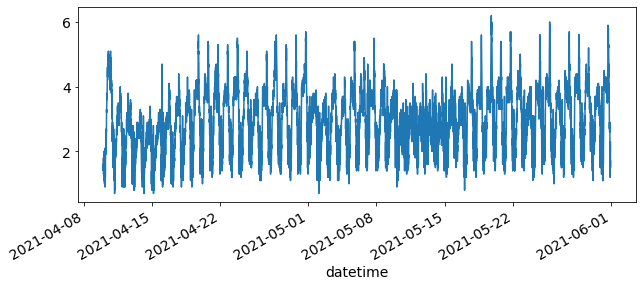

In [38]:
plt.figure(figsize=(10,4))
longdo.loc['2021-04-10':,'index'].plot()

In [53]:
file = '../data/traffic\\2017-2020_hourly_stats_final.csv'
ci_new = pd.read_csv(file)
ci_new['Time'] = pd.to_datetime(ci_new['Time'])
# take the average to compare to longdo data
ci_new_avg = ci_new.groupby('Time').mean()

# clean up strange value 
ci_clean = ci_new[(ci_new['CI']<2.2) & (ci_new['CI'] > 0)][['Time','Station','CI']]
keep_stations = ['02t', '03t', '05t', '11t', '12t', '50t', '52t', '53t', '59t', '61t']
ci_clean = ci_clean[ci_clean['Station'].isin(keep_stations)]
# take the average to compare to longdo data
ci_avg = ci_clean.groupby('Time').mean()


In [54]:
# use the city average CI
traffic = ci_avg[['CI']]
traffic.columns = ['traffic_index']

<AxesSubplot:xlabel='Time'>

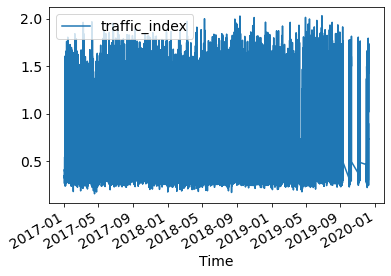

In [55]:
traffic.plot()

In [56]:
# load the dataset object
# load the data  
dataset = Dataset('Bangkok')
dataset.load_()

# merge data with weather
# assign this to data attribute to take advantage of the dataset object build-in functions
dataset.data = traffic.merge(dataset.wea, left_index=True, right_index=True,how='inner')
dataset.data = add_is_rain(dataset.data)
# drop only keep the columns related to the weather or weekend, which can  affect traffic 
to_drops = ['Humidity(%)', 'Wind', 'Wind_Speed(kmph)']
dataset.data = dataset.data.drop(to_drops, axis=1)

In [57]:
# add calenda information
dataset.data = add_calendar_info(dataset.data, holiday_file=dataset.data_folder + 'holiday.csv')
dataset.data.loc['2020-03-21':'2020-04-16','is_holiday'] = 1
# one hot encode the time of day columns
dataset.data = dummy_time_of_day(dataset.data, col='time_of_day', group_hour=1)
# one hot endcode day_of_week columns
dataset.data = dummy_day_of_week(dataset.data)
dataset.data = dataset.data[~dataset.data.index.duplicated(keep='first')]
dataset.data = dataset.data.dropna() 
actual_df = dataset.data

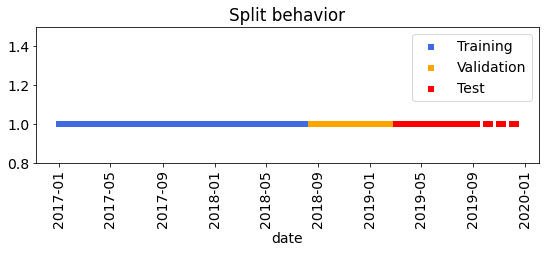

In [58]:
# use dataset split function
split_list = [0.6, 0.2, 0.2]
dataset.split_data(split_ratio=split_list)
display_time_split(dataset.split_list)

In [59]:
dataset.split_data(split_ratio=split_list)
dataset.monitor = 'traffic_index'
xtrn, ytrn, x_cols, weights = dataset.get_data_matrix(use_index=dataset.split_list[0])
xval, yval, *args = dataset.get_data_matrix(use_index=dataset.split_list[1])
dataset.x_cols = x_cols

model = do_rf_search(xtrn, ytrn, cv_split='other')
score_dict = cal_scores(yval, model.predict(xval), header_str='val_')
print('optimize 1 score', score_dict)  

best rf score  0.7850155210953675
optimize 1 score {'val_r2_score': 0.8296, 'val_r2': 0.919, 'val_mean_squared_error': 0.0315, 'val_mean_absolute_error': 0.1251, 'val_mean_absolute_percentage_error': 15.4123, 'val_median_absolute_error': 0.0813}


In [60]:
# merge train and validation and observe model performance in the test set 
# use dataset split function
split_list = [0.8, 0.2]
dataset.split_data(split_ratio=split_list)
xtrn, ytrn, x_cols, weights = dataset.get_data_matrix(use_index=dataset.split_list[0])
xtest, ytest, *args = dataset.get_data_matrix(use_index=dataset.split_list[1])
model.fit(xtrn,ytrn)
score_dict = cal_scores(ytest, model.predict(xtest), header_str='val_')
print('final score', score_dict)    

final score {'val_r2_score': 0.7601, 'val_r2': 0.884, 'val_mean_squared_error': 0.0493, 'val_mean_absolute_error': 0.1609, 'val_mean_absolute_percentage_error': 19.6568, 'val_median_absolute_error': 0.1135}


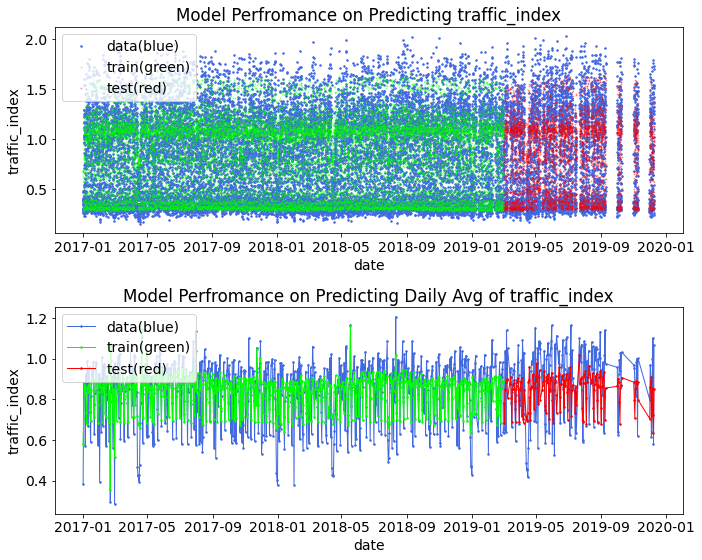

In [61]:
ytrn_pred_df, ytest_pred_df = plot_model_perf(dataset, model,split_list=[0.8,0.2],xlim=[], ylim=[],to_save=False)

In [64]:
print(x_cols)

['Temperature(C)', 'Pressure(hPa)', 'Precip.(mm)', 'is_rain', 'is_holiday', 'is_weekend', 'time_of_day_0', 'time_of_day_1', 'time_of_day_2', 'time_of_day_3', 'time_of_day_4', 'time_of_day_5', 'time_of_day_6', 'time_of_day_7', 'time_of_day_8', 'time_of_day_9', 'time_of_day_10', 'time_of_day_11', 'time_of_day_12', 'time_of_day_13', 'time_of_day_14', 'time_of_day_15', 'time_of_day_16', 'time_of_day_17', 'time_of_day_18', 'time_of_day_19', 'time_of_day_20', 'time_of_day_21', 'time_of_day_22', 'time_of_day_23', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5', 'day_of_week_6']


In [63]:
# save the rf model
pickle.dump(model,open(dataset.model_folder + f'traffic_ci_rf_model.pkl', 'wb'))

prediction

In [65]:
# load the dataset object  
dataset = Dataset('Bangkok')
dataset.load_()
dataset.monitor_col = 'traffix_index'

dataset.x_cols = ['Temperature(C)', 'Pressure(hPa)', 'Precip.(mm)', 'is_rain', 'is_holiday', 'is_weekend', 'time_of_day_0', 'time_of_day_1', 'time_of_day_2', 'time_of_day_3', 'time_of_day_4', 'time_of_day_5', 'time_of_day_6', 'time_of_day_7', 'time_of_day_8', 'time_of_day_9', 'time_of_day_10', 'time_of_day_11', 'time_of_day_12', 'time_of_day_13', 'time_of_day_14', 'time_of_day_15', 'time_of_day_16', 'time_of_day_17', 'time_of_day_18', 'time_of_day_19', 'time_of_day_20', 'time_of_day_21', 'time_of_day_22', 'time_of_day_23', 'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4', 'day_of_week_5', 'day_of_week_6']

In [66]:
model = pickle.load(open(dataset.model_folder + f'traffic_ci_rf_model.pkl','rb'))

In [67]:
# prepare the data for prediction 
# round the weather data to hour 
dataset.wea.index = dataset.wea.index.round(freq='H')
dataset.wea = dataset.wea[~dataset.wea.index.duplicated(keep='first')]
# assign to data 
dataset.data = dataset.wea
dataset.data = add_is_rain(dataset.data)
# drop only keep the columns related to the weather or weekend, which can  affect traffic 
to_drops = ['Humidity(%)', 'Wind', 'Wind_Speed(kmph)']
dataset.data = dataset.data.drop(to_drops, axis=1)

# add calenda information
dataset.data = add_calendar_info(dataset.data, holiday_file=dataset.data_folder + 'holiday.csv')
# fix COVID shutdown 
dataset.data.loc['2020-03-21':'2020-04-16','is_holiday'] = 1
# one hot encode the time of day columns
dataset.data = dummy_time_of_day(dataset.data, col='time_of_day', group_hour=1)
# one hot endcode day_of_week columns
dataset.data = dummy_day_of_week(dataset.data)
dataset.data = dataset.data[~dataset.data.index.duplicated(keep='first')]
dataset.data = dataset.data.dropna() 
print(dataset.data.shape)

(177242, 37)


In [68]:
# rearrange the colums to match the model columns
dataset.data = dataset.data[dataset.x_cols]

In [69]:
# convert to matrix
xtest = dataset.data.values
# predict the index 
ytest_predict = model.predict(xtest)

In [70]:
ytest_pred_df = pd.DataFrame(ytest_predict, columns=['predict'])
ytest_pred_df.index = dataset.data.index

Compare actual and predicted data.

Text(0, 0.5, 'traffic index')

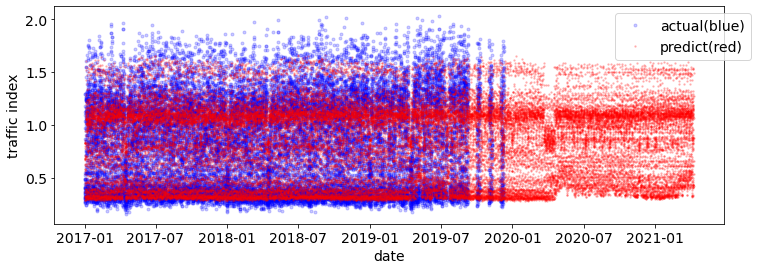

In [71]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

# compare the predict data and the actual traffix index 
ax.plot(traffic['traffic_index'], marker='.',
        label='actual(blue)', alpha=0.2, color='blue',linewidth=0)

 

ax.plot(ytest_pred_df['predict'].loc[traffic.index.min():],
        marker='.',
        label='predict(red)',
        linewidth=0,
        alpha=0.2,
        markersize=3, color='red')

ax.legend(bbox_to_anchor=(1.05, 1))
ax.set_xlabel('date')
ax.set_ylabel('traffic index')

In [72]:
# save traffic prediction
ytest_pred_df.to_csv(dataset.data_folder + 'traffic_ci_pred.csv' )

Replace the missing index with the predicted values

In [76]:
traffic = ytest_pred_df.merge(traffic, left_index=True, right_index=True, how='outer')

In [78]:
traffic['traffic_index'] = traffic['traffic_index'].fillna(traffic['predict'])

In [80]:
traffic[['traffic_index']].to_csv(dataset.data_folder + 'traffic_ci_pred.csv' )

In [82]:
temp = traffic[['traffic_index']].reset_index()
temp.columns = ['datetime', 'traffic_index']

In [83]:
temp.to_csv(dataset.data_folder + 'traffic.csv', index=False )

In [85]:
dataset.wea['Wind'].unique()

array(['WSW', 'CALM', 'S', 'SSW', 'SSE', 'SW', 'W', 'SE', 'ESE', 'NE',
       'NW', 'ENE', 'WNW', 'NNE', 'N', 'NNW', 'E', 'VAR'], dtype=object)

In [86]:
dataset.load_()

In [88]:
dataset.feature_no_fire()